In [1]:
from tqdm import tqdm
import numpy as np
from matplotlib import pyplot as plt
import torch
from torch import nn, optim
import torchvision

from datasets.synthetic import SyntheticAES__Finite, SyntheticAES__Infinite
from train.sam import SAM

In [2]:
target = 'hamming_weight'
dataset_size = int(1e4)
leakage_point = 64
data_transform = torchvision.transforms.Compose([
    torchvision.transforms.Lambda(lambda x: torch.tensor(x, dtype=torch.float))
])
target_transform = torchvision.transforms.Compose([
    torchvision.transforms.Lambda(lambda x: torch.tensor(x, dtype=torch.long))
])
dataset = SyntheticAES__Finite(dataset_size=dataset_size, hamming_weight_variance_prop=0.5, num_samples=128, points=np.array([leakage_point]), varying_noise_stdev=1.0, num_leaking_samples=1, num_xor_samples=0, target=target, delay_size=0)
train_dataset, holdout_dataset = torch.utils.data.random_split(dataset, (len(dataset)//2, len(dataset)-len(dataset)//2))

In [3]:
ax_width = ax_height = 6
traces_to_plot = 5
traces_to_average = dataset_size if np.isfinite(dataset_size) else int(1e4)
train_cnn = True
train_gan = True
batch_size = 256
training_steps = 500
rho = 0.05
adaptive_sam = False
lr = 1e-3 #2e-4

trace_kwargs = dict(linestyle='-', linewidth=0.5, marker='.', color='blue')

def plot_trace(trace, ax=None):
    if ax is None:
        ax = plt.subplots(figsize=(ax_width, ax_height))
    ax.plot(trace.squeeze(), **trace_kwargs)
    if dataset.leakage_points is not None:
        for x in dataset.leakage_points:
            ax.axvline(x, linestyle='--', color='red')
    if dataset.xor_samples is not None:
        for x in dataset.xor_samples:
            ax.axvline(x, linestyle='--', color='green')
    ax.set_xlabel('Time')
    ax.set_ylabel('Measurement')
    
def get_trace_means(dataset):
    trace_means = {}
    for idx, (trace, target) in enumerate(dataset):
        if not target in trace_means.keys():
            trace_means[target] = [np.zeros((1, dataset.num_samples), dtype=float), 0]
        trace_mean, trace_count = trace_means[target]
        trace_mean = (trace_count/(trace_count+1))*trace_mean + (1/(trace_count+1))*trace
        trace_count += 1
        trace_means[target][0] = trace_mean
        trace_means[target][1] = trace_count
        #if idx+1 >= traces_to_average:
        #    break
    return {key: val[0] for key, val in trace_means.items()}

def get_sum_of_differences(trace_means, dataset):
    sod = np.zeros((1, dataset.num_samples), dtype=float)
    for key1 in trace_means.keys():
        for key2 in trace_means.keys():
            if key1 == key2:
                continue
            diff = np.abs(trace_means[key1] - trace_means[key2])
            sod += diff
    return sod

def get_snr(trace_means, dataset):
    signal_variance = np.var(np.array(list(trace_means.values())), axis=0)
    noise_variance = np.zeros_like(list(trace_means.values())[0])
    for bidx, (trace, key) in enumerate(dataset):
        #if bidx >= traces_to_average:
        #    break
        noise_variance += (trace - trace_means[key])**2
    noise_variance /= len(dataset)
    snr = signal_variance / noise_variance
    return snr

class LinearClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(dataset.num_samples, 256 if target == 'identity' else 9)
        )
    
    def forward(self, x):
        return self.model(x)

class MLPClassifier(nn.Module):
    def __init__(self, layer_sizes=[512]):
        super().__init__()
        
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(dataset.num_samples, layer_sizes[0]),
            nn.ReLU(),
            *sum([[
                    nn.Linear(layer_sizes[idx], layer_sizes[idx+1]),
                    nn.ReLU()
                ] for idx in range(len(layer_sizes)-1)], start=[]),
            nn.Linear(layer_sizes[-1], 256 if target == 'identity' else 9)
        )
        
    def forward(self, x):
        return self.model(x)

class CnnClassifier(nn.Module):
    def __init__(self, cnn_kernels=[16, 32, 64], layer_sizes=[64, 64]):
        super().__init__()
        
        self.feature_extractor = nn.Sequential(*sum([
            [nn.Conv1d(c1, c2, kernel_size=11, padding=5), nn.BatchNorm1d(c2), nn.SELU(), nn.AvgPool1d(2)]
            for c1, c2 in zip([1]+cnn_kernels[:-1], cnn_kernels)
        ], start=[]))
        self.classifier = nn.Sequential(*sum([
            [nn.Linear(c1, c2), nn.SELU()]
            for c1, c2 in zip([cnn_kernels[-1]]+layer_sizes[:-1], layer_sizes)
        ], start=[]), nn.Linear(layer_sizes[-1], 256 if target == 'identity' else 9))
        self.logits_scalar = nn.Parameter(torch.tensor(np.log(np.exp(1) - 1)))
        
        self.apply(self.init_weights)
        
    def init_weights(self, m):
        if isinstance(m, (nn.Linear, nn.Conv1d)):
            nn.init.kaiming_uniform_(m.weight, nonlinearity='linear')
            m.bias.data.zero_()
    
    def forward(self, x, rescale_logits=False):
        x = self.feature_extractor(x)
        x = x.mean(dim=-1)
        x = self.classifier(x)
        if rescale_logits:
            x = nn.functional.softplus(self.logits_scalar) * x
        return x

class SnnClassifier(nn.Module):
    def __init__(self, layer_sizes=[4096]):
        super().__init__()
        
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(dataset.num_samples, layer_sizes[0]),
            nn.SELU(),
            *sum([[
                nn.Linear(layer_sizes[idx], layer_sizes[idx+1]),
                nn.SELU()
            ] for idx in range(len(layer_sizes)-1)], start=[]),
            nn.Linear(layer_sizes[-1], 256 if target == 'identity' else 9)
        )
        self.logits_scalar = nn.Parameter(torch.tensor(np.log(np.exp(1) - 1)))
        
        self.apply(self.init_weights)
    
    def init_weights(self, m):
        if isinstance(m, nn.Linear):
            nn.init.kaiming_uniform_(m.weight, nonlinearity='linear')
            m.bias.data.zero_()
    
    def forward(self, x, rescale_logits=False):
        logits = self.model(x)
        if rescale_logits:
            logits = nn.functional.softplus(self.logits_scalar) * logits
        return logits

class Mask(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.mask = nn.Parameter(torch.zeros(1, dataset.num_samples))
    
    def forward(self, x):
        return self.mask.expand(*x.size())

def train_model(model, train_dataset, holdout_dataset, num_steps=10000):
    dataset.transform = data_transform
    dataset.target_transform = target_transform
    dataloader = torch.utils.data.DataLoader(train_dataset, shuffle=hasattr(dataset, '__len__'), batch_size=batch_size, num_workers=1)
    holdout_dataloader = torch.utils.data.DataLoader(holdout_dataset, shuffle=hasattr(dataset, '__len__'), batch_size=batch_size, num_workers=1)
    #opt = optim.Adam([param for name, param in model.named_parameters() if name != 'logits_scalar'], lr=1e-3)
    opt = SAM([param for name, param in model.named_parameters() if name != 'logits_scalar'], optim.Adam, lr=lr, rho=rho, adaptive=adaptive_sam)
    temp_opt = optim.LBFGS([model.logits_scalar], lr=0, history_size=5, max_iter=5)
    #scheduler = optim.lr_scheduler.OneCycleLR(opt, max_lr=1e-2, div_factor=100, total_steps=num_steps, cycle_momentum=False)
    scheduler = None
    progress_bar = tqdm(total=num_steps)
    loss_values, acc_values = [], []
    holdout_loss_values, holdout_acc_values = [], []
    temps = []
    for _ in range(num_steps):
        trace, target = next(iter(dataloader))
        holdout_trace, holdout_target = next(iter(holdout_dataloader))
        if torch.cuda.is_available():
            trace, target = trace.cuda(), target.cuda()
            holdout_trace, holdout_target = holdout_trace.cuda(), holdout_target.cuda()
        def sam_closure(ret_logits=False):
            logits = model(trace)
            loss = nn.functional.cross_entropy(logits, target)
            loss.backward()
            if ret_logits:
                return loss, logits
            else:
                return loss
        opt.zero_grad()
        loss, logits = sam_closure(ret_logits=True)
        opt.step(sam_closure)
        loss_values.append(loss.item())
        acc_values.append(
            np.mean(np.equal(np.argmax(logits.detach().cpu().numpy(), axis=-1), target.detach().cpu().numpy()))
        )
        
        holdout_loss, holdout_logits = None, None
        def lbfgs_closure():
            nonlocal holdout_loss, holdout_logits
            holdout_logits = model(holdout_trace, rescale_logits=True)
            holdout_loss = nn.functional.cross_entropy(holdout_logits, holdout_target)
            temp_opt.zero_grad()
            holdout_loss.backward(inputs=[model.logits_scalar])
            return holdout_loss
        temp_opt.step(lbfgs_closure)
        holdout_loss_values.append(holdout_loss.item())
        holdout_acc_values.append(np.mean(np.equal(np.argmax(holdout_logits.detach().cpu().numpy(), axis=-1), holdout_target.detach().cpu().numpy())))
        temps.append(nn.functional.softplus(model.logits_scalar).item())
        
        progress_bar.update(1)
        if scheduler is not None:
            scheduler.step()
    dataset.transform = None
    dataset.target_transform = None
    return np.array(loss_values), np.array(acc_values), np.array(holdout_loss_values), np.array(holdout_acc_values), np.array(temps)

def train_model_and_mask(model, mask, train_dataset, holdout_dataset, num_steps=10000, l1_decay=1e1, eps=1e-12):
    dataset.transform = data_transform
    dataset.target_transform = target_transform
    dataloader = torch.utils.data.DataLoader(train_dataset, shuffle=hasattr(dataset, '__len__'), batch_size=batch_size, num_workers=1)
    holdout_dataloader = torch.utils.data.DataLoader(holdout_dataset, shuffle=hasattr(dataset, '__len__'), batch_size=batch_size, num_workers=1)
    model_opt = SAM([param for name, param in model.named_parameters() if name != 'logits_scalar'], optim.Adam, lr=lr, rho=rho, adaptive=adaptive_sam)
    temp_opt = optim.LBFGS([model.logits_scalar], lr=0, history_size=5, max_iter=5)
    mask_opt = optim.Adam(mask.parameters(), lr=lr)
    progress_bar = tqdm(total=num_steps)
    model_loss_values, mask_loss_values, acc_values, holdout_model_loss_values, holdout_mask_loss_values, holdout_acc_values, sparsity_values, mean_ratios, max_ratios = [], [], [], [], [], [], [], [], []
    temps = []
    best_mask, best_mean_ratio, best_mask_idx = None, 0.0, 0
    for step_idx in range(num_steps):
        trace, target = next(iter(dataloader))
        holdout_trace, holdout_target = next(iter(holdout_dataloader))
        if torch.cuda.is_available():
            trace, target = trace.cuda(), target.cuda()
            holdout_trace, holdout_target = holdout_trace.cuda(), holdout_target.cuda()
        
        with torch.no_grad():
            mask_val = nn.functional.sigmoid(mask(trace))
        masked_trace = mask_val*torch.randn_like(trace) + (1-mask_val)*trace
        def sam_closure(ret_logits=False):
            logits = model(masked_trace)
            model_loss = nn.functional.cross_entropy(logits, target)
            model_loss.backward()
            if ret_logits:
                return model_loss, logits
            else:
                return model_loss
        model_opt.zero_grad()
        model_loss, logits = sam_closure(ret_logits=True)
        model_opt.step(sam_closure)
        
        mask_val = nn.functional.sigmoid(mask(trace))
        masked_trace = mask_val*torch.randn_like(trace) + (1-mask_val)*trace
        logits = model(masked_trace, rescale_logits=True)
        mask_loss = -nn.functional.cross_entropy(logits, target) + l1_decay*nn.functional.l1_loss(mask_val, torch.zeros_like(mask_val))
        mask_opt.zero_grad()
        mask_loss.backward()
        mask_opt.step()
        
        holdout_mask_val = nn.functional.sigmoid(mask(holdout_trace))
        holdout_masked_trace = torch.where(holdout_mask_val > 0.5, torch.randn_like(trace), trace)
        holdout_model_loss, holdout_logits = None, None
        def lbfgs_closure():
            nonlocal holdout_model_loss, holdout_logits
            holdout_logits = model(holdout_masked_trace, rescale_logits=True)
            holdout_model_loss = nn.functional.cross_entropy(holdout_logits, holdout_target)
            temp_opt.zero_grad()
            holdout_model_loss.backward(inputs=[model.logits_scalar])
            return holdout_model_loss
        temp_opt.step(lbfgs_closure)
        holdout_mask_loss = -nn.functional.cross_entropy(holdout_logits, holdout_target) + l1_decay*nn.functional.l1_loss(holdout_mask_val, torch.zeros_like(holdout_mask_val))
        holdout_model_loss_values.append(holdout_model_loss.item())
        holdout_mask_loss_values.append(holdout_mask_loss.item())
        holdout_acc_values.append(np.mean(np.equal(np.argmax(holdout_logits.detach().cpu().numpy(), axis=-1), holdout_target.detach().cpu().numpy())))
        temps.append(nn.functional.softplus(model.logits_scalar).item())
        
        model_loss_values.append(model_loss.item())
        mask_loss_values.append(mask_loss.item())
        acc_values.append(
            np.mean(np.equal(np.argmax(logits.detach().cpu().numpy(), axis=-1), target.detach().cpu().numpy()))
        )
        sparsity_values.append((torch.count_nonzero(mask_val > 0.5) / mask_val.numel()).item())
        np_mask_val = nn.functional.sigmoid(mask.mask.data).detach().cpu().numpy()
        np_mask_val_norm = (np_mask_val - np.min(np_mask_val)) / (np.max(np_mask_val) - np.min(np_mask_val) + eps)
        
        mean_ratio = np.mean(np_mask_val_norm[dataset.leakage_points_mask | dataset.xor_samples_mask]) / (eps+np.mean(np_mask_val_norm[~(dataset.leakage_points_mask | dataset.xor_samples_mask)]))
        max_ratio = np.min(np_mask_val_norm[dataset.leakage_points_mask | dataset.xor_samples_mask]) / (eps+np.max(np_mask_val_norm[~(dataset.leakage_points_mask | dataset.xor_samples_mask)]))
        mean_ratios.append(mean_ratio)
        max_ratios.append(max_ratio)
        if mean_ratio > best_mean_ratio:
            best_mean_ratio = mean_ratio
            best_mask = np_mask_val.squeeze()
            best_mask_idx = step_idx
        
        progress_bar.update(1)
    
    dataset.transform = None
    dataset.target_transform = None
    return model_loss_values, mask_loss_values, acc_values, sparsity_values, mean_ratios, max_ratios, holdout_model_loss_values, holdout_mask_loss_values, holdout_acc_values, best_mask, best_mask_idx, temps

def compute_saliency(model, dataloader):
    dataset.transform = data_transform
    dataset.target_transform = target_transform
    mean_saliency = None
    for bidx, (traces, _) in enumerate(dataloader):
        if torch.cuda.is_available():
            traces = traces.cuda()
        traces = traces.requires_grad_()
        logits = model(traces)
        prediction, _ = logits.max(dim=-1)
        prediction = prediction.mean()
        grad = torch.autograd.grad(prediction, traces)[0].mean(dim=0)
        saliency = torch.abs(grad)
        saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
        if mean_saliency is None:
            mean_saliency = saliency
        else:
            mean_saliency = (bidx/(bidx+1))*mean_saliency + (1/(bidx+1))*saliency
    dataset.transform = None
    dataset.target_transform = None
    return mean_saliency.detach().cpu().numpy()

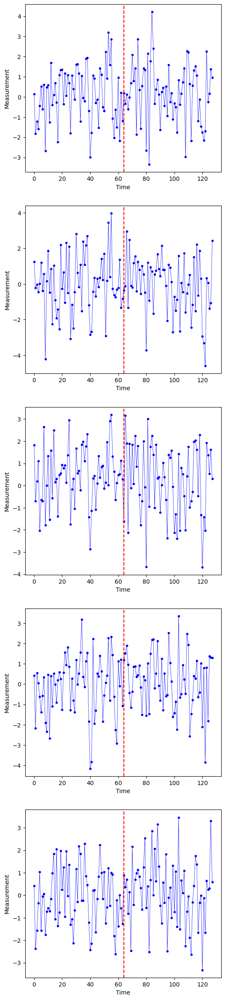

In [4]:
fig, axes = plt.subplots(traces_to_plot, 1, figsize=(ax_width, traces_to_plot*ax_height))

for idx, ax in enumerate(axes):
    trace, _ = dataset[idx]
    plot_trace(trace, ax)

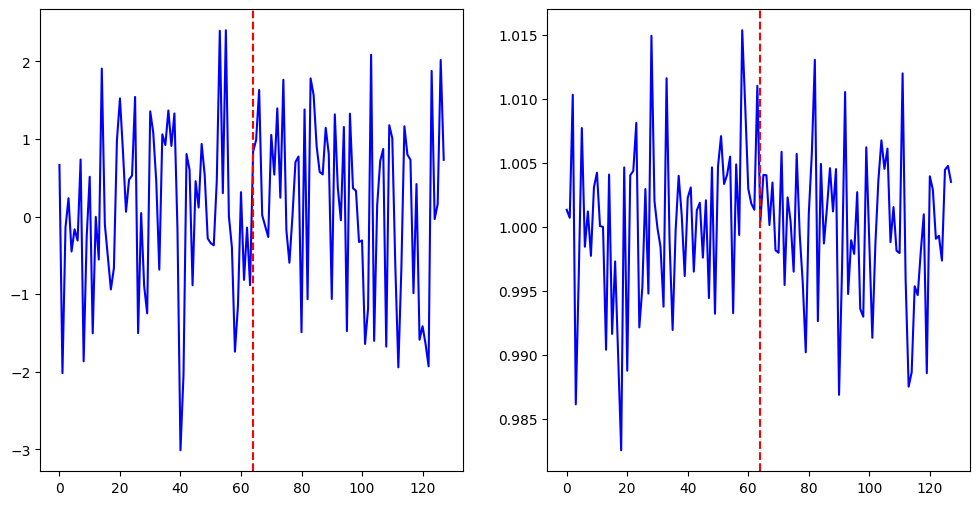

In [5]:
traces = []
for idx, (trace, _) in enumerate(dataset):
    traces.append(trace)
    if idx+1 >= traces_to_average:
        break
traces = np.stack(traces)
trace_mean = np.mean(traces, axis=0)
trace_stdev = np.std(traces, axis=0)
fig, axes = plt.subplots(1, 2, figsize=(2*ax_width, ax_height))
axes[0].plot(trace_mean.squeeze(), color='blue')
axes[1].plot(trace_stdev.squeeze(), color='blue')
if dataset.leakage_points is not None:
    for x in dataset.leakage_points:
        axes[0].axvline(x, linestyle='--', color='red')
        axes[1].axvline(x, linestyle='--', color='red')
if dataset.xor_samples is not None:
    for x in dataset.xor_samples:
        axes[0].axvline(x, linestyle='--', color='green')
        axes[1].axvline(x, linestyle='--', color='green')

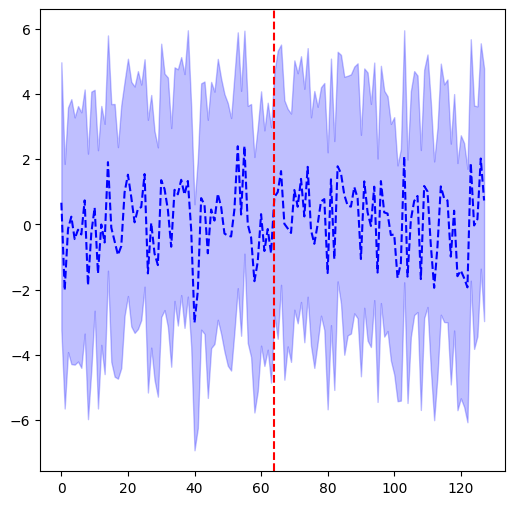

In [6]:
mean_trace = np.zeros((1, dataset.num_samples), dtype=float)
min_trace = np.inf*np.ones_like(mean_trace)
max_trace = -np.inf*np.ones_like(mean_trace)
for idx, (trace, _) in enumerate(dataset):
    mean_trace = (idx/(idx+1))*mean_trace + (1/(idx+1))*trace
    min_trace = np.minimum(trace, min_trace)
    max_trace = np.maximum(trace, max_trace)
    if idx+1 >= traces_to_average:
        break
fig, ax = plt.subplots(figsize=(ax_width, ax_height))
ax.plot(mean_trace.squeeze(), linestyle='--', color='blue')
ax.fill_between(np.arange(dataset.num_samples), min_trace.squeeze(), max_trace.squeeze(), color='blue', alpha=0.25)
if dataset.leakage_points is not None:
    for x in dataset.leakage_points:
        ax.axvline(x, linestyle='--', color='red')
if dataset.xor_samples is not None:
    for x in dataset.xor_samples:
        ax.axvline(x, linestyle='--', color='green')

In [7]:
def run_sod_trial(dataset):
    sod = get_sum_of_differences(trace_means, dataset)

    fig, ax = plt.subplots(figsize=(ax_width, ax_height))
    ax.plot(sod.squeeze(), **trace_kwargs)
    if dataset.leakage_points is not None:
        for x in dataset.leakage_points:
            ax.axvline(x, linestyle='--', color='red')
            if dataset.delay_size > 0:
                ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset.delay_size//2, color='red', alpha=0.5)
    if dataset.xor_samples is not None:
        for x in dataset.xor_samples:
            ax.axvline(x, linestyle='--', color='green')
            if dataset.delay_size > 0:
                ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset/delay_size//2, color='green', alpha=0.5)
    plt.show()

In [8]:
def run_snr_trial(dataset):
    snr = get_snr(trace_means, dataset)

    fig, ax = plt.subplots(figsize=(ax_width, ax_height))
    ax.plot(snr.squeeze(), **trace_kwargs)
    if dataset.leakage_points is not None:
        for x in dataset.leakage_points:
            ax.axvline(x, linestyle='--', color='red')
            if dataset.delay_size > 0:
                ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset.delay_size//2, color='red', alpha=0.5)
    if dataset.xor_samples is not None:
        for x in dataset.xor_samples:
            ax.axvline(x, linestyle='--', color='green')
            if dataset.delay_size > 0:
                ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset/delay_size//2, color='green', alpha=0.5)
    
    plt.show()

In [9]:
def run_cnn_trial(train_dataset, holdout_dataset):
    model = CnnClassifier().cuda() # SnnClassifier
    loss_values, acc_values, holdout_loss_values, holdout_acc_values, temps = train_model(model, train_dataset, holdout_dataset, num_steps=training_steps)
    fig, axes = plt.subplots(1, 3, figsize=(2*ax_width, ax_height))
    axes[0].plot(loss_values, color='blue')
    axes[0].plot(holdout_loss_values, color='red')
    axes[1].plot(acc_values, color='blue')
    axes[1].plot(holdout_acc_values, color='red')
    axes[2].plot(temps, color='blue')
    axes[1].set_ylim(0, 1)
    for ax in axes.flatten():
        ax.grid(True)
    plt.show()
    
    dataloader = torch.utils.data.DataLoader(holdout_dataset, shuffle=hasattr(dataset, '__len__'), batch_size=batch_size, num_workers=1)
    saliency = compute_saliency(model, dataloader)
    fig, ax = plt.subplots(figsize=(ax_width, ax_height))
    ax.plot(saliency.squeeze(), **trace_kwargs)
    if dataset.leakage_points is not None:
        for x in dataset.leakage_points:
            ax.axvline(x, linestyle='--', color='red')
            if dataset.delay_size > 0:
                ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset.delay_size//2, color='red', alpha=0.5)
    if dataset.xor_samples is not None:
        for x in dataset.xor_samples:
            ax.axvline(x, linestyle='--', color='green')
            if dataset.delay_size > 0:
                ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset/delay_size//2, color='green', alpha=0.5)
    plt.show()

In [10]:
def run_gan_trial(train_dataset, holdout_dataset):
    model, mask = CnnClassifier().cuda(), Mask().cuda() ## SnnClassifier
    model_loss_values, mask_loss_values, acc_values, sparsity_values, mean_ratios, max_ratios, holdout_model_loss_values, holdout_mask_loss_values, holdout_acc_values, best_mask, best_mask_idx, temps = train_model_and_mask(model, mask, train_dataset, holdout_dataset, num_steps=training_steps)
    fig, axes = plt.subplots(3, 3, figsize=(4*ax_width, ax_height))
    axes = axes.flatten()
    axes[0].plot(model_loss_values, color='blue')
    axes[0].plot(holdout_model_loss_values, color='red')
    axes[1].plot(mask_loss_values, color='blue')
    axes[1].plot(holdout_mask_loss_values, color='red')
    axes[2].plot(acc_values, color='blue')
    axes[2].plot(holdout_acc_values, color='red')
    axes[3].plot(sparsity_values, color='blue')
    axes[4].plot(mean_ratios, color='blue')
    axes[5].plot(max_ratios, color='blue')
    axes[6].plot(temps, color='blue')
    axes[2].set_ylim(0, 1)
    for ax in axes[:7]:
        ax.axvline(best_mask_idx, color='blue', linestyle='--')
        ax.grid(True)
    plt.show()
    
    fig, axes = plt.subplots(1, 2, figsize=(2*ax_width, ax_height))
    axes[0].plot(nn.functional.sigmoid(mask.mask.data.detach().squeeze()).cpu().numpy(), **trace_kwargs)
    axes[1].plot(best_mask, **trace_kwargs)
    if dataset.leakage_points is not None:
        for x in dataset.leakage_points:
            for ax in axes.flatten():
                ax.axvline(x, linestyle='--', color='red')
                if dataset.delay_size > 0:
                    ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset.delay_size//2, color='red', alpha=0.5)
    if dataset.xor_samples is not None:
        for x in dataset.xor_samples:
            for ax in axes.flatten():
                ax.axvline(x, linestyle='--', color='green')
                if dataset.delay_size > 0:
                    ax.axvspan(x-dataset.delay_size//2-dataset.delay_size%2, x+dataset/delay_size//2, color='green', alpha=0.5)
    plt.show()
    return mean_ratios[best_mask_idx], max_ratios[best_mask_idx]

Dataset size: 512


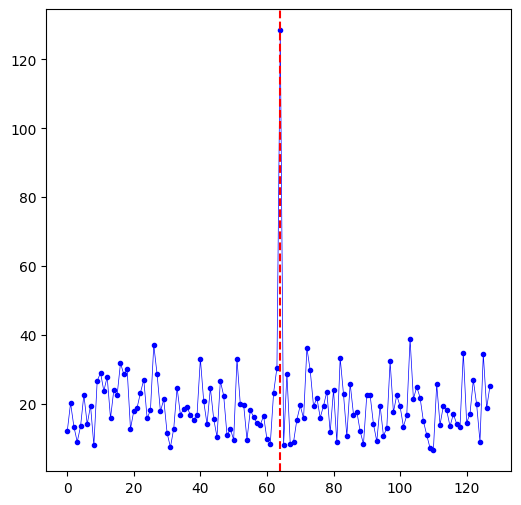

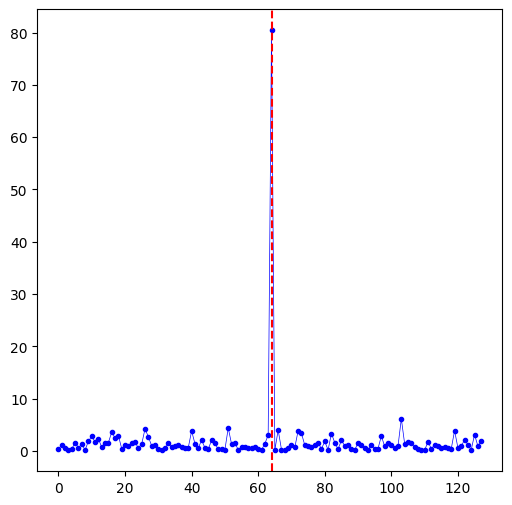

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:58<00:00,  8.55it/s]


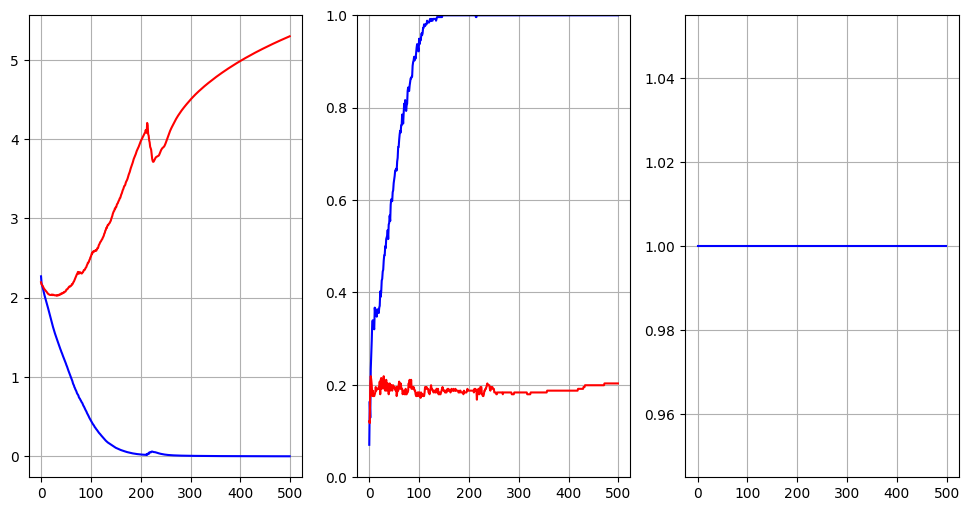

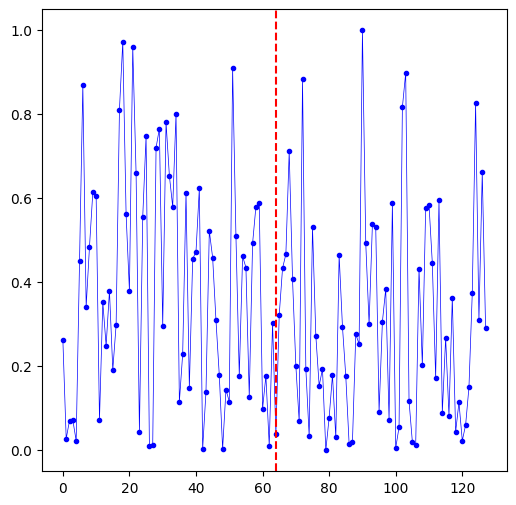

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:01<00:00,  8.11it/s]


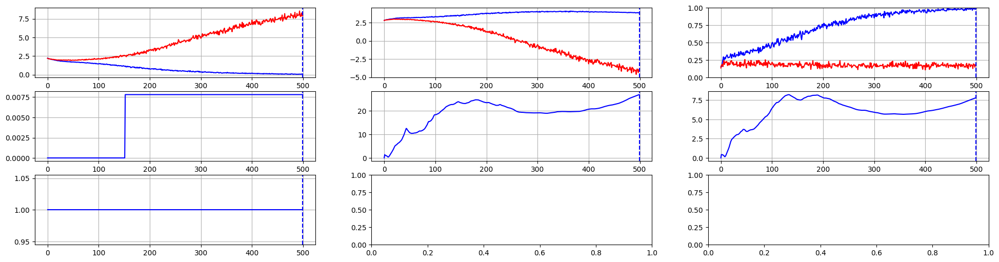

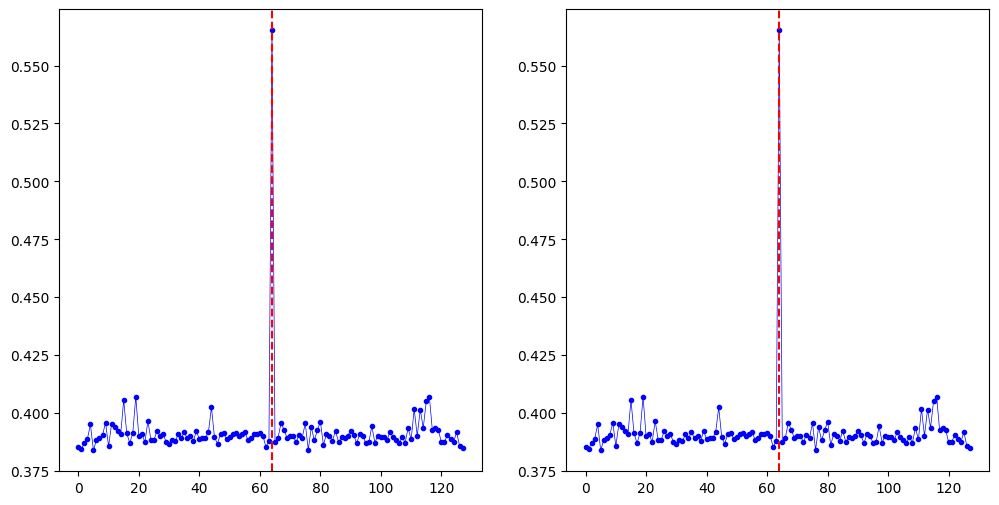



Dataset size: 1024


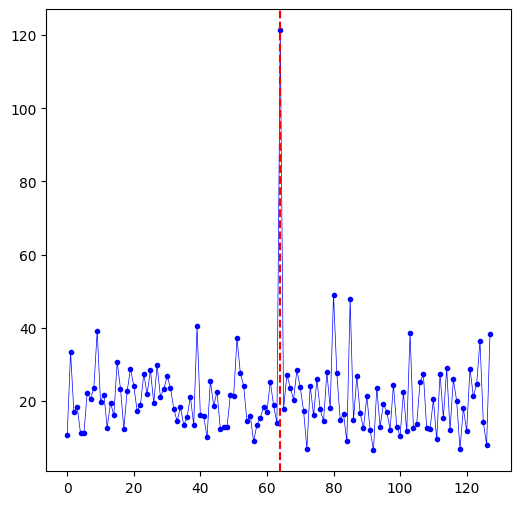

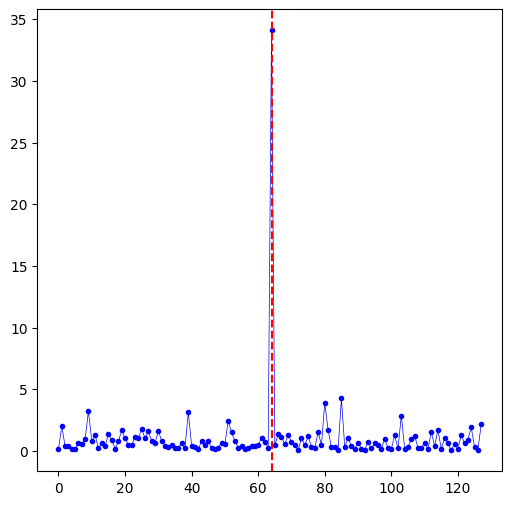

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:01<00:00,  8.15it/s]


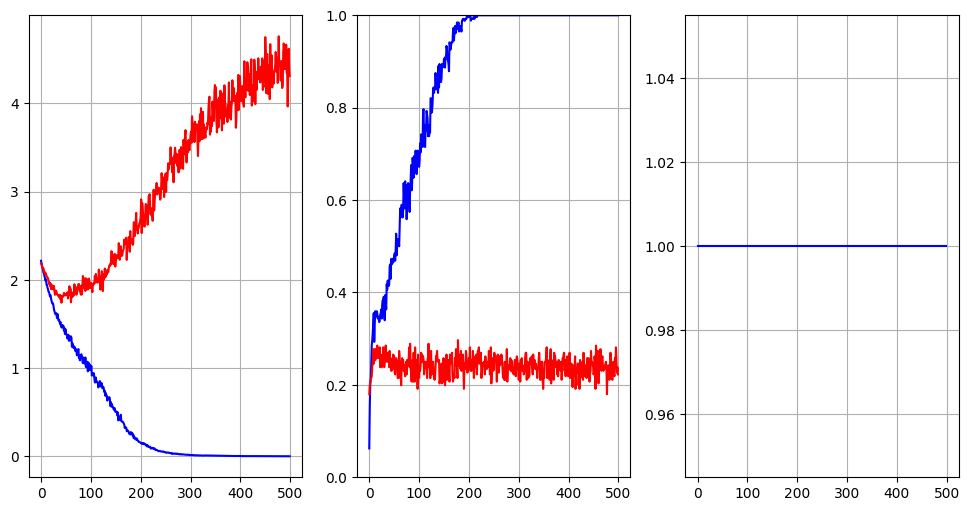

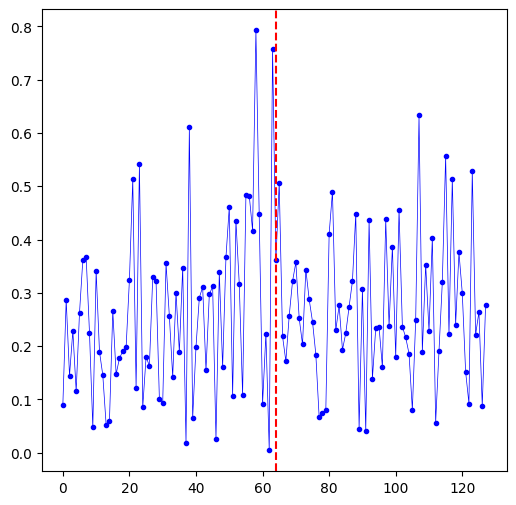

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:04<00:00,  7.72it/s]


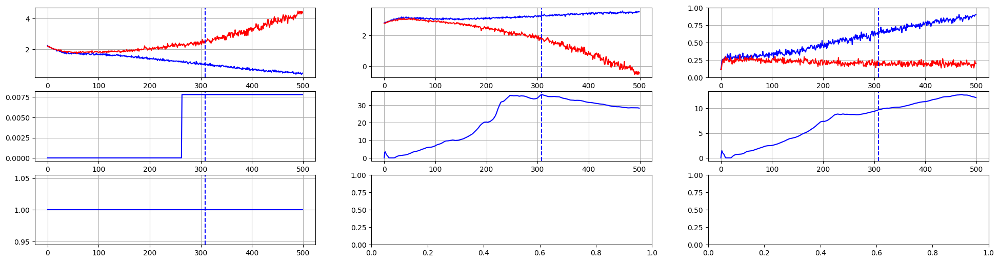

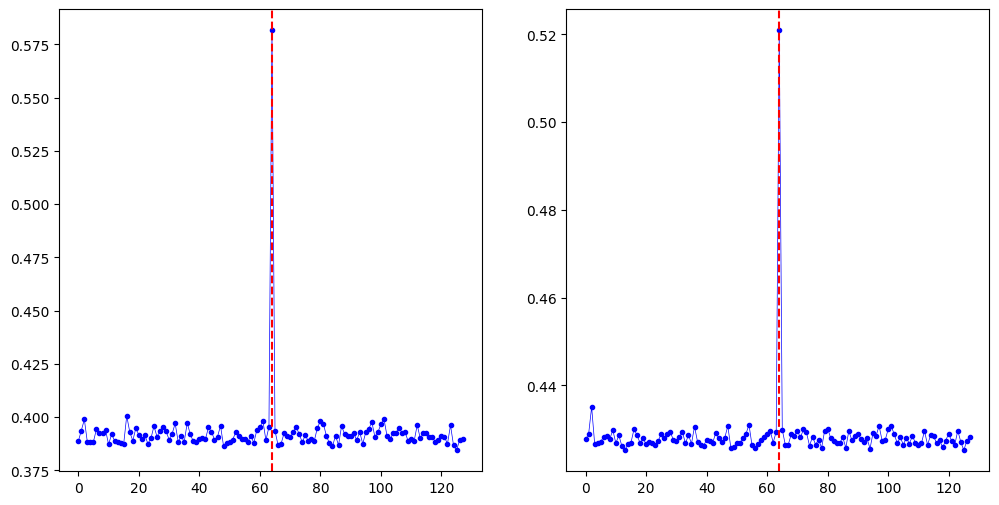



Dataset size: 2048


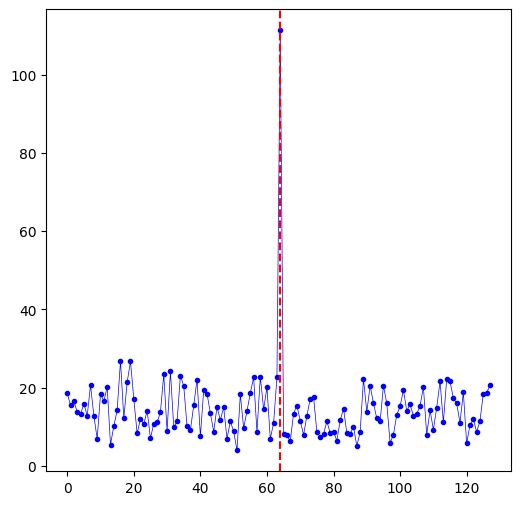

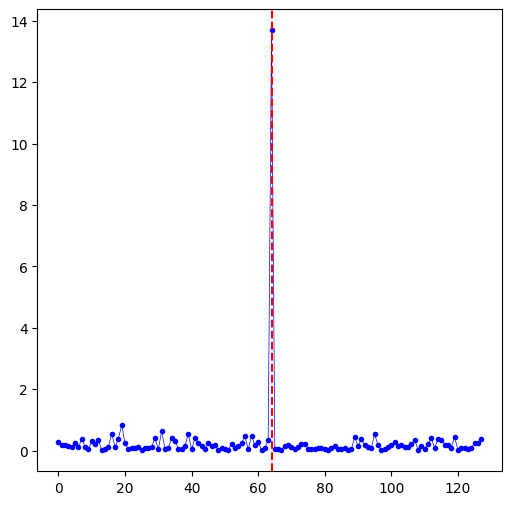

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:01<00:00,  8.11it/s]


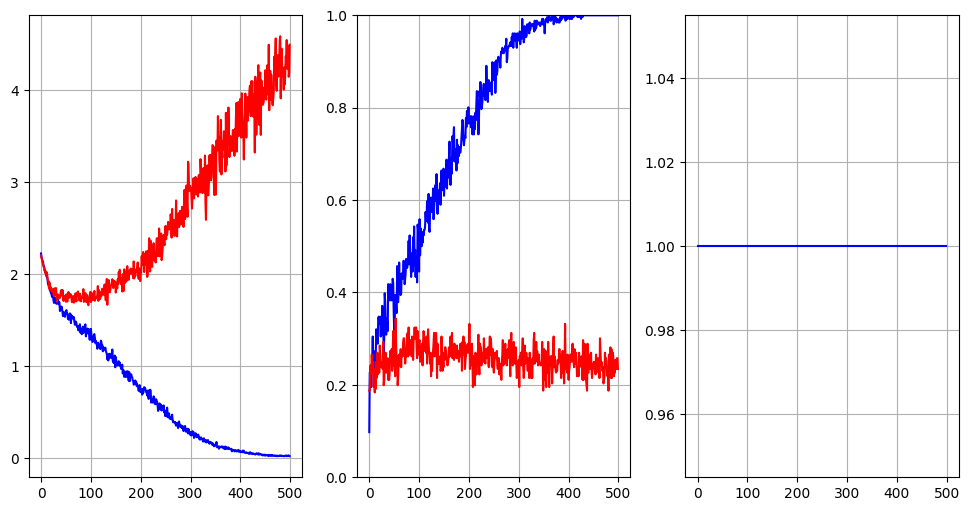

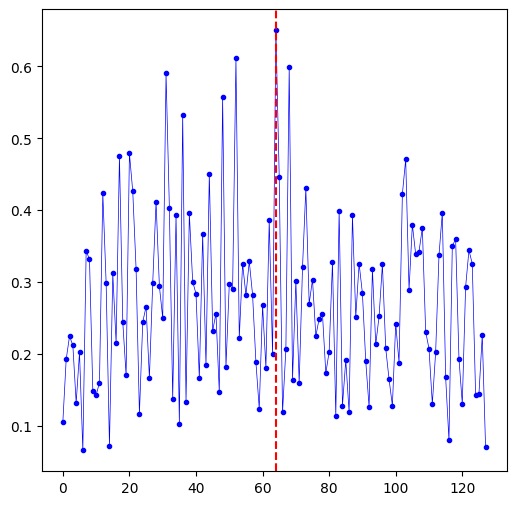

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:05<00:00,  7.63it/s]


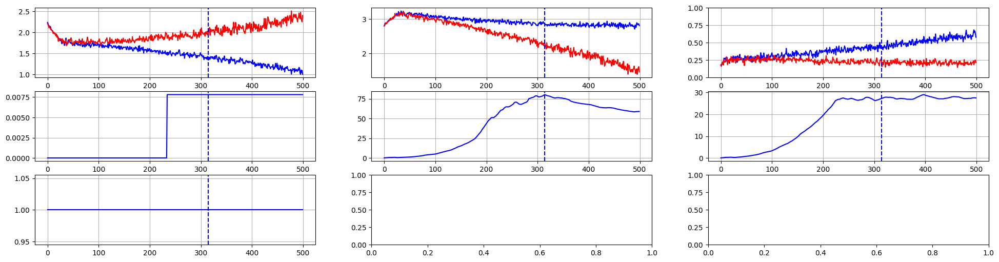

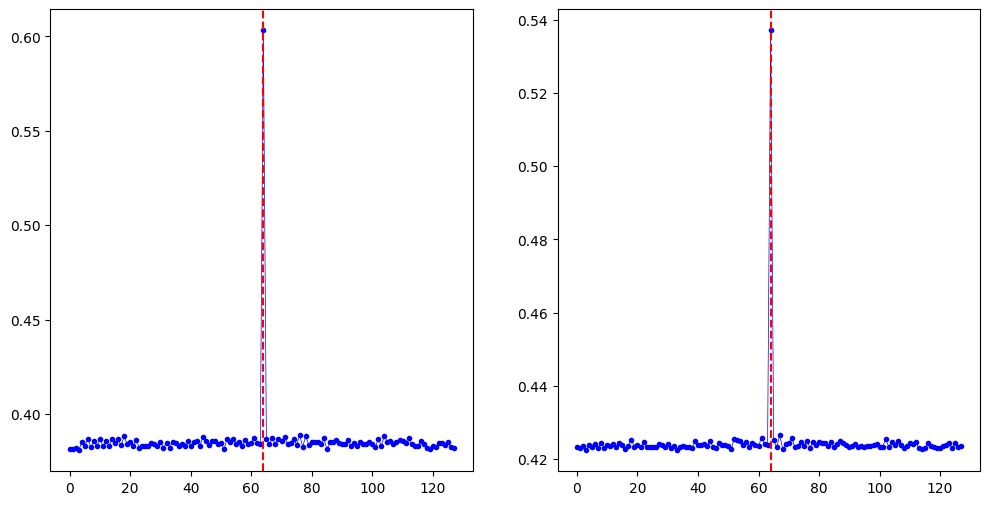



Dataset size: 4096


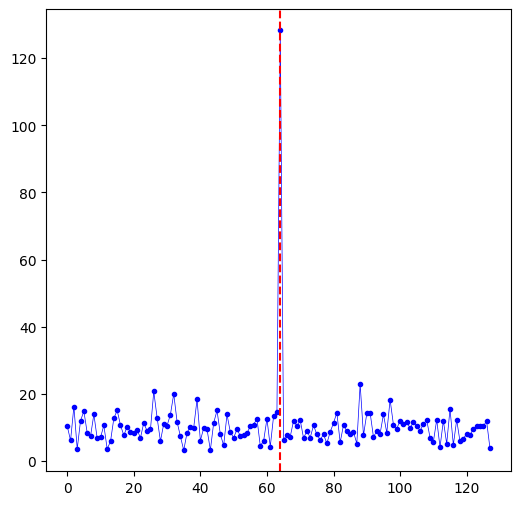

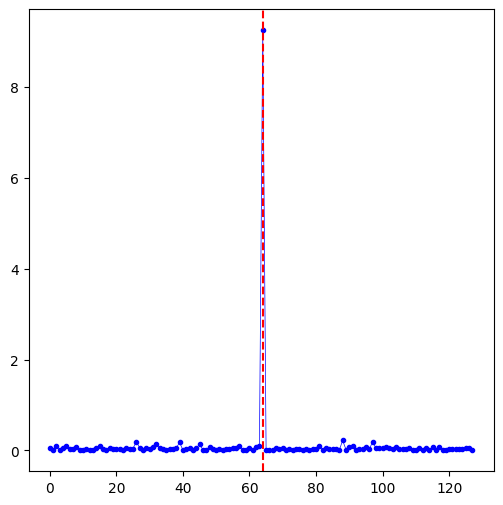

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:03<00:00,  7.83it/s]


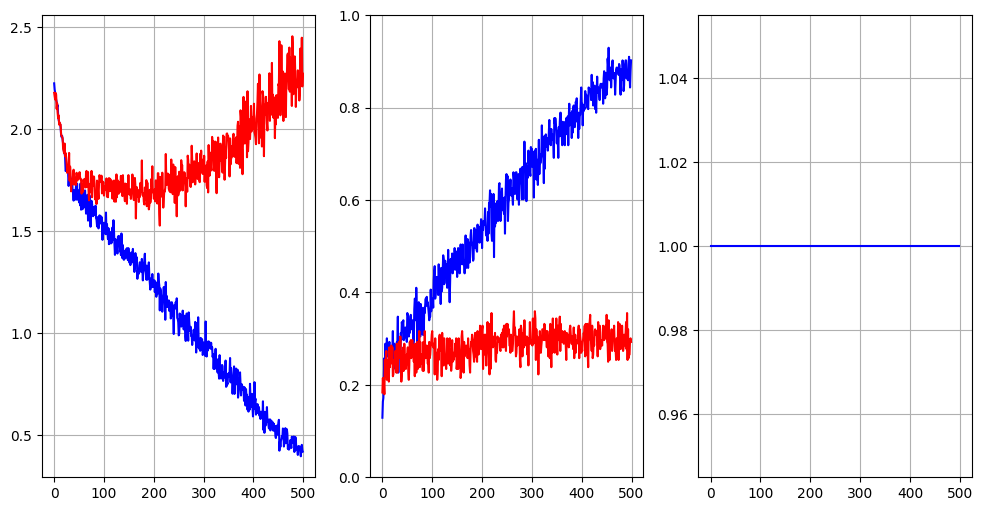

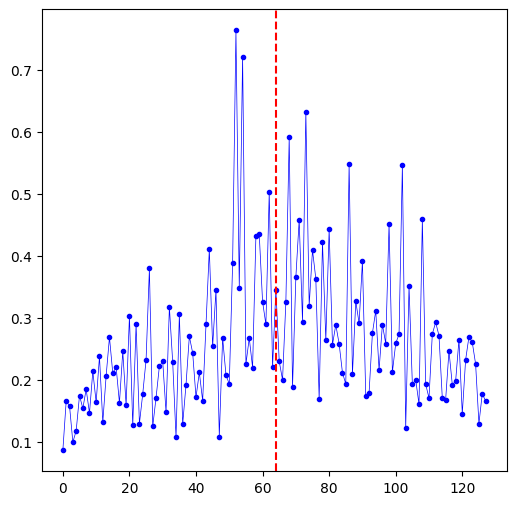

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:06<00:00,  7.48it/s]


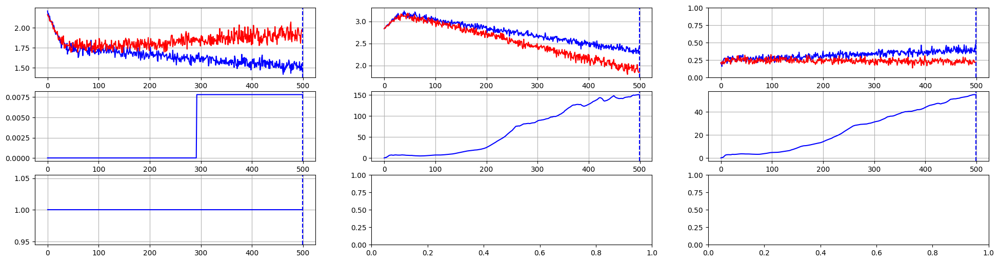

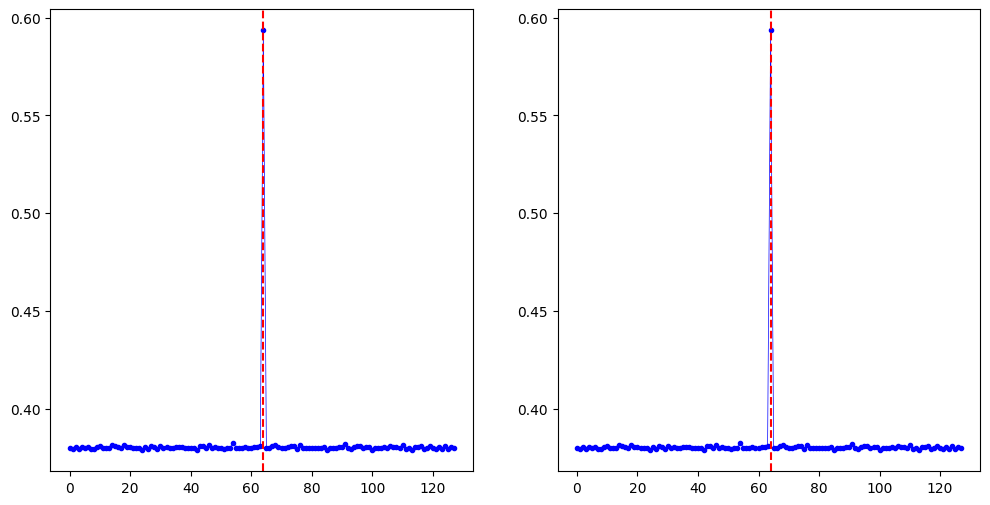



Dataset size: 8192


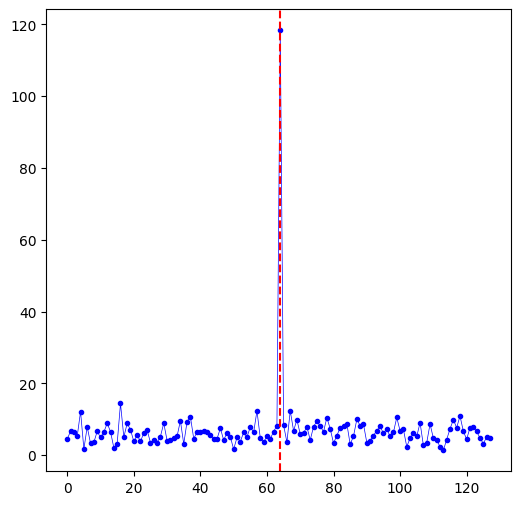

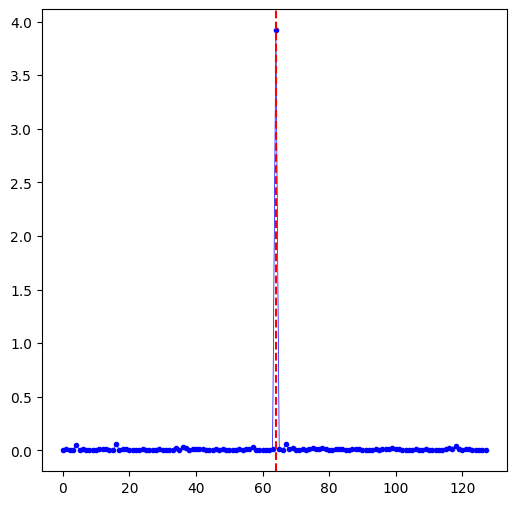

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:06<00:00,  7.52it/s]


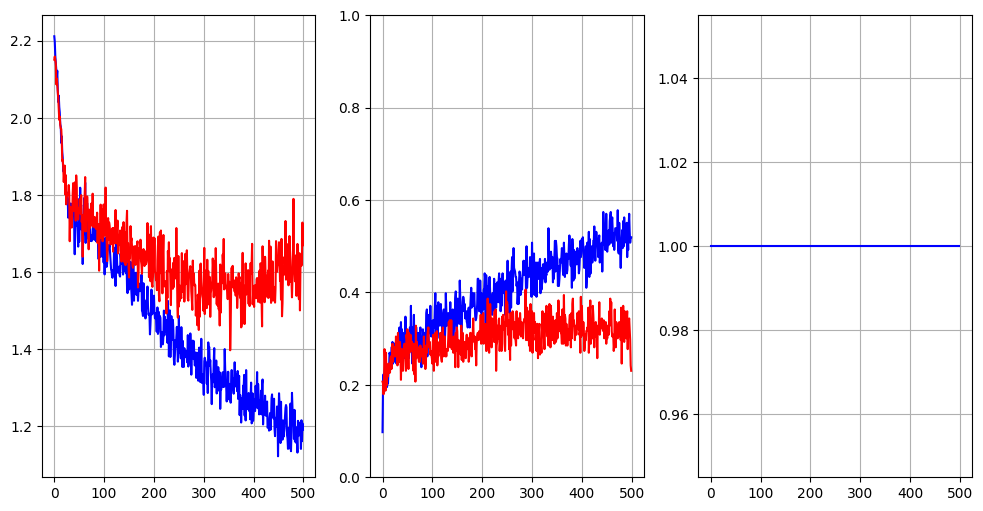

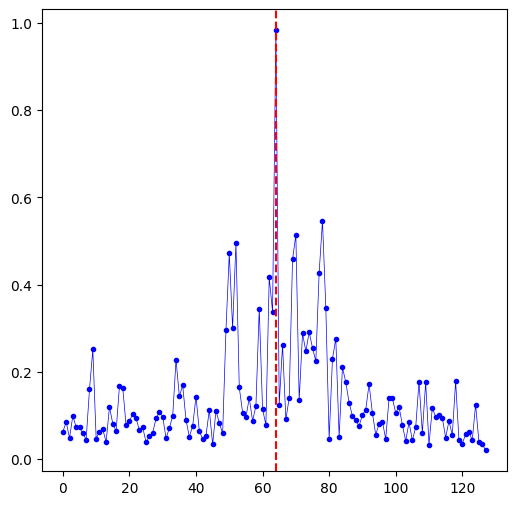

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:10<00:00,  7.11it/s]


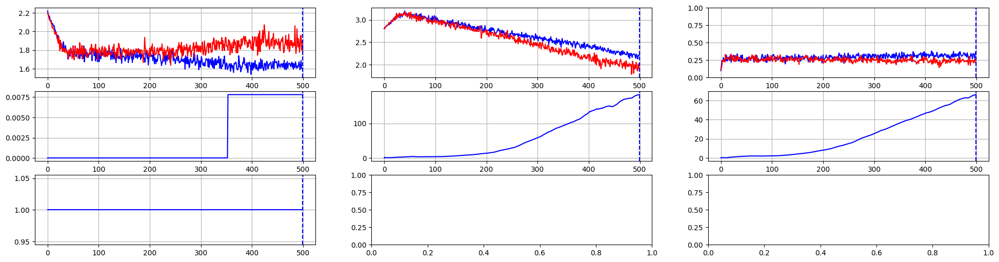

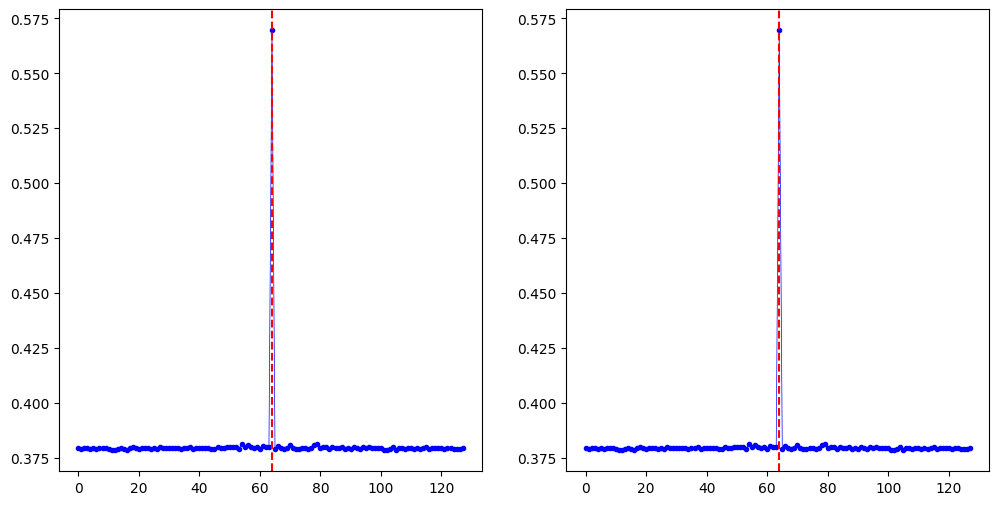



Dataset size: 16384


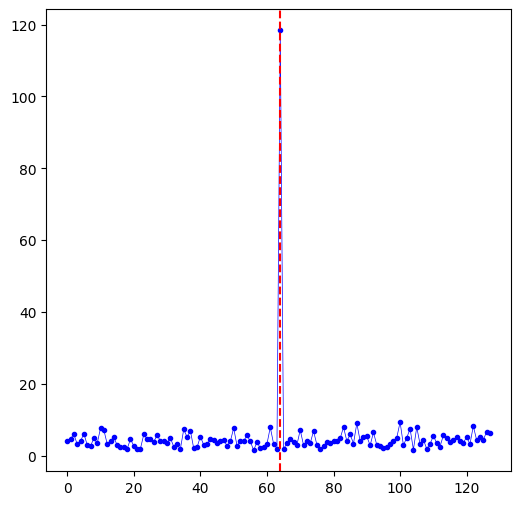

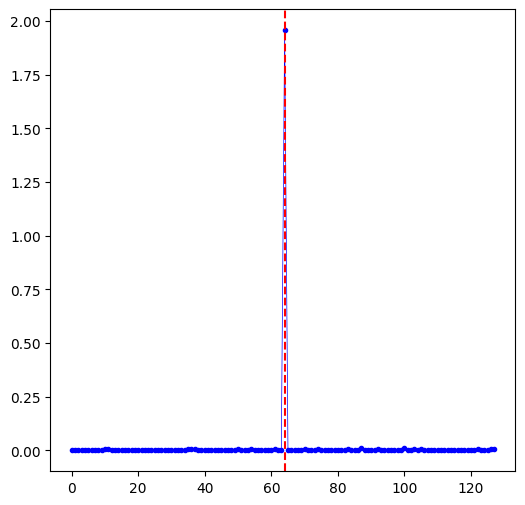

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:05<00:00,  7.62it/s]


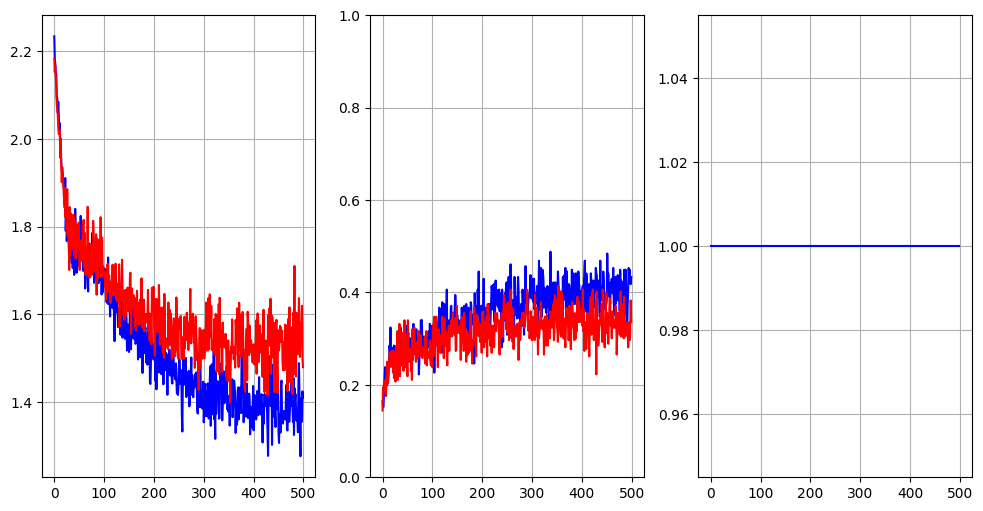

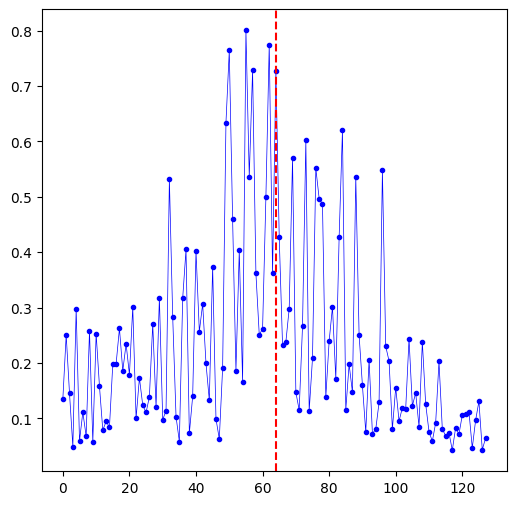

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:10<00:00,  7.07it/s]


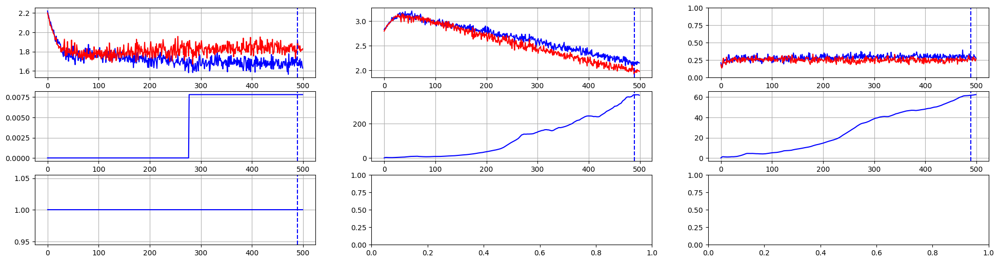

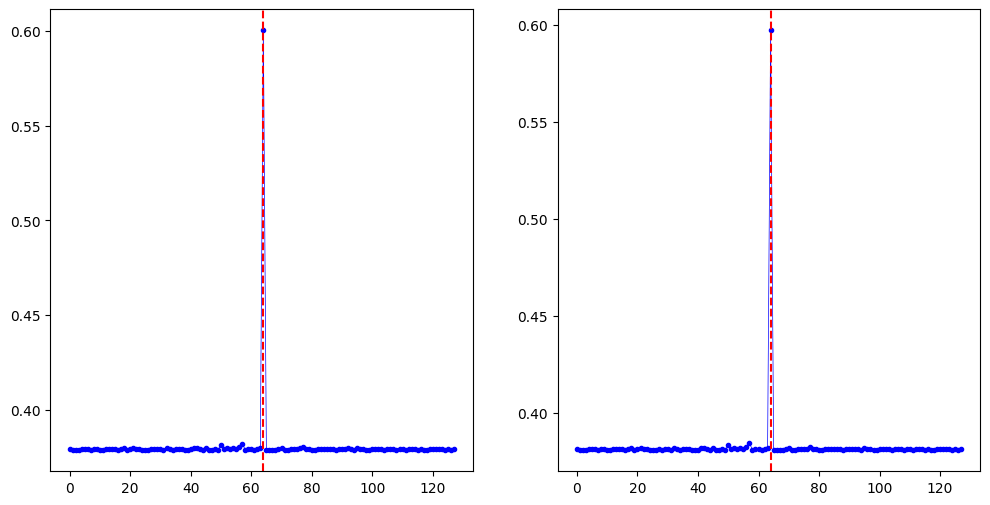



Dataset size: 32768


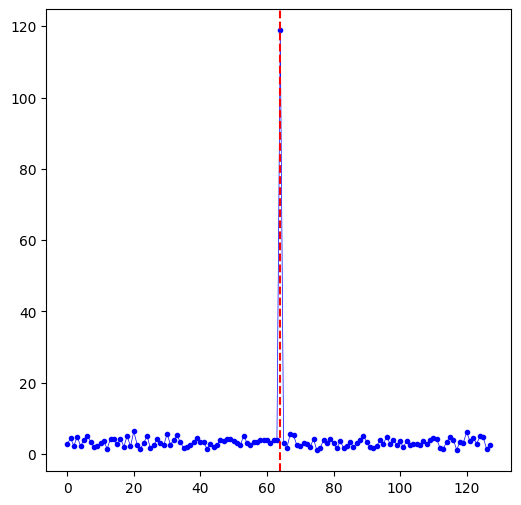

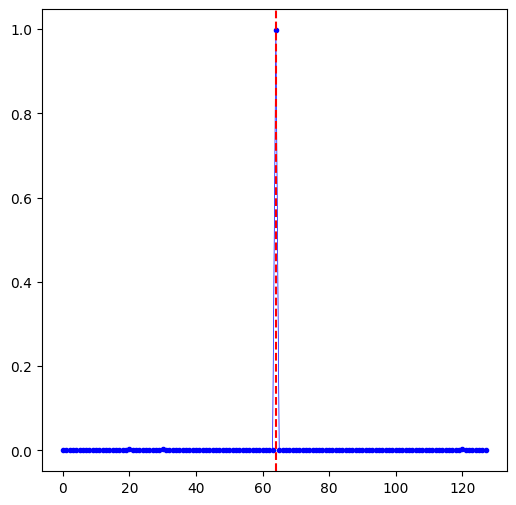

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:08<00:00,  7.26it/s]


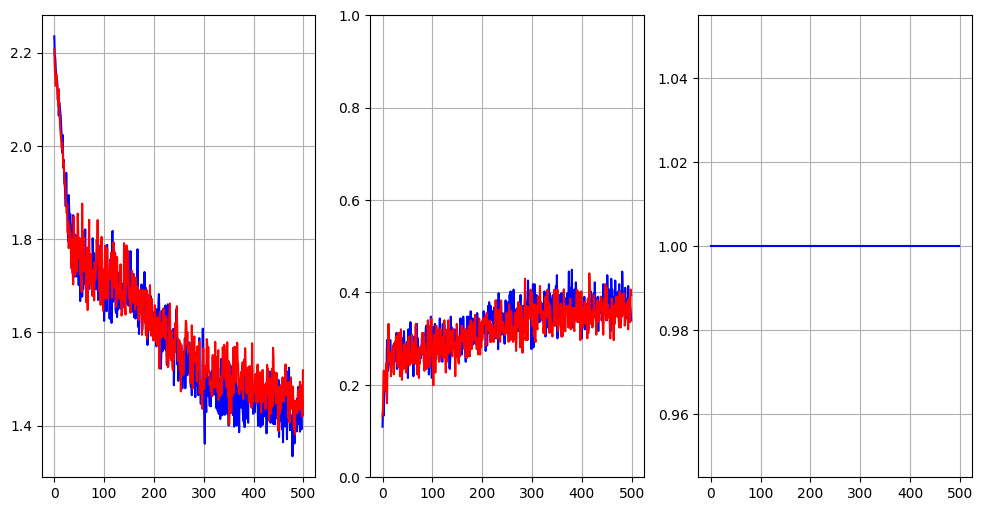

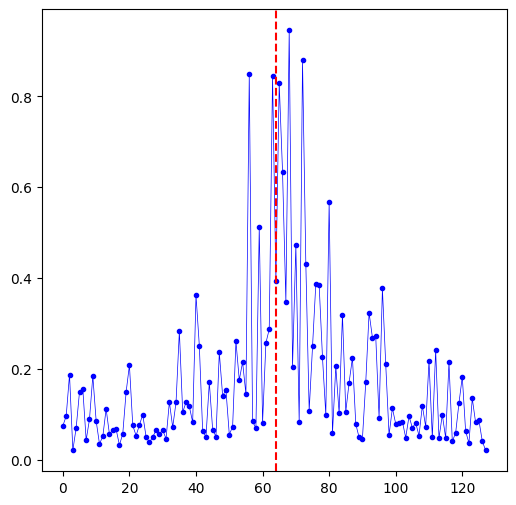

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:12<00:00,  6.90it/s]


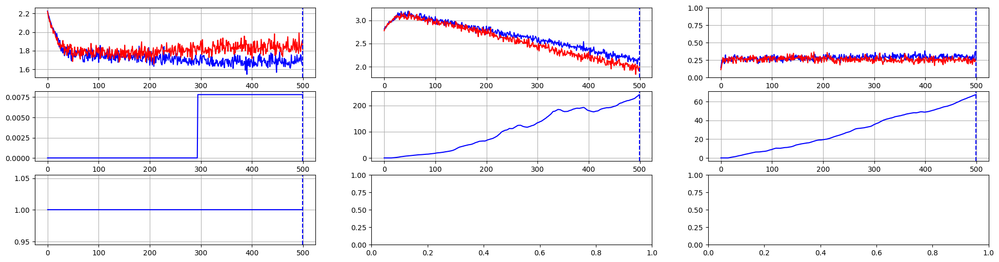

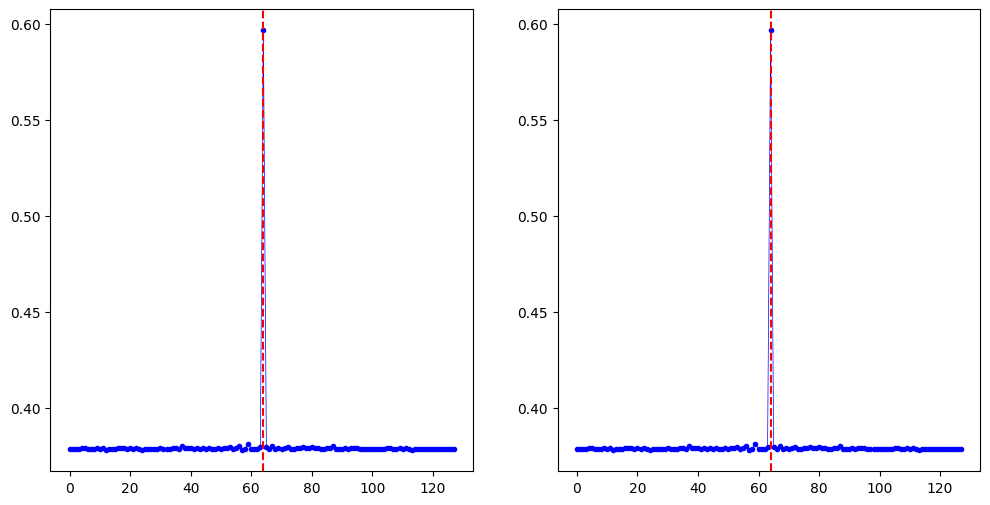



Dataset size: 65536


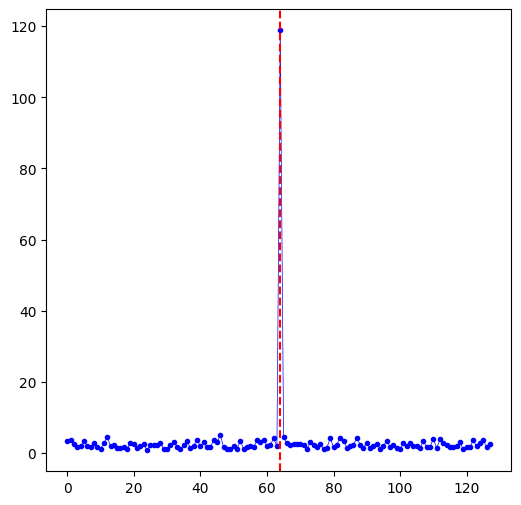

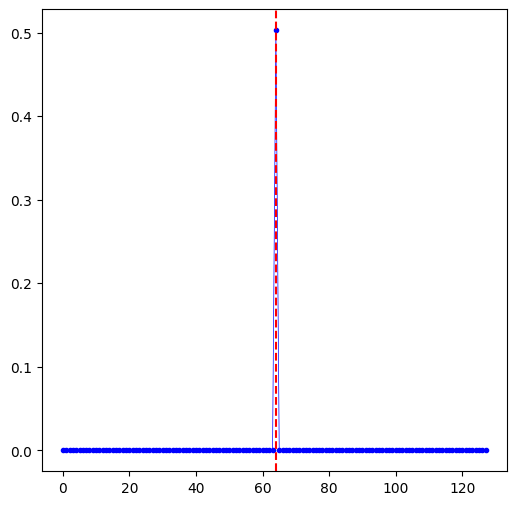

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:15<00:00,  6.64it/s]


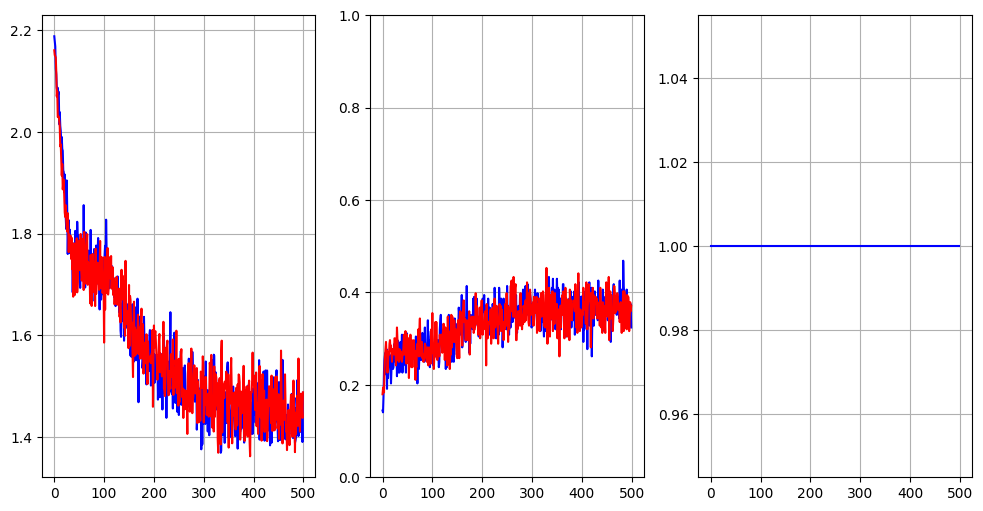

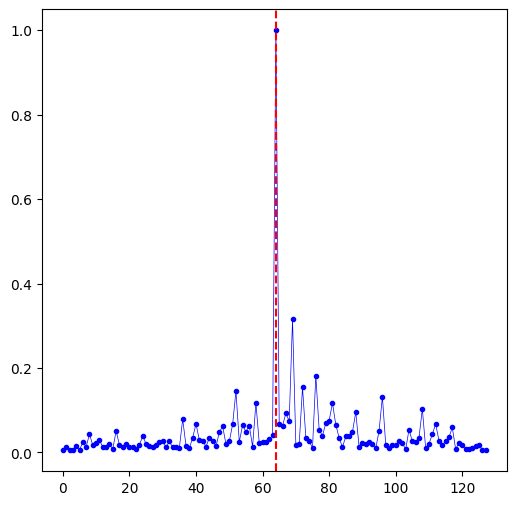

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:19<00:00,  6.32it/s]


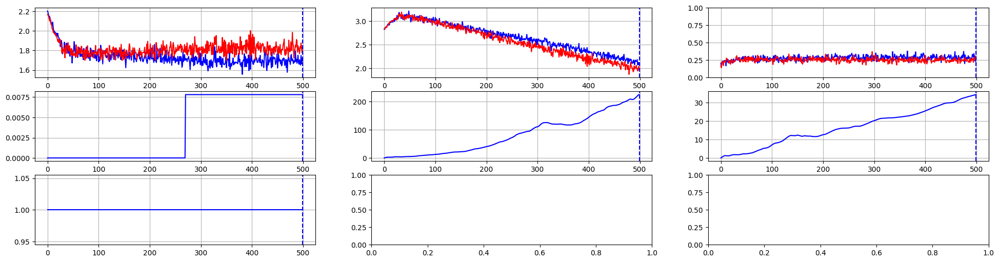

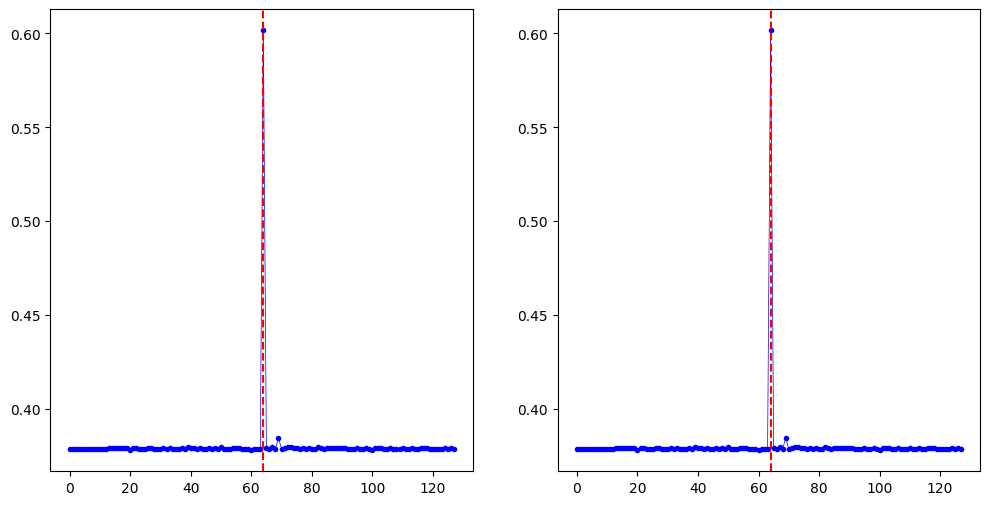



Dataset size: 131072


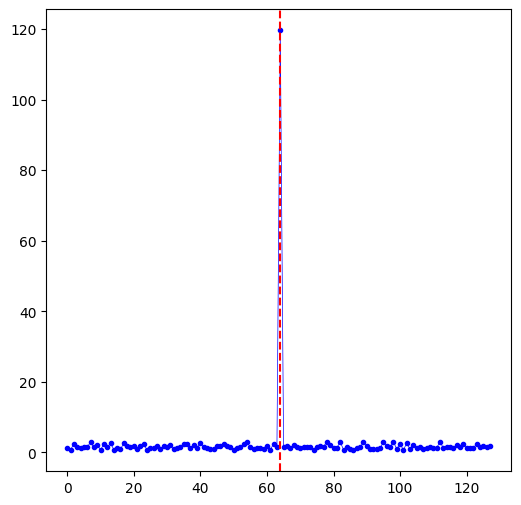

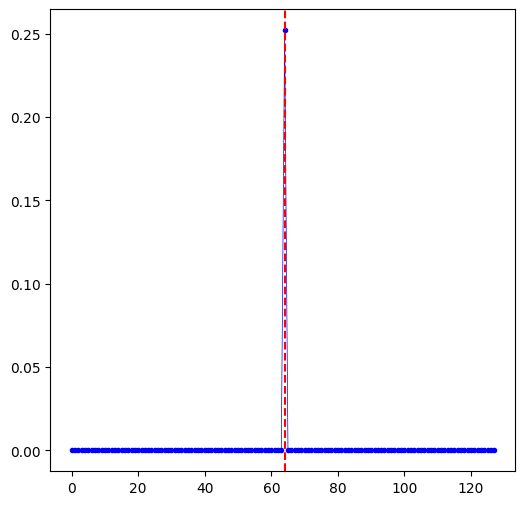

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.76it/s]


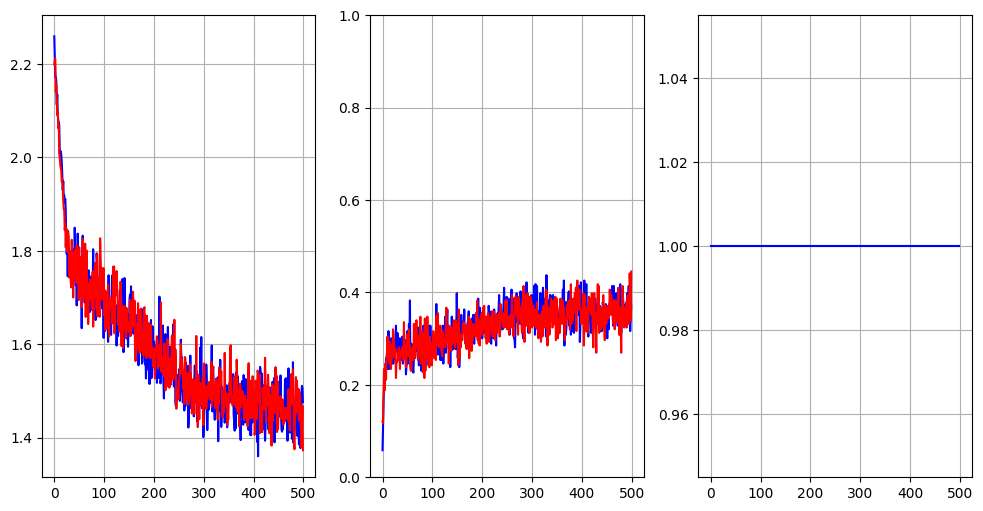

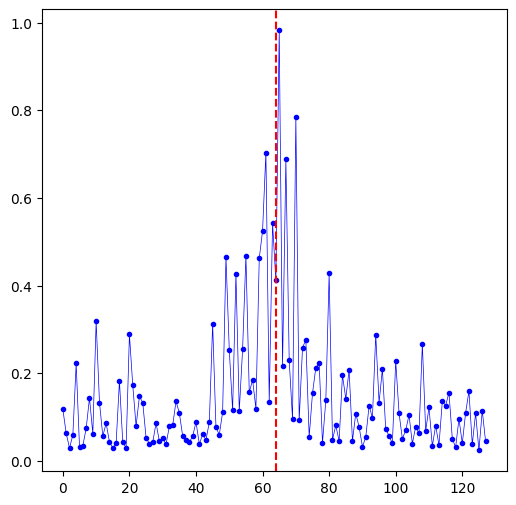

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.49it/s]


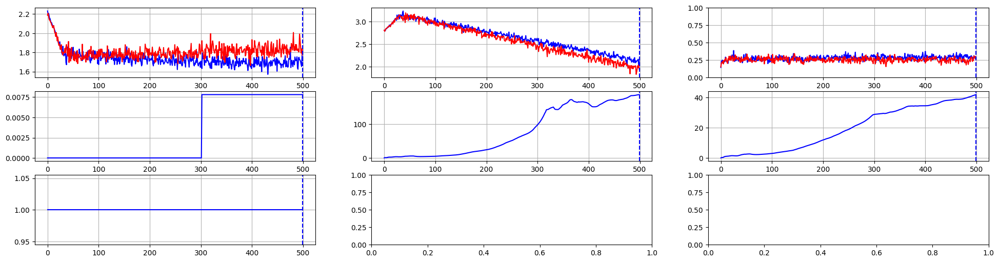

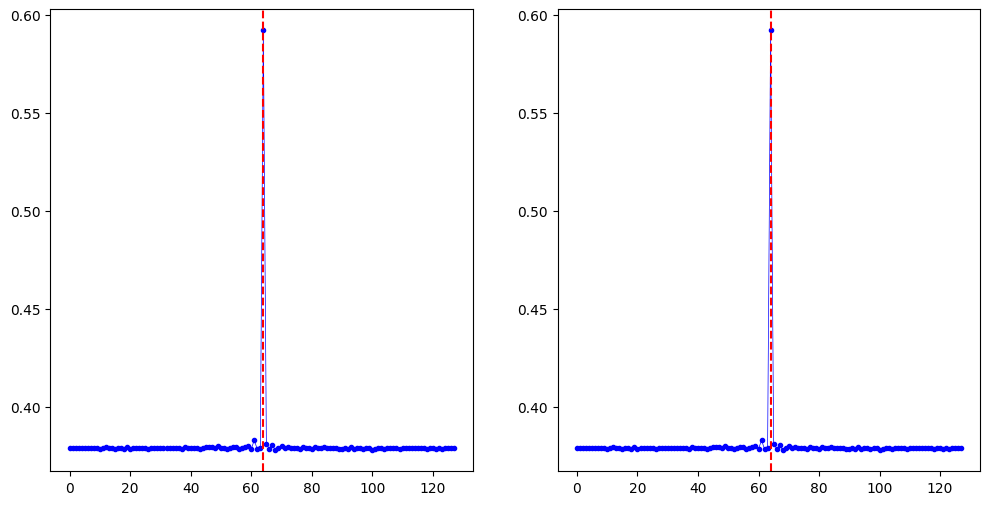



Dataset size: 262144


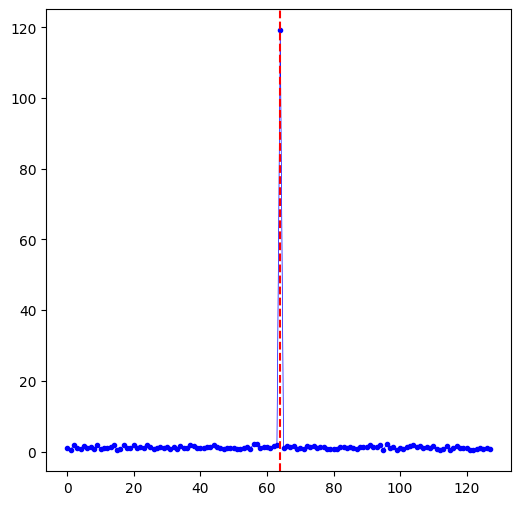

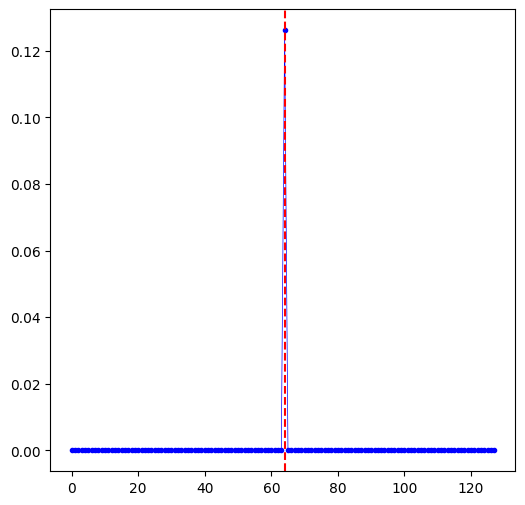

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:37<00:00,  5.15it/s]


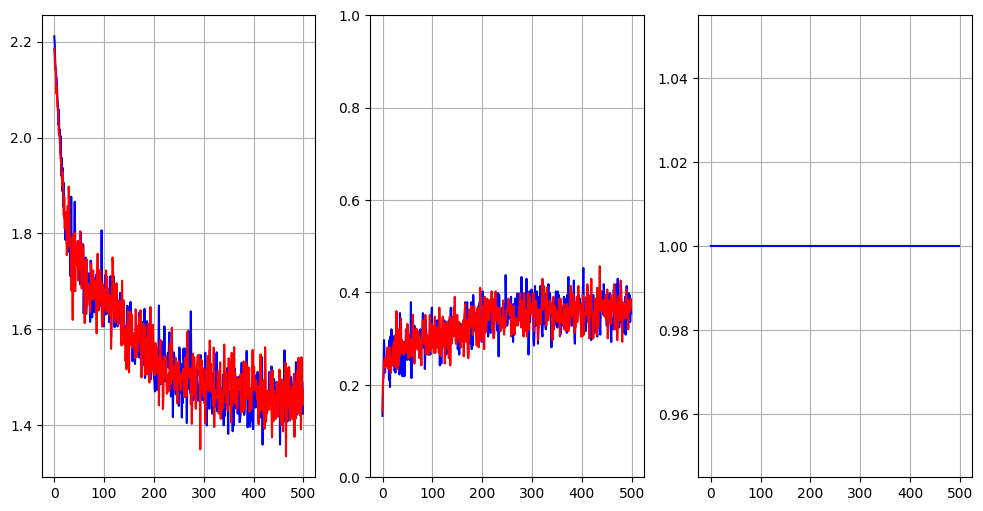

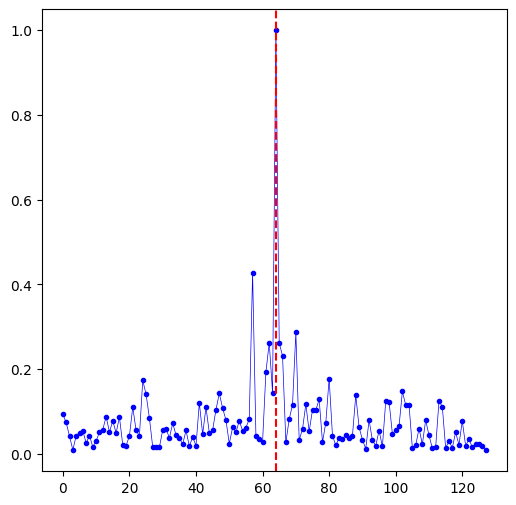

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:41<00:00,  4.95it/s]


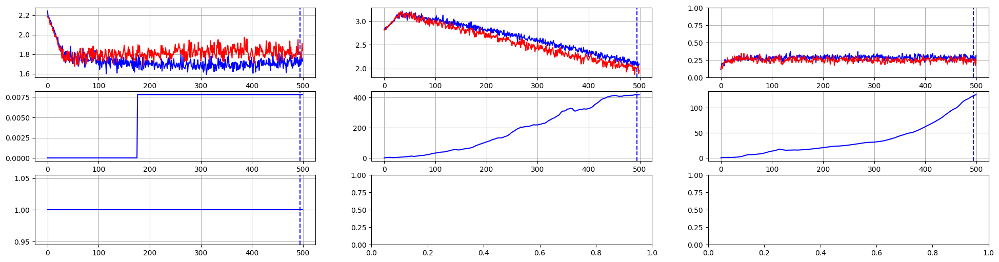

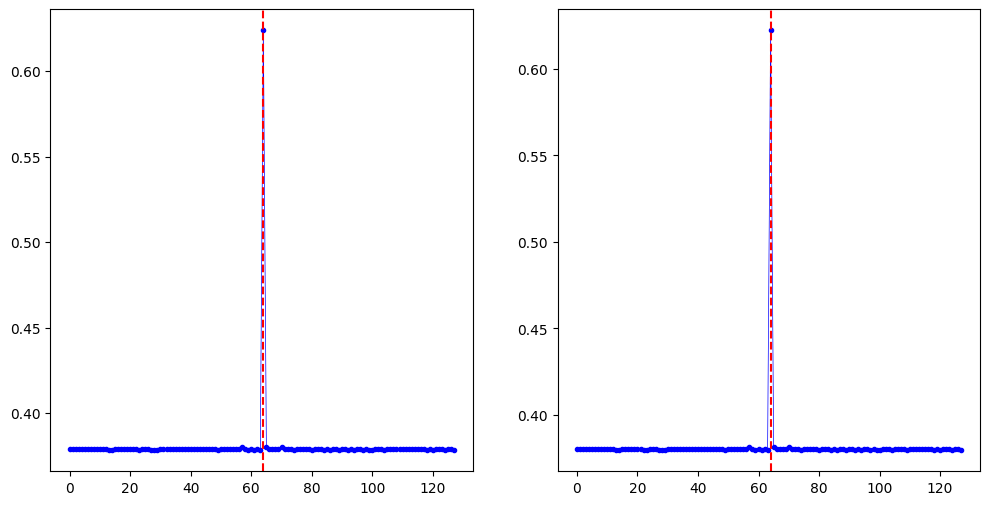



Dataset size: 524288


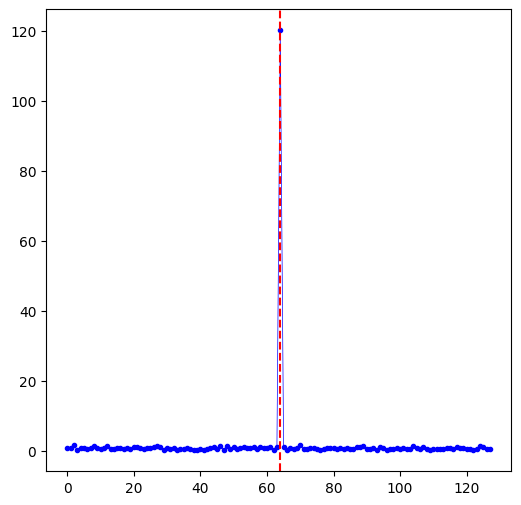

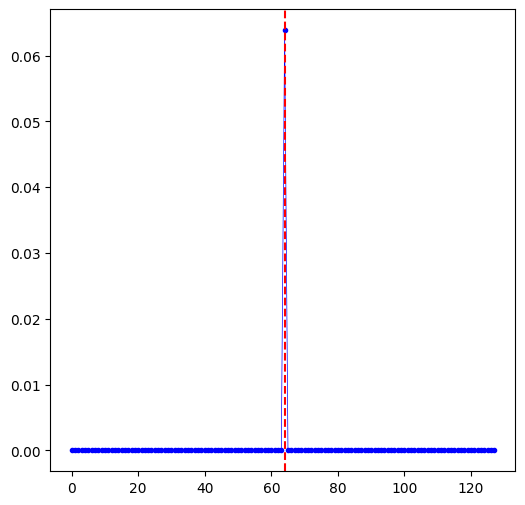

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:59<00:00,  4.20it/s]


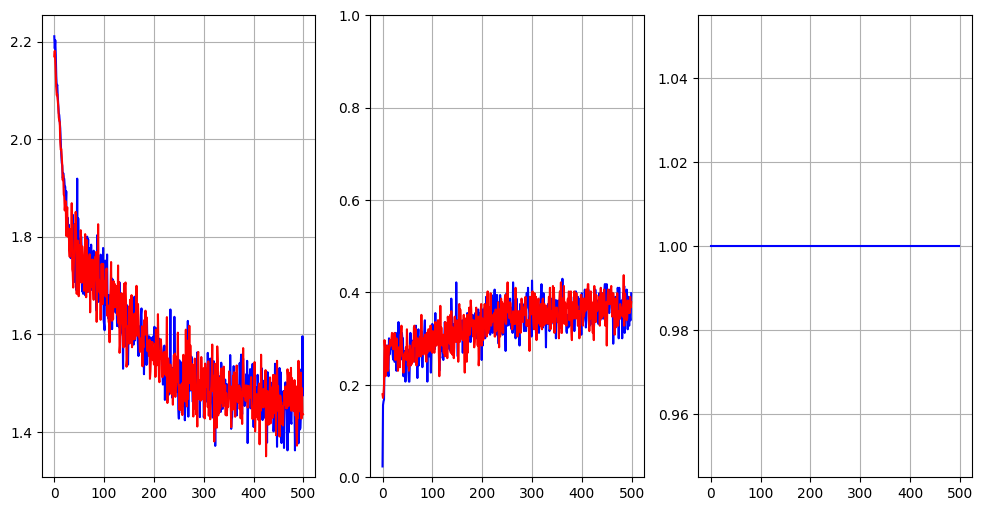

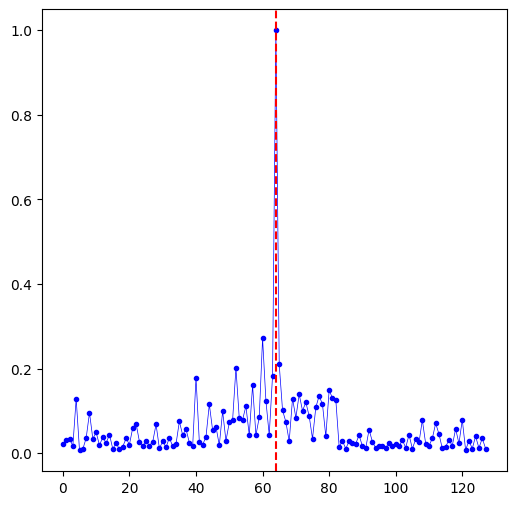

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [02:03<00:00,  4.04it/s]


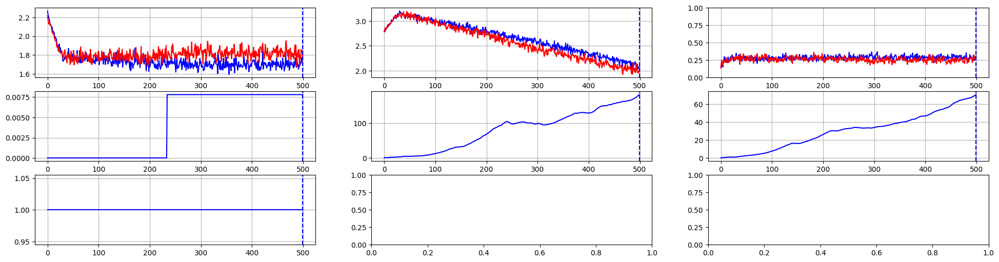

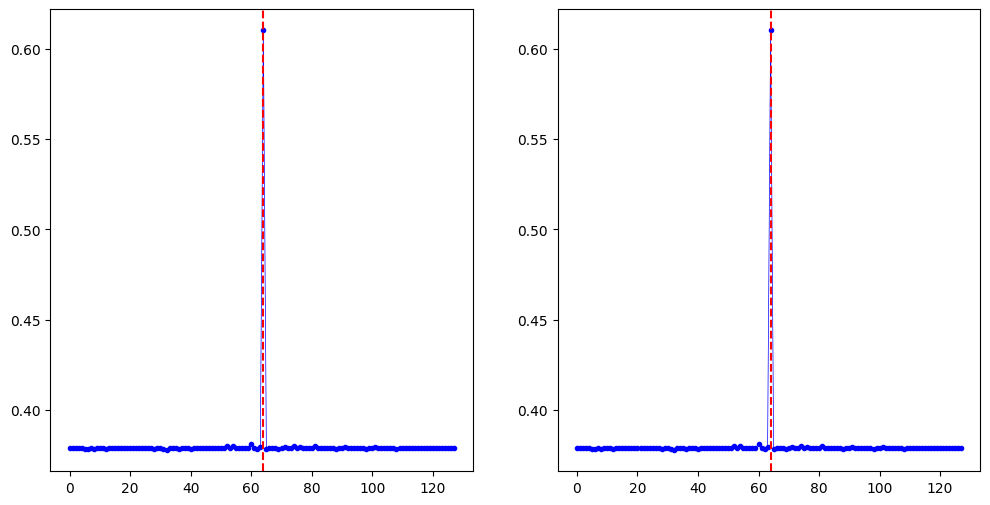

In [11]:
mean_ratios, max_ratios = [], []
dataset_sizes = [int(x) for x in 2*batch_size*2**np.arange(11)]
for dataset_size in dataset_sizes:
    print('Dataset size:', dataset_size)
    dataset = SyntheticAES__Finite(dataset_size=dataset_size, num_samples=128, points=np.array([leakage_point]), varying_noise_stdev=1.0, num_leaking_samples=1, num_xor_samples=0, target=target, delay_size=0)
    train_dataset, holdout_dataset = torch.utils.data.random_split(dataset, (len(dataset)//2, len(dataset)-len(dataset)//2))
    trace_means = get_trace_means(dataset)
    run_sod_trial(dataset)
    run_snr_trial(dataset)
    run_cnn_trial(train_dataset, holdout_dataset)
    mean_ratio, max_ratio = run_gan_trial(train_dataset, holdout_dataset)
    mean_ratios.append(mean_ratio)
    max_ratios.append(max_ratio)
    print()
    print()

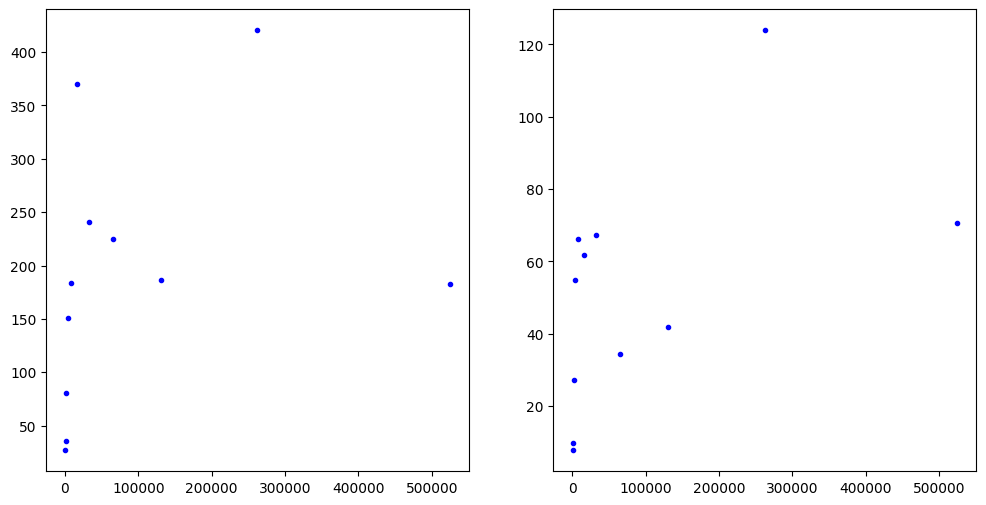

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(2*ax_width, ax_height))
axes[0].plot(dataset_sizes, mean_ratios, '.', color='blue')
axes[1].plot(dataset_sizes, max_ratios, '.', color='blue')

Proportion of variance which is leakage: 0.0


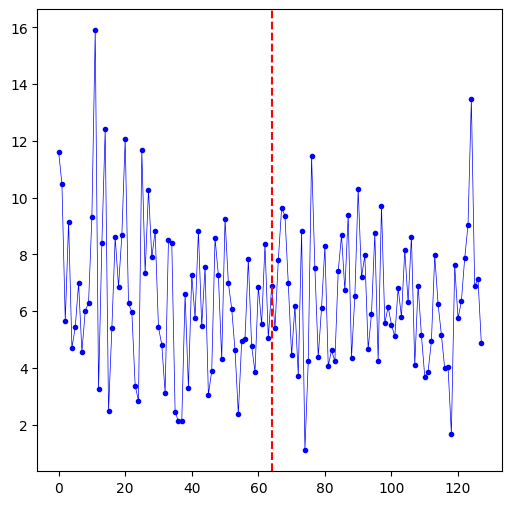

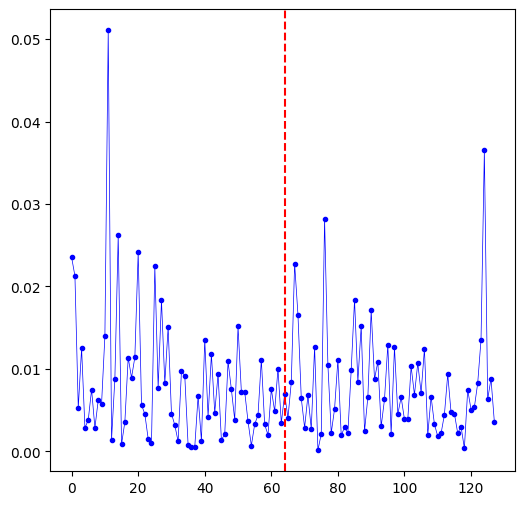

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]


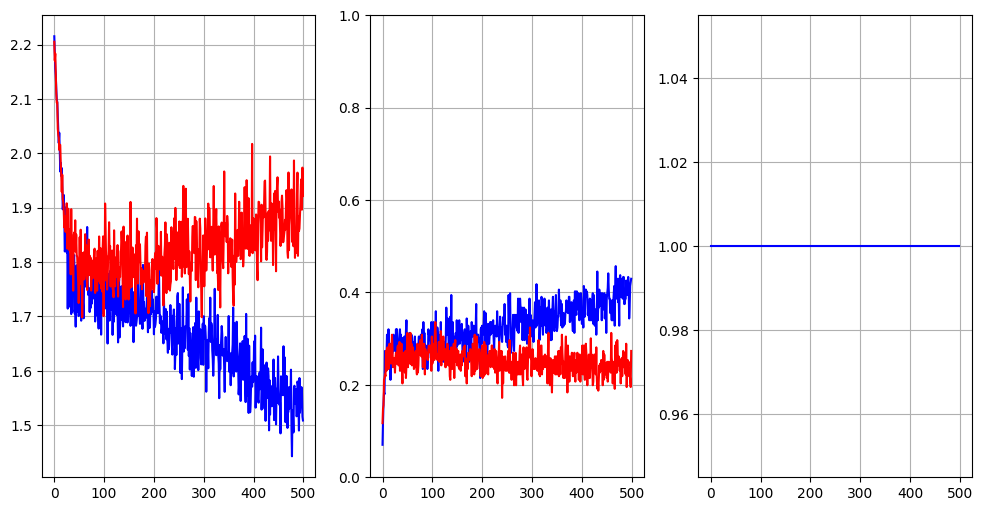

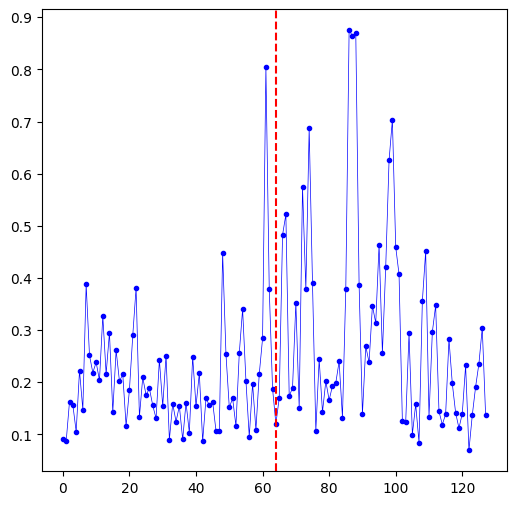

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:38<00:00,  5.07it/s]


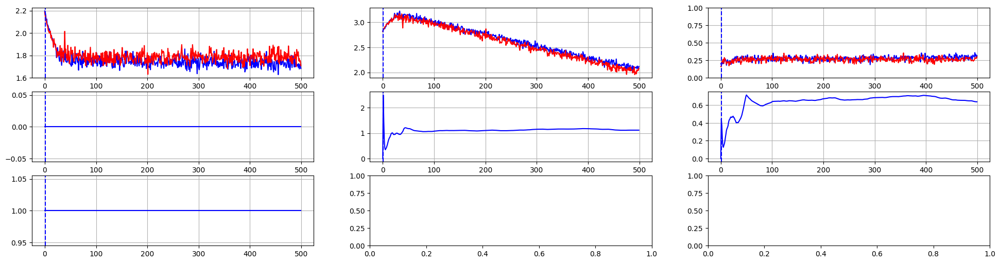

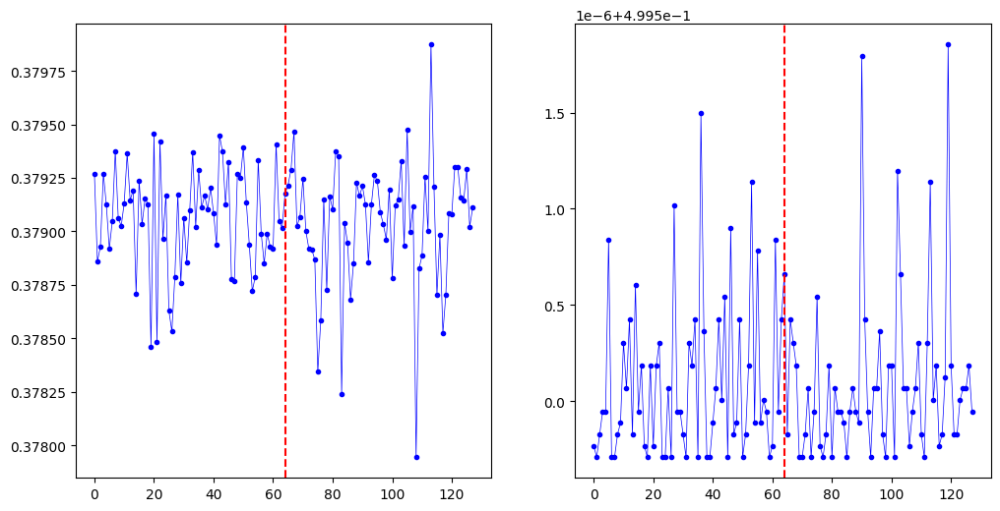



Proportion of variance which is leakage: 0.01


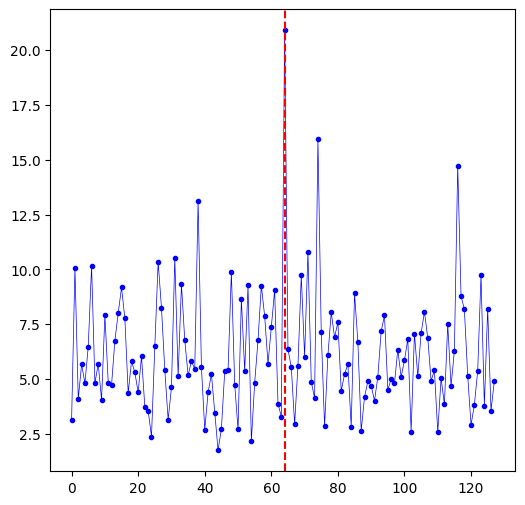

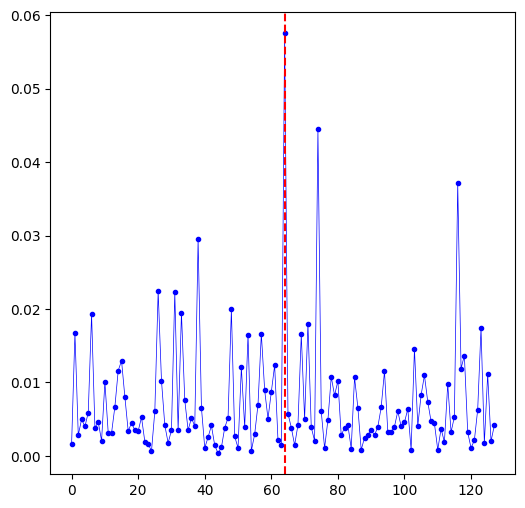

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.81it/s]


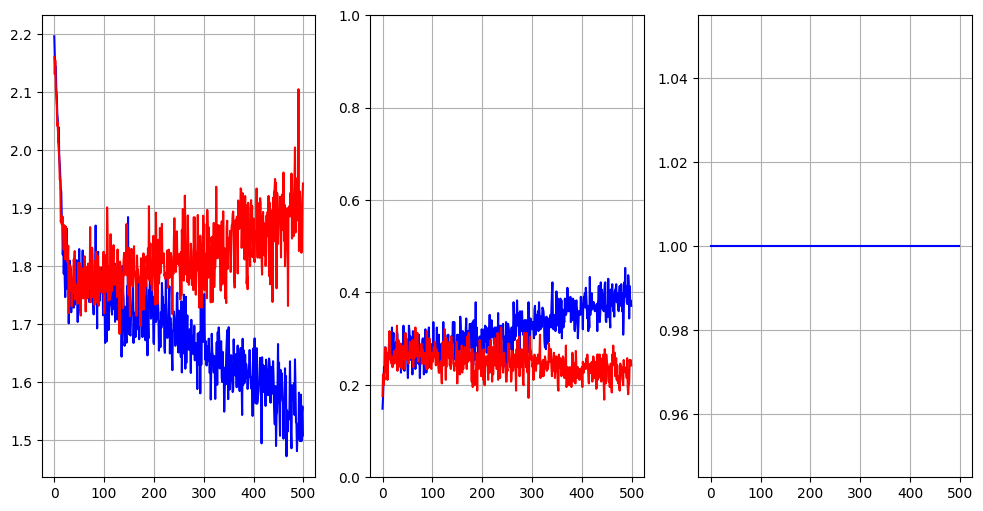

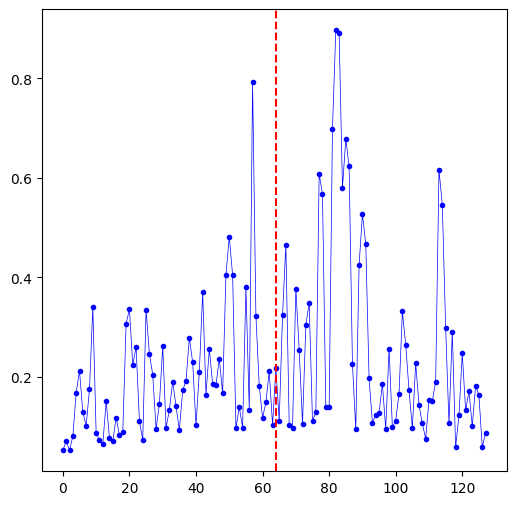

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.50it/s]


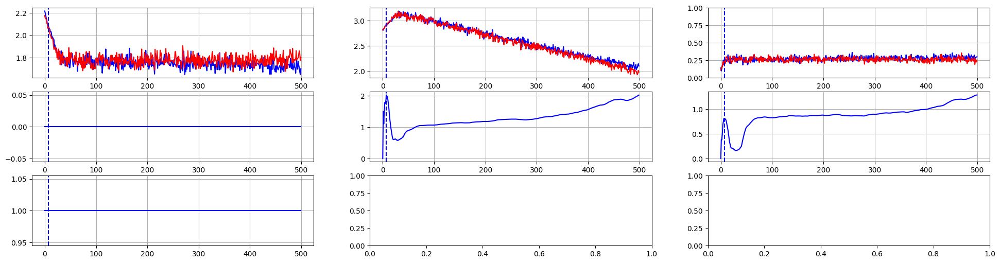

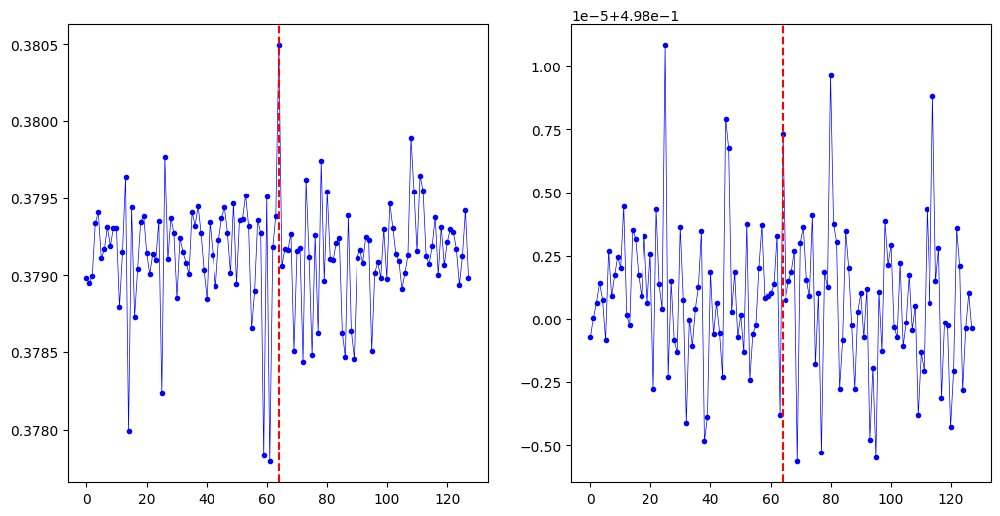



Proportion of variance which is leakage: 0.1


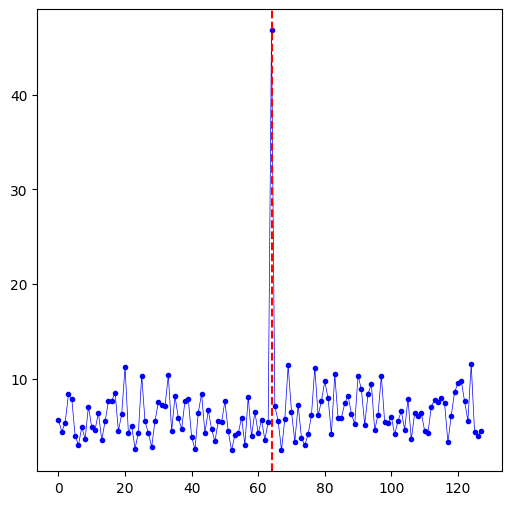

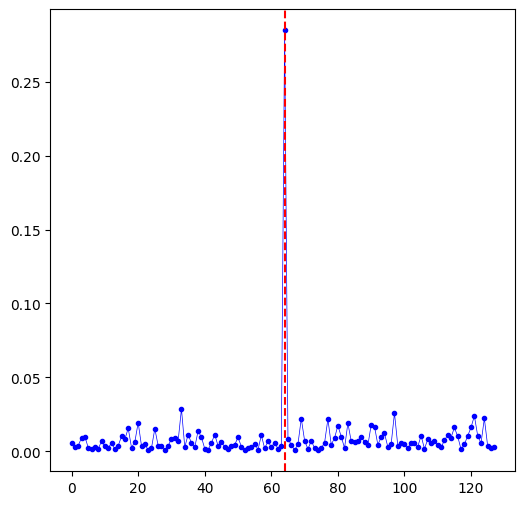

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:28<00:00,  5.62it/s]


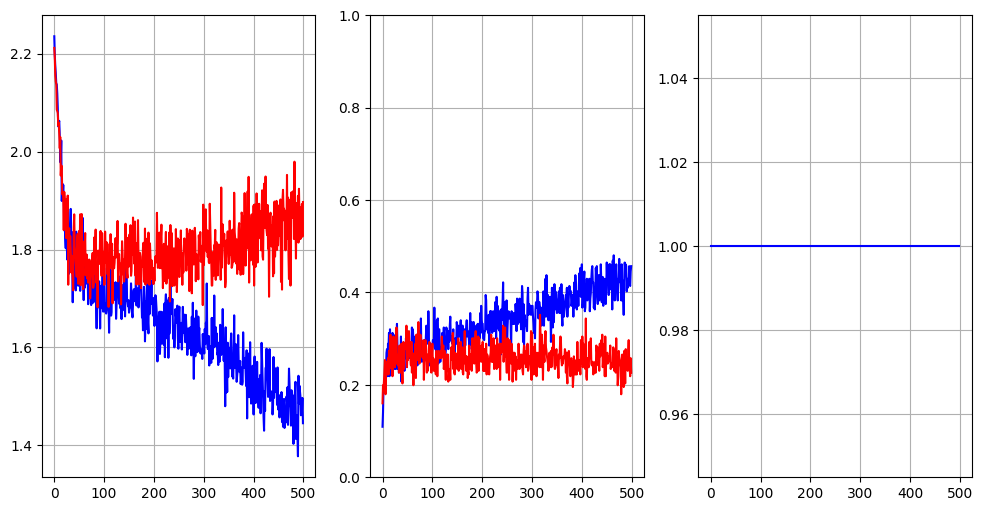

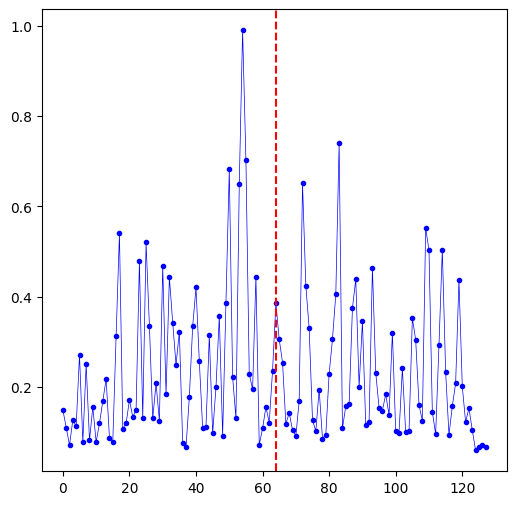

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.37it/s]


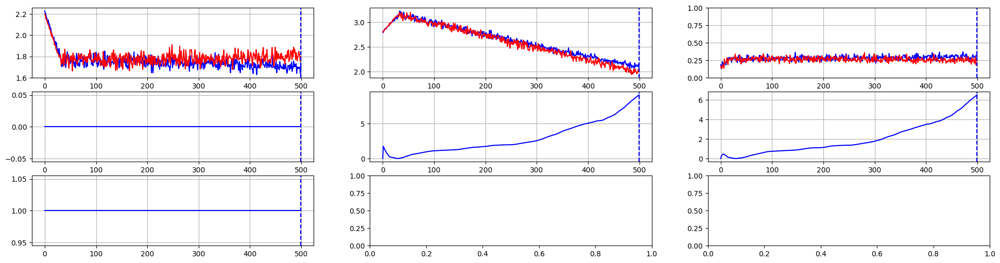

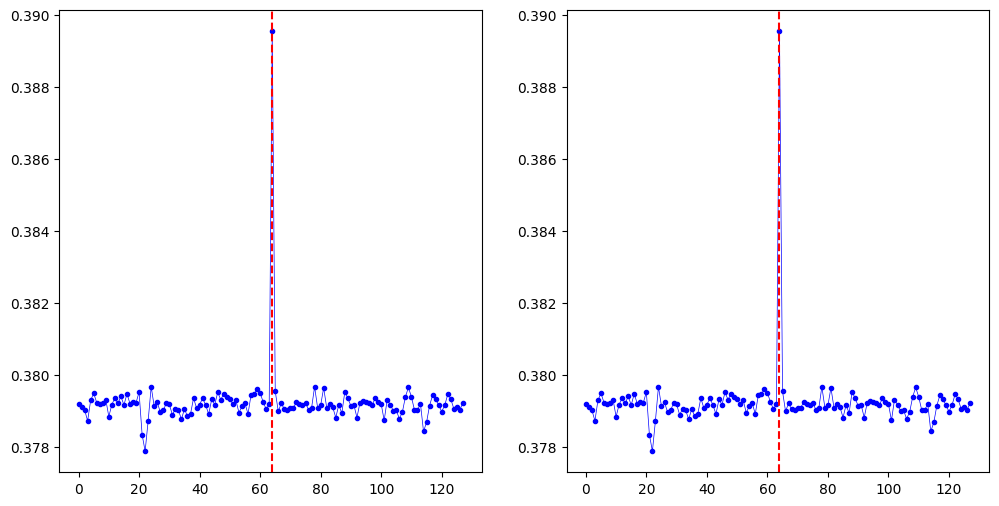



Proportion of variance which is leakage: 0.5


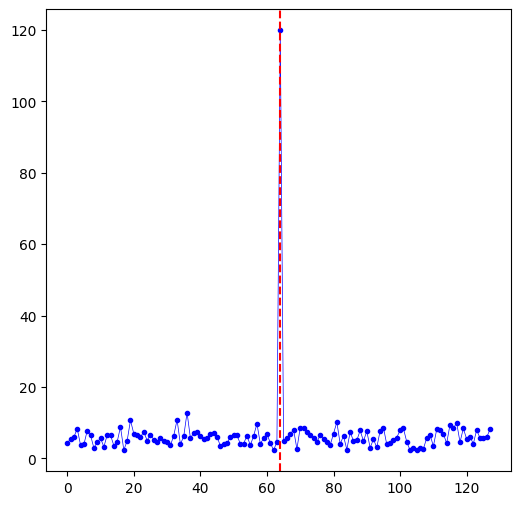

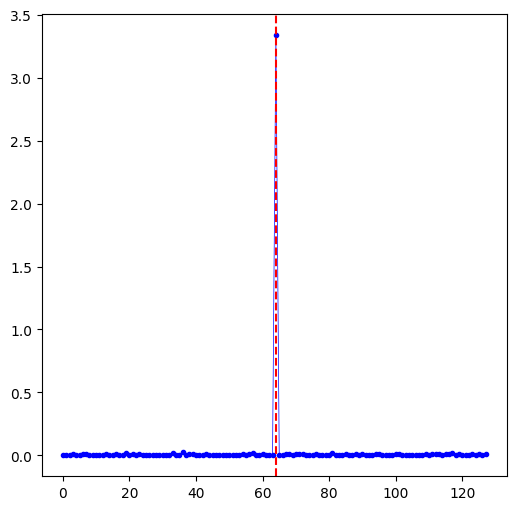

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.80it/s]


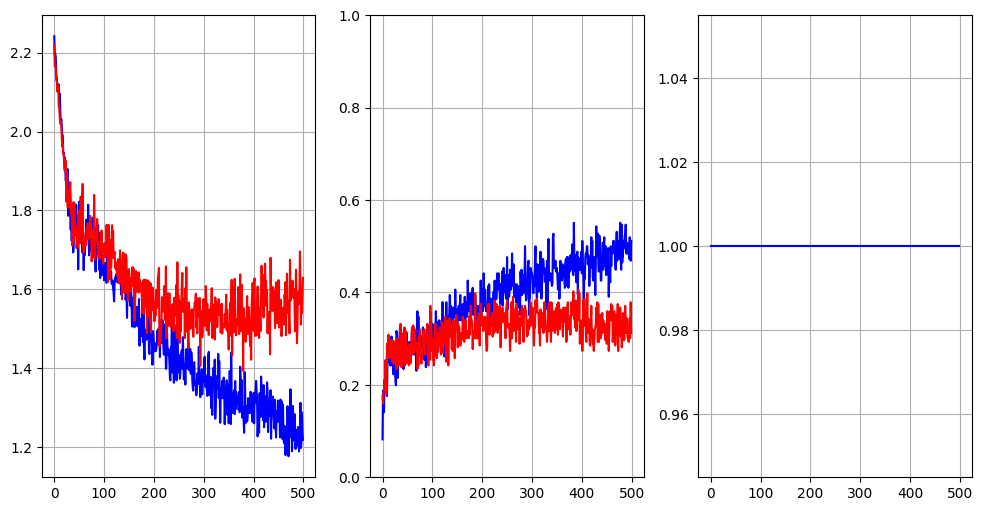

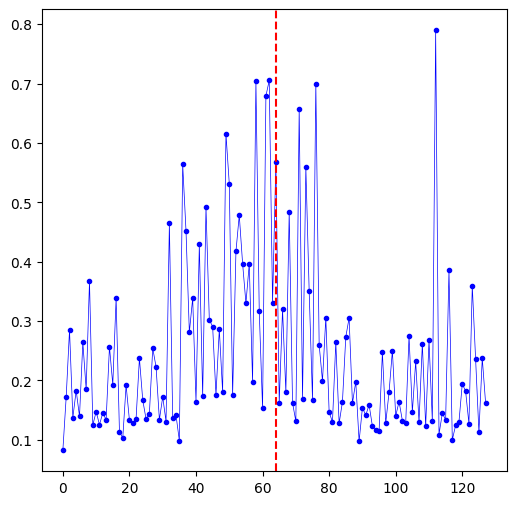

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.45it/s]


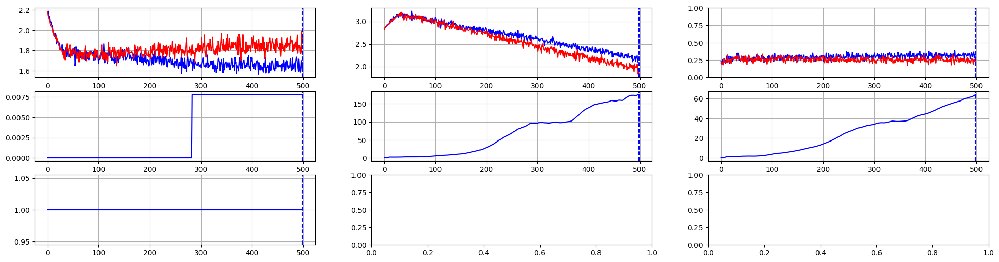

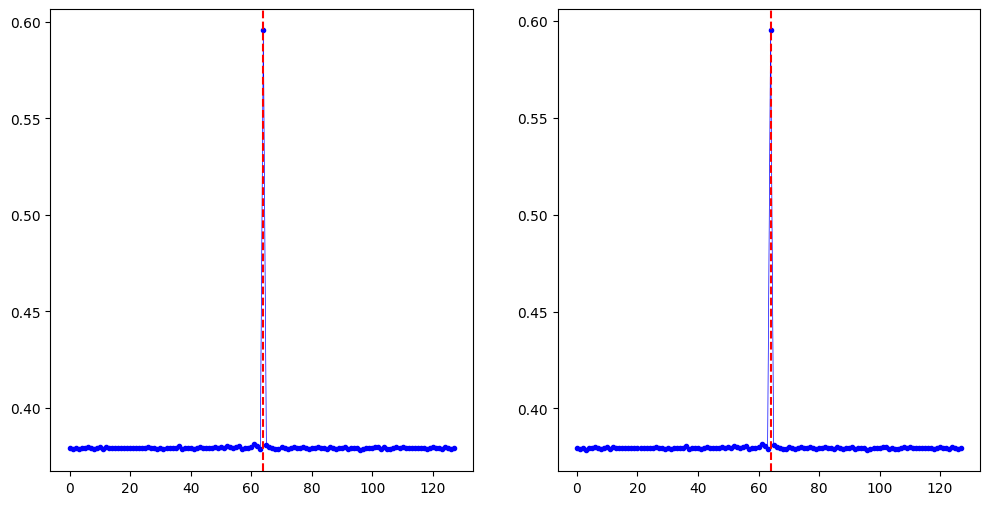



Proportion of variance which is leakage: 0.9


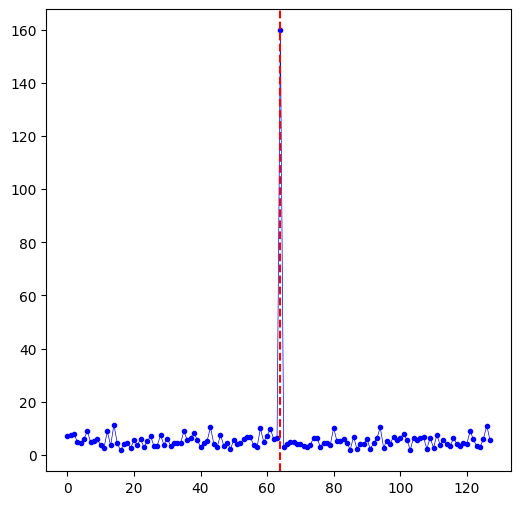

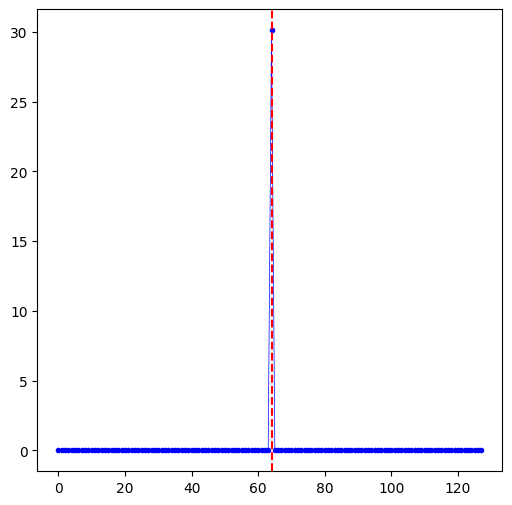

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.76it/s]


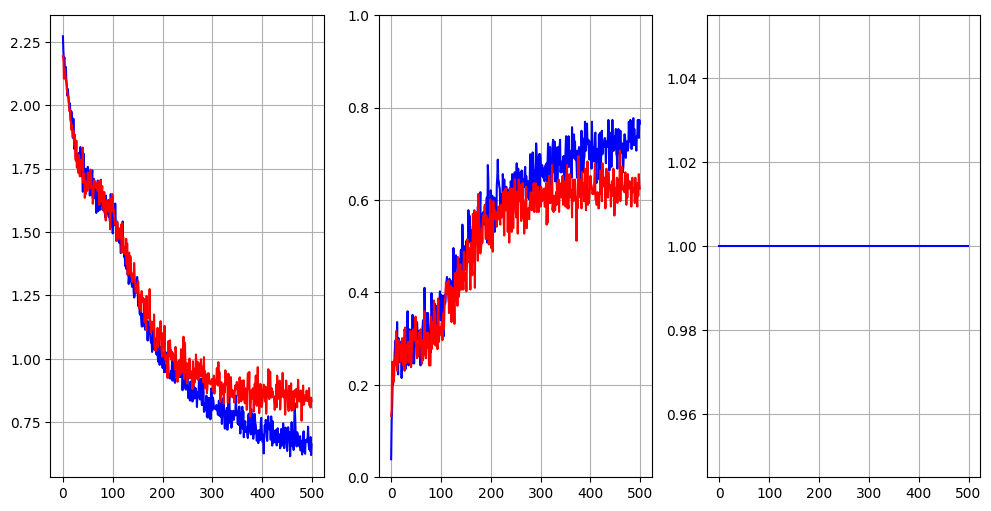

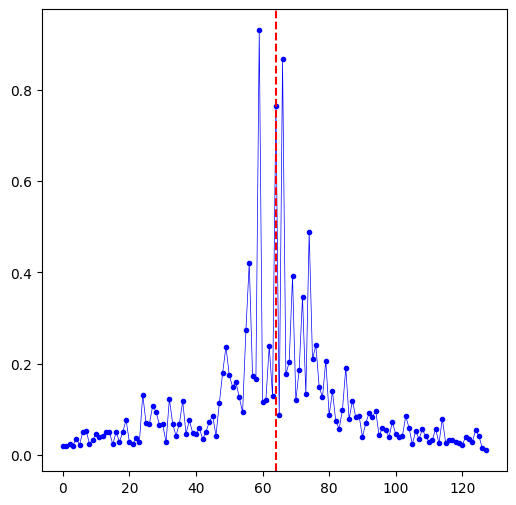

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.53it/s]


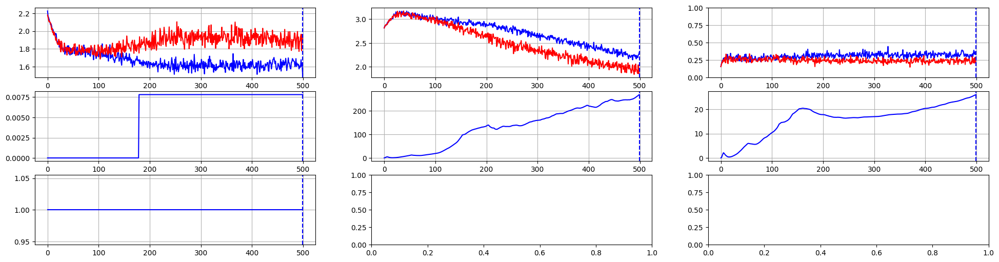

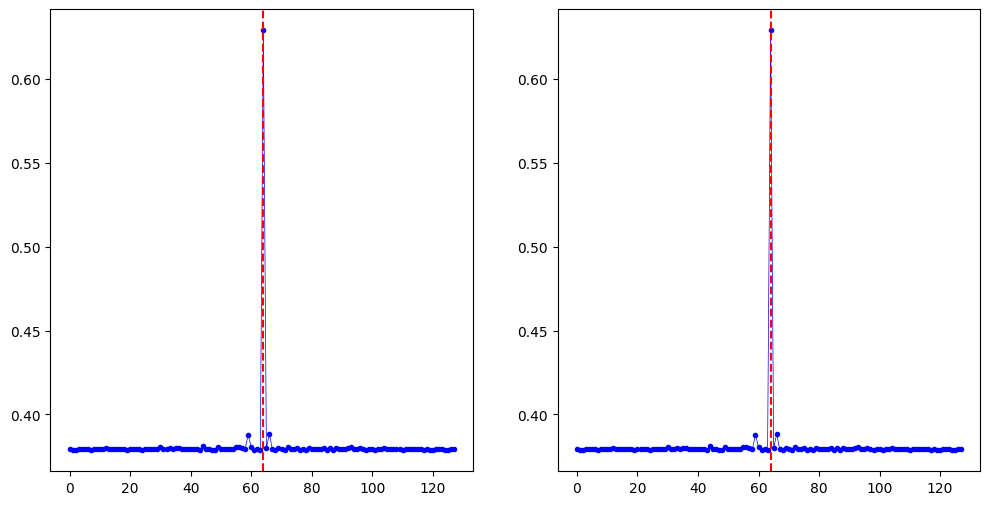



Proportion of variance which is leakage: 0.99


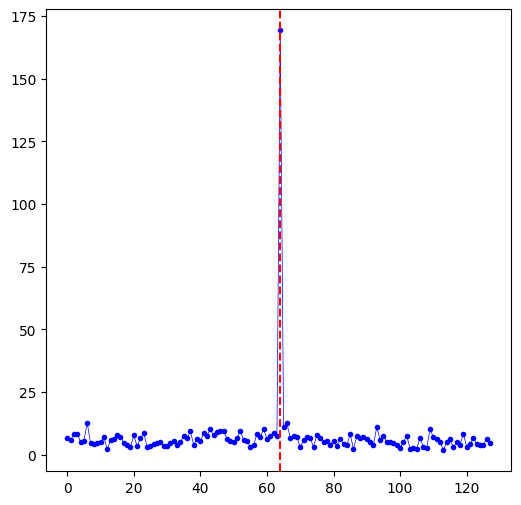

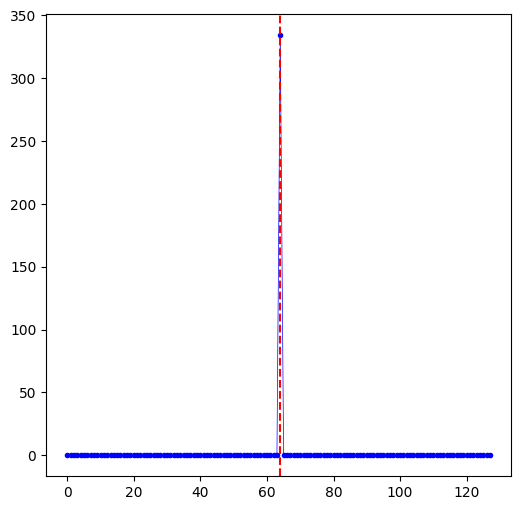

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.79it/s]


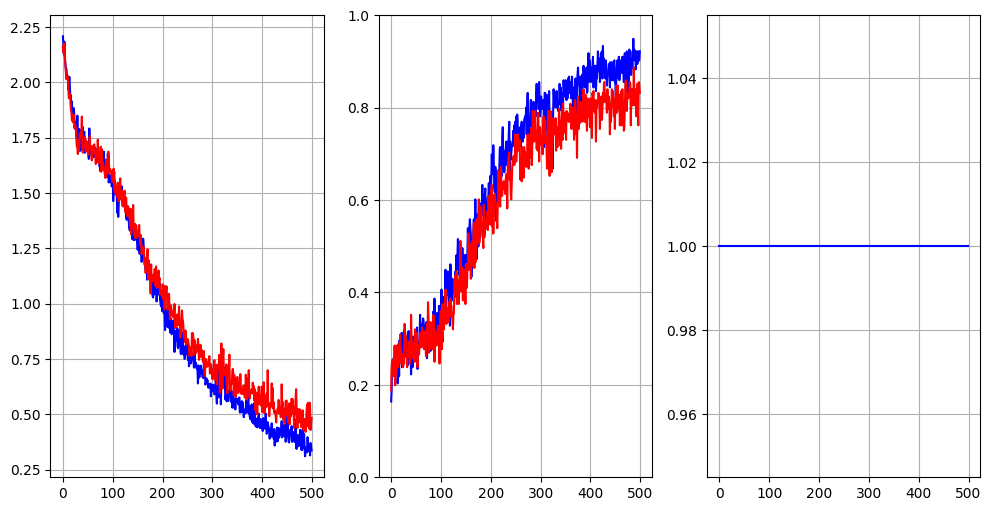

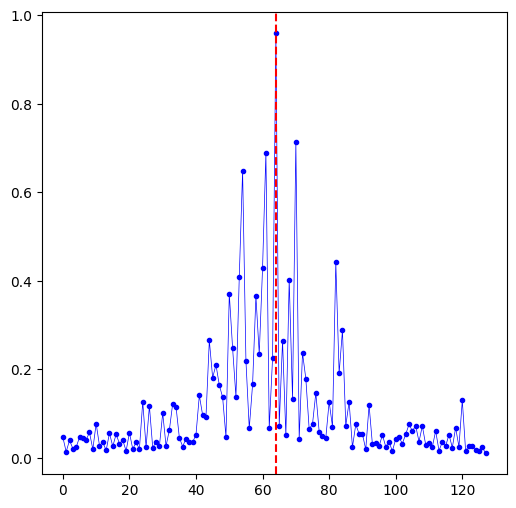

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


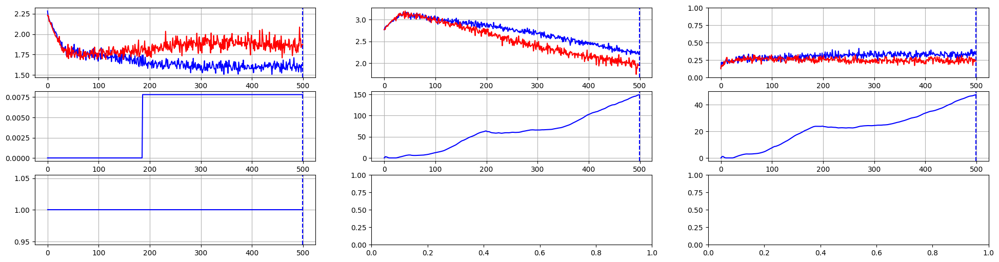

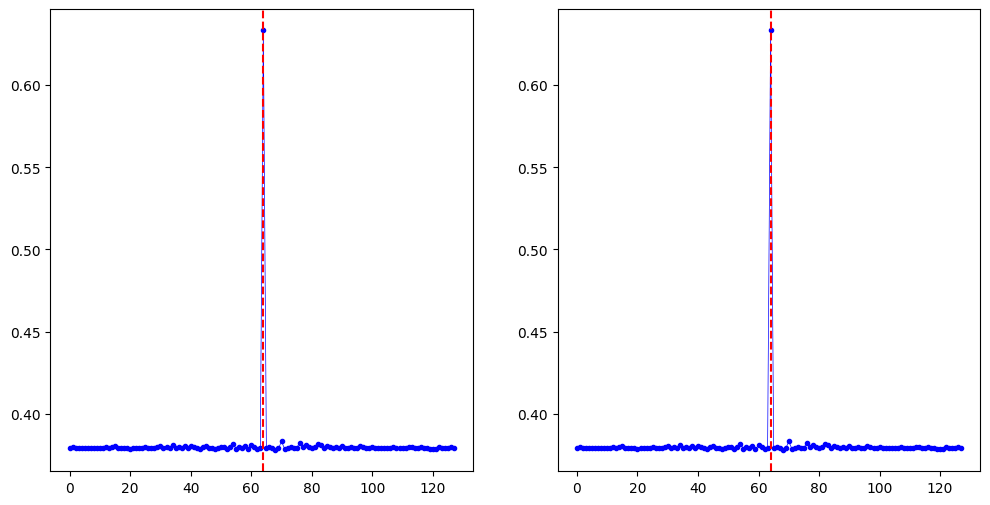



Proportion of variance which is leakage: 1.0


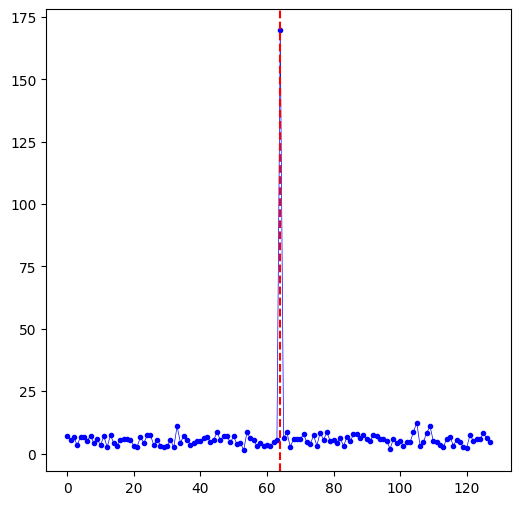

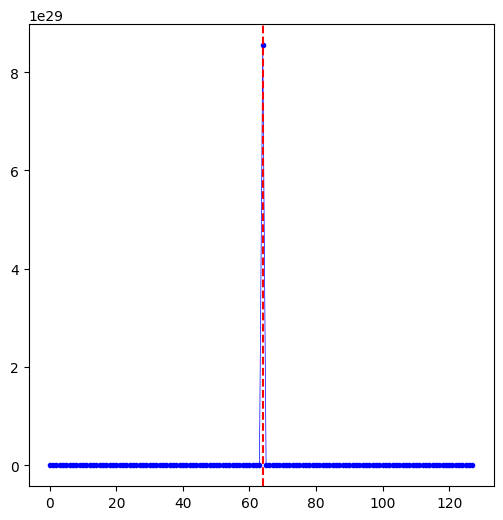

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:25<00:00,  5.82it/s]


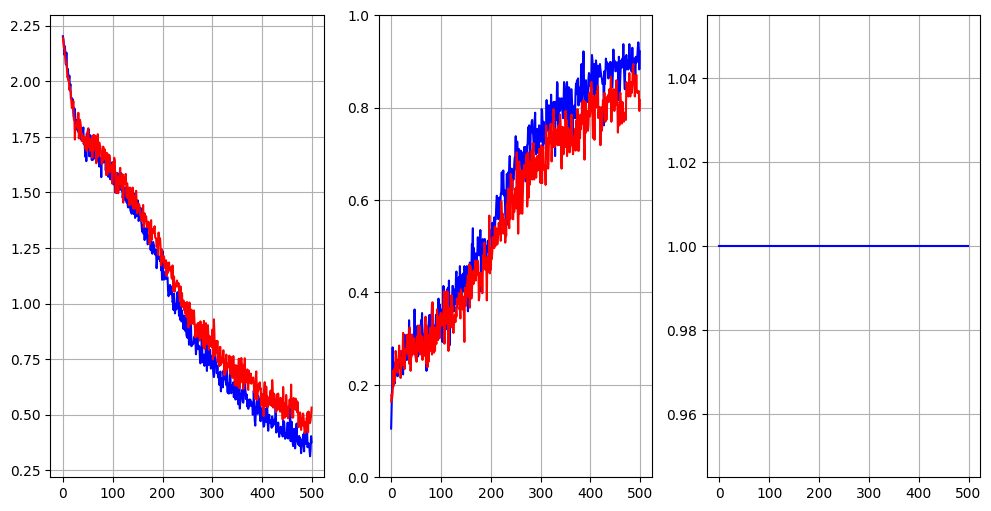

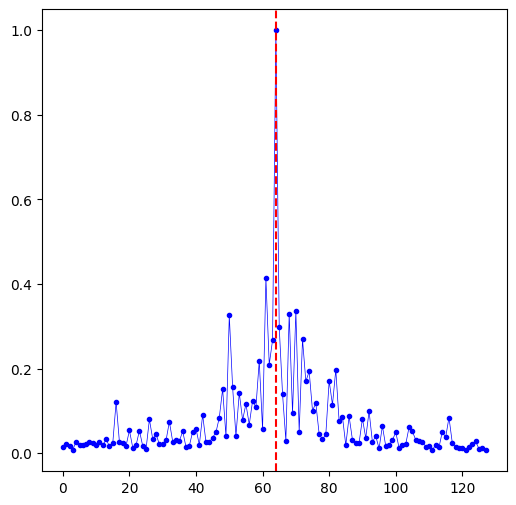

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.33it/s]


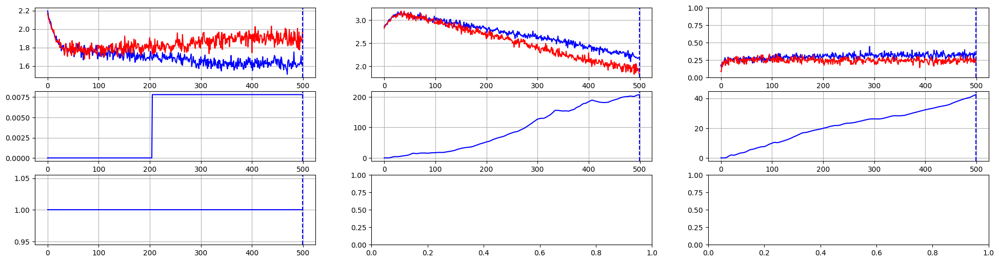

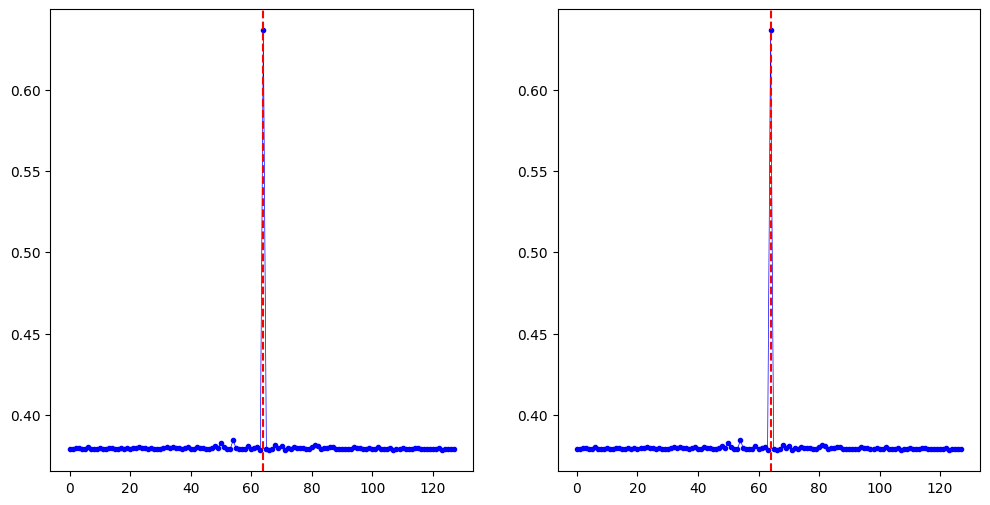

In [13]:
np_mean_ratios, np_max_ratios = [], []
noise_props = [0.0, 0.01, 0.1, 0.5, 0.9, 0.99, 1.0]
for noise_prop in noise_props:
    print('Proportion of variance which is leakage:', noise_prop)
    dataset = SyntheticAES__Finite(dataset_size=10000, num_samples=128, points=np.array([leakage_point]), varying_noise_stdev=1.0, hamming_weight_variance_prop=noise_prop, num_leaking_samples=1, num_xor_samples=0, target=target, delay_size=0)
    train_dataset, holdout_dataset = torch.utils.data.random_split(dataset, (len(dataset)//2, len(dataset)-len(dataset)//2))
    trace_means = get_trace_means(dataset)
    run_sod_trial(dataset)
    run_snr_trial(dataset)
    run_cnn_trial(train_dataset, holdout_dataset)
    mean_ratio, max_ratio = run_gan_trial(train_dataset, holdout_dataset)
    np_mean_ratios.append(mean_ratio)
    np_max_ratios.append(max_ratio)
    print()
    print()

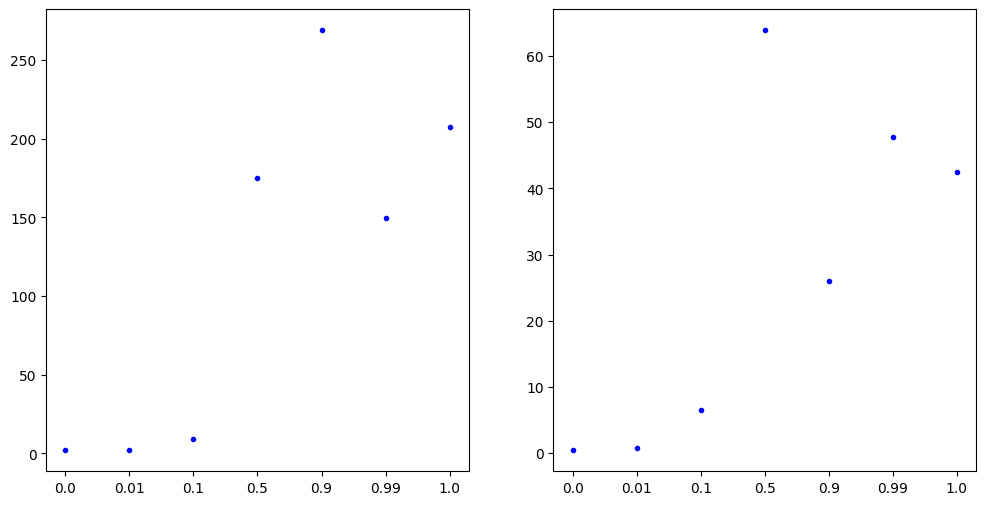

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(2*ax_width, ax_height))
for ax in axes.flatten():
    ax.set_xticks(np.arange(len(noise_props)))
    ax.set_xticklabels(noise_props)
axes[0].plot(np_mean_ratios, '.', color='blue')
axes[1].plot(np_max_ratios, '.', color='blue')

Number of leaking points: 1


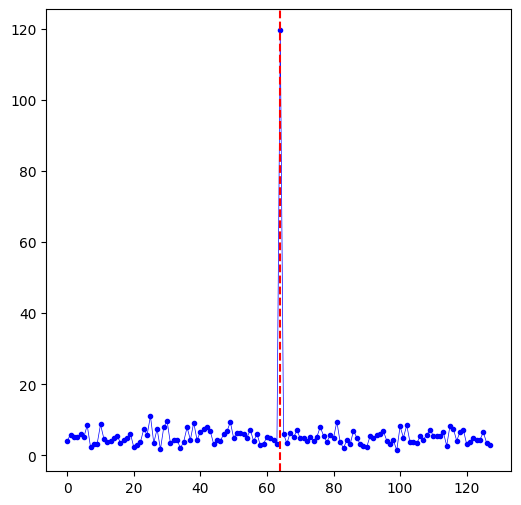

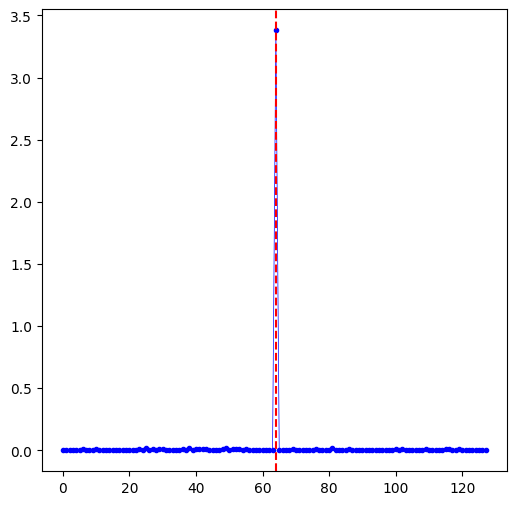

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.80it/s]


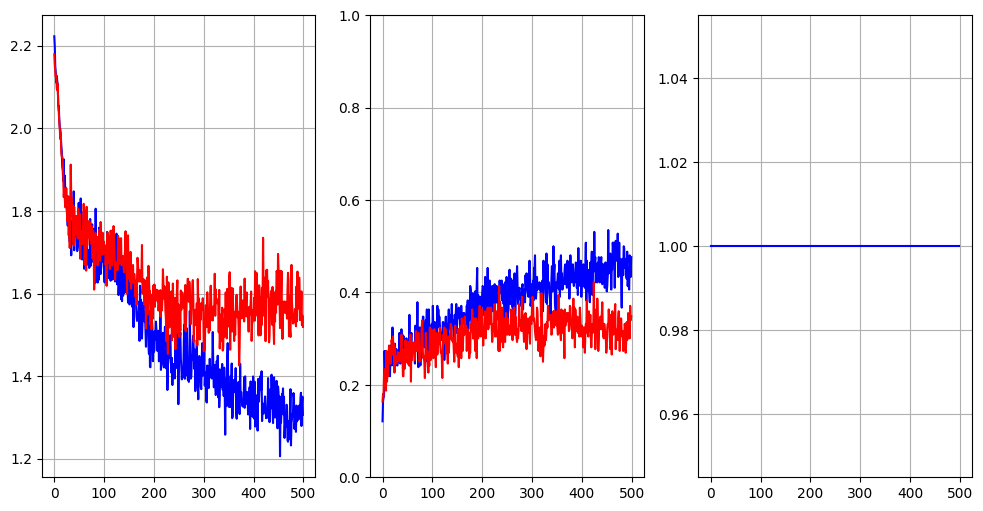

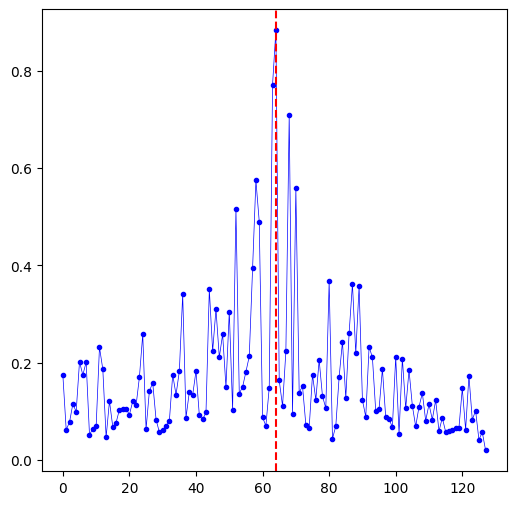

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


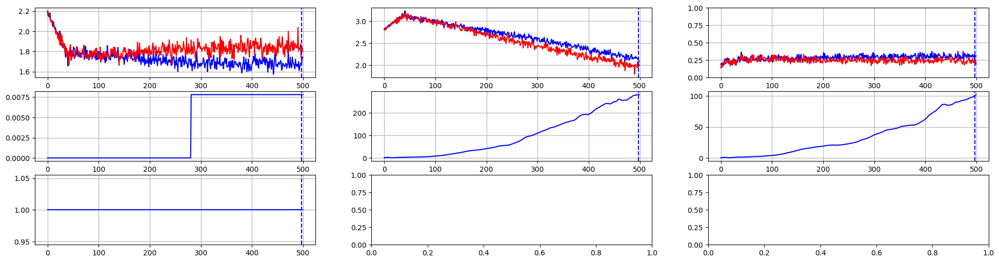

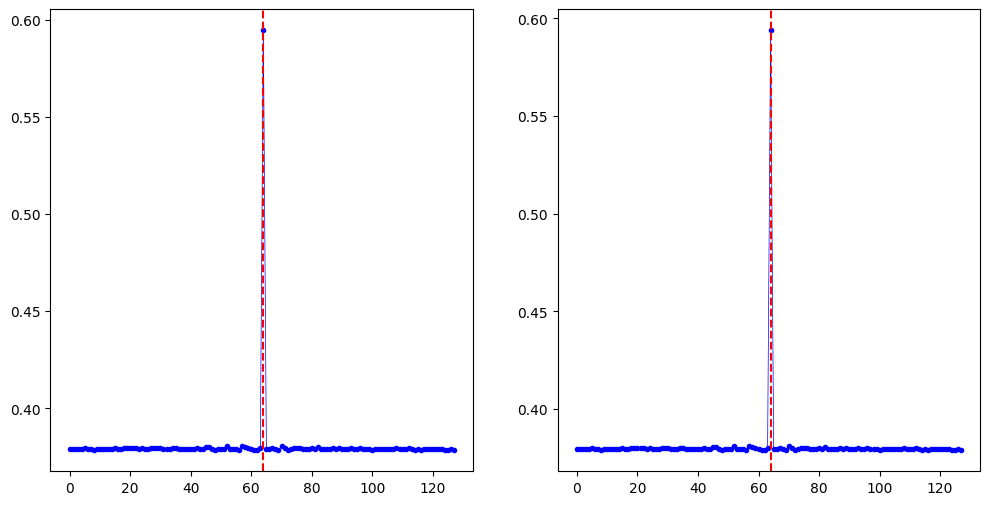



Number of leaking points: 2


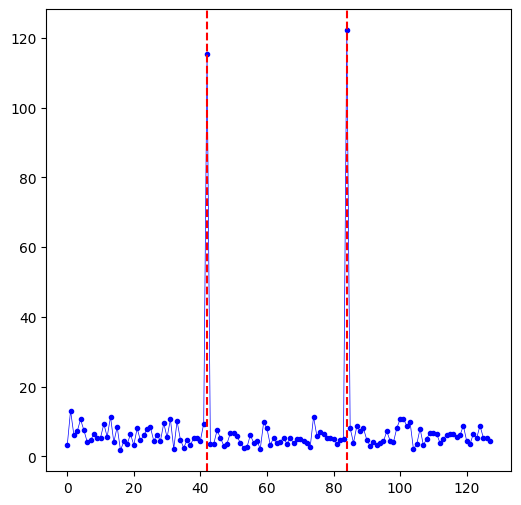

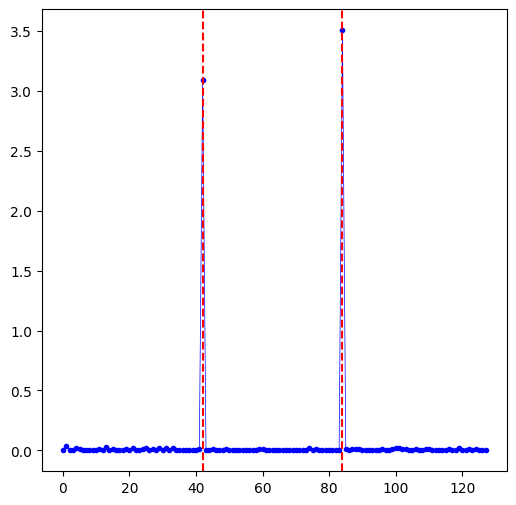

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.77it/s]


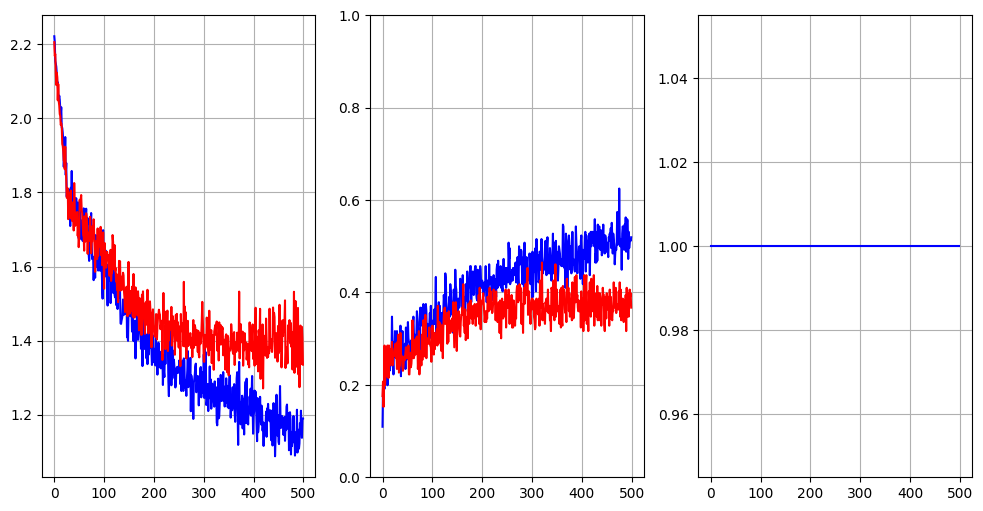

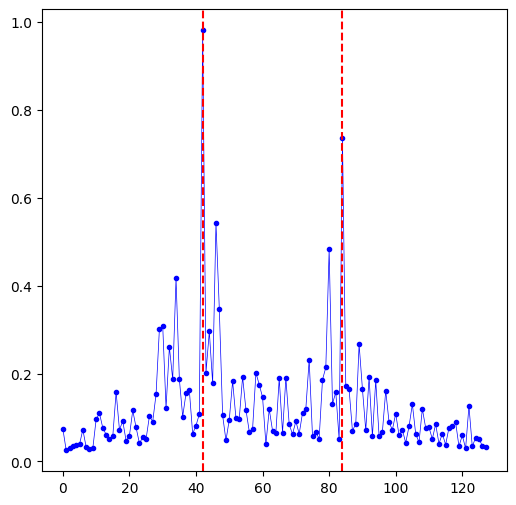

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.48it/s]


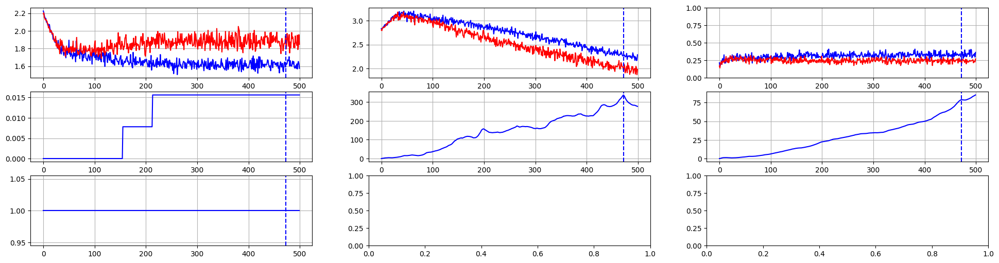

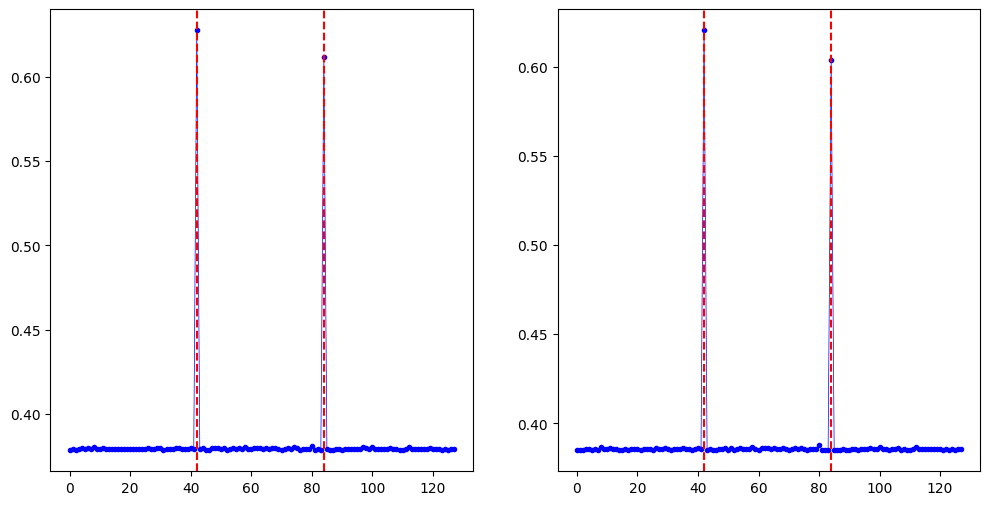



Number of leaking points: 4


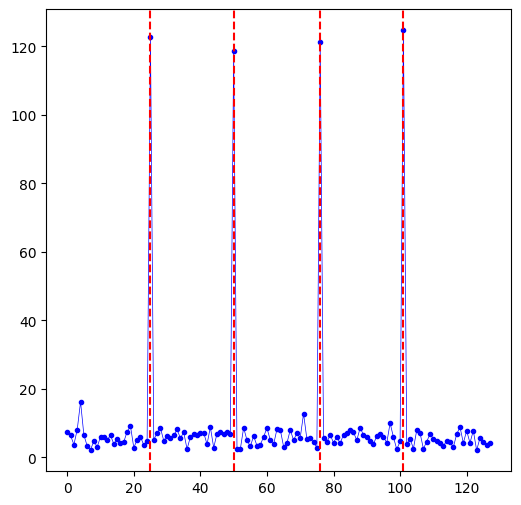

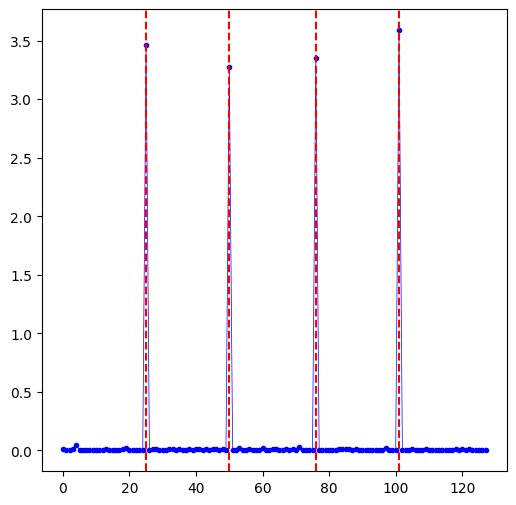

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:29<00:00,  5.57it/s]


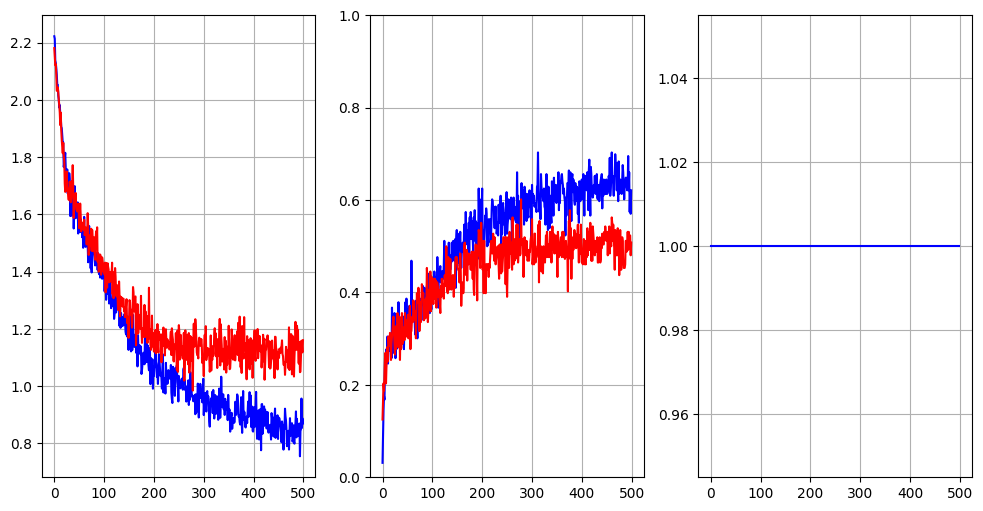

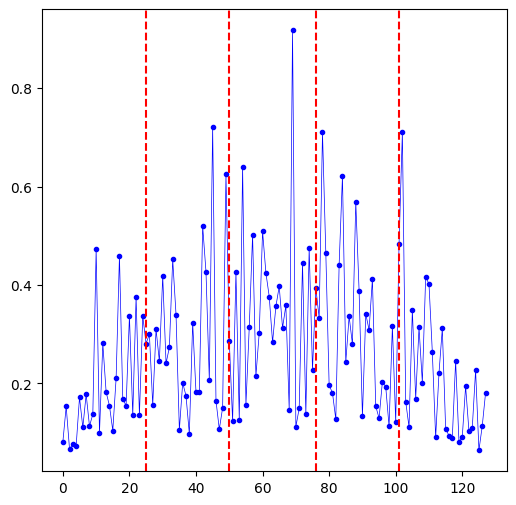

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.47it/s]


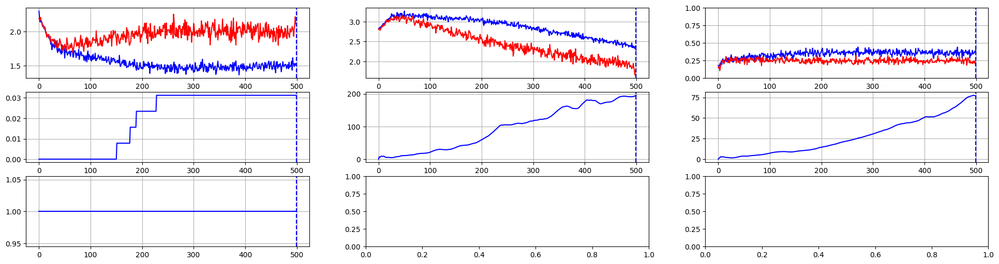

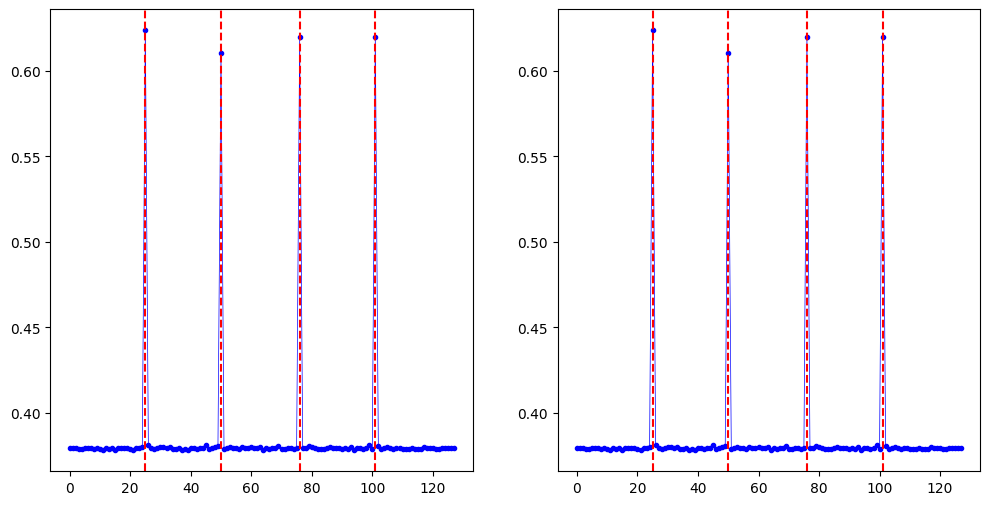



Number of leaking points: 8


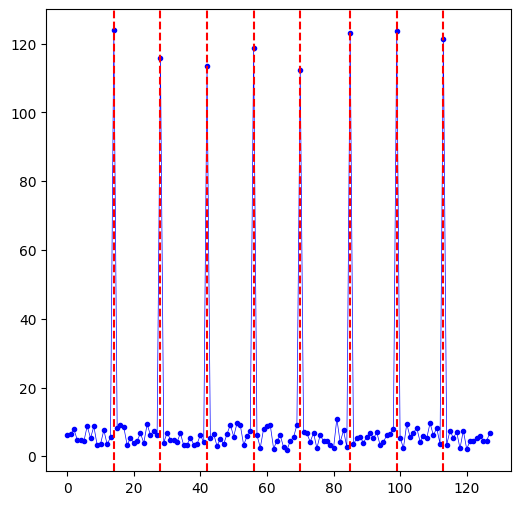

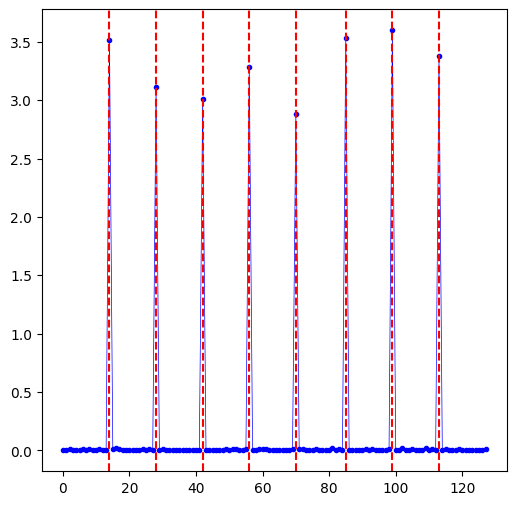

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


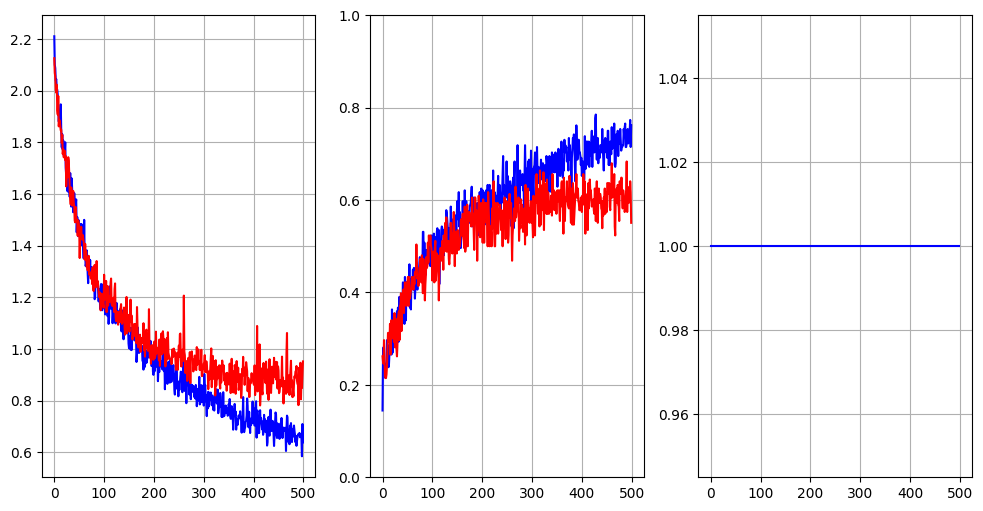

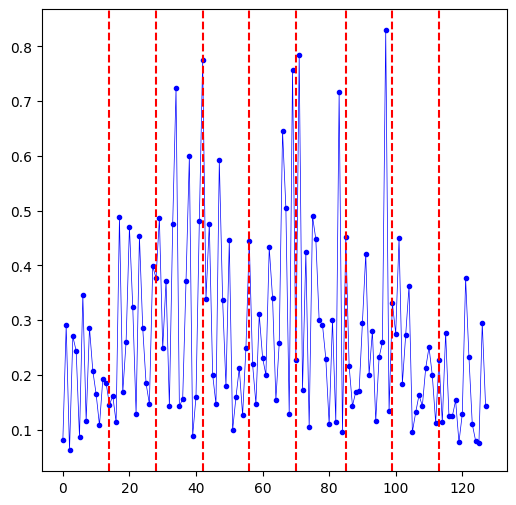

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.36it/s]


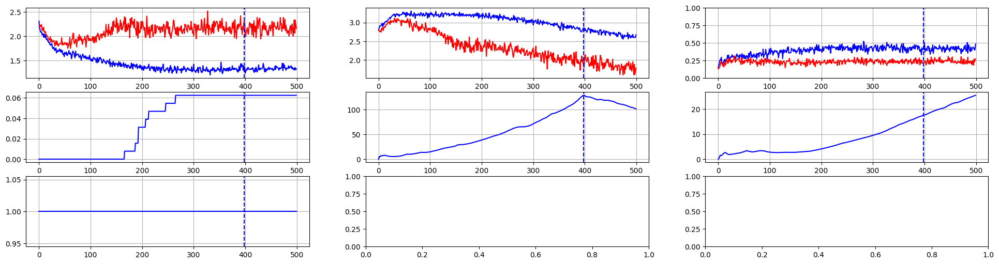

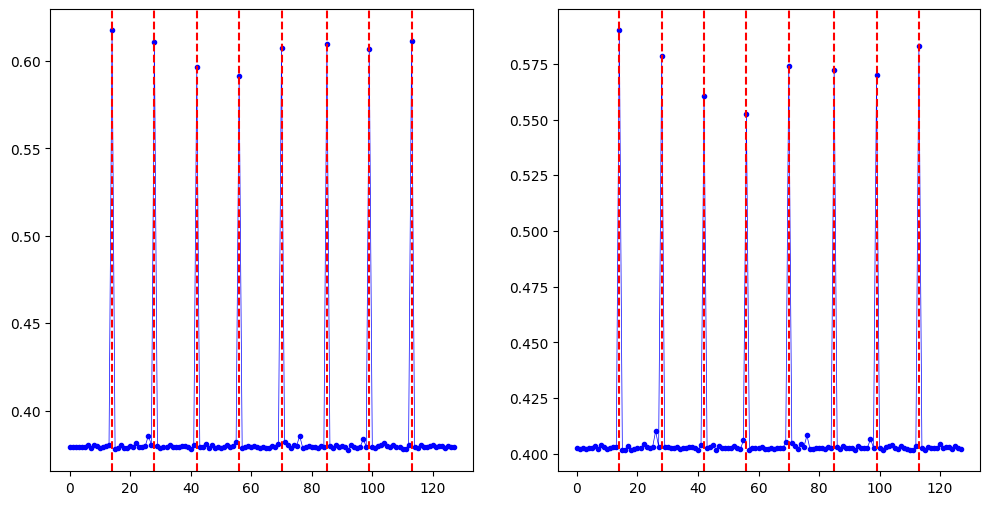



Number of leaking points: 16


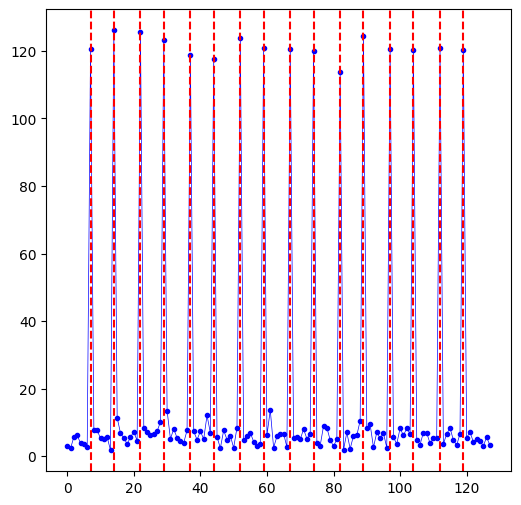

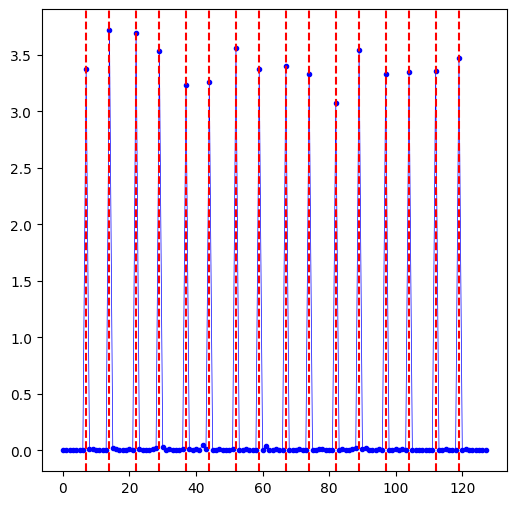

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.76it/s]


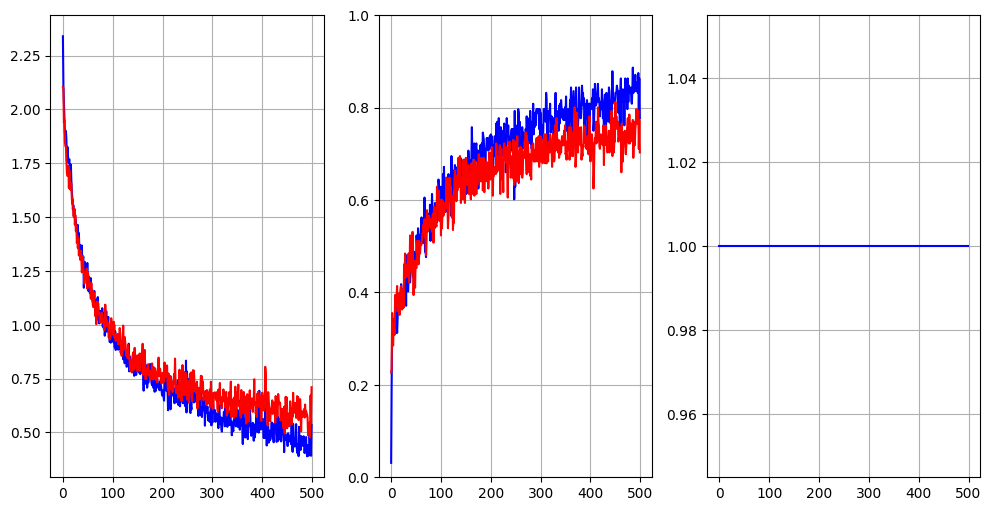

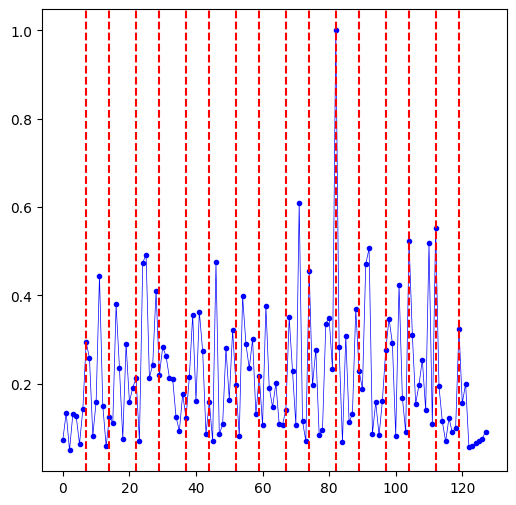

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


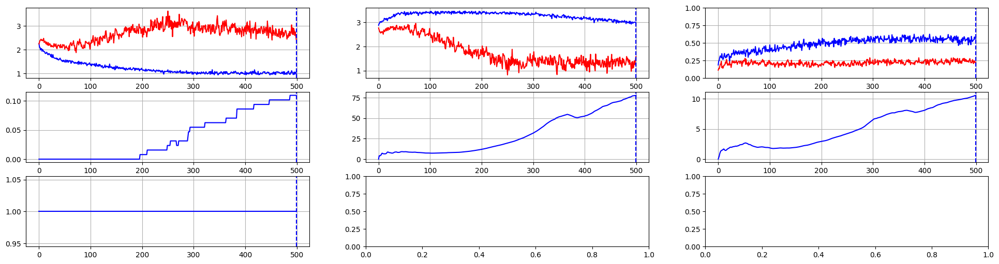

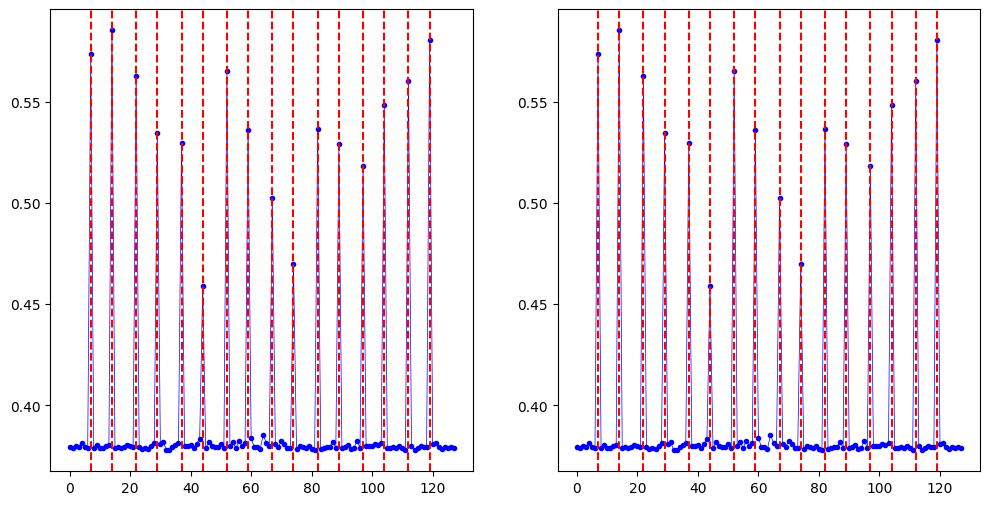



Number of leaking points: 32


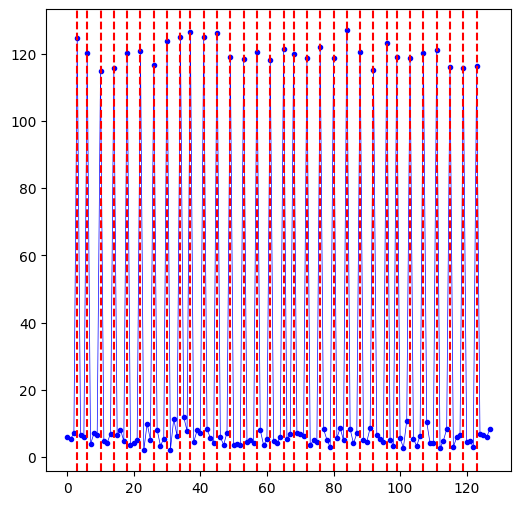

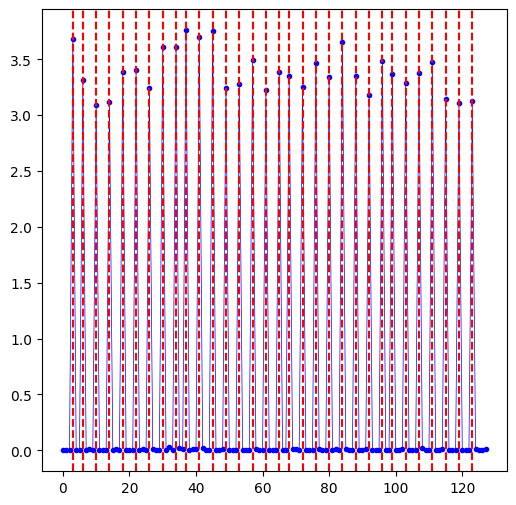

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.77it/s]


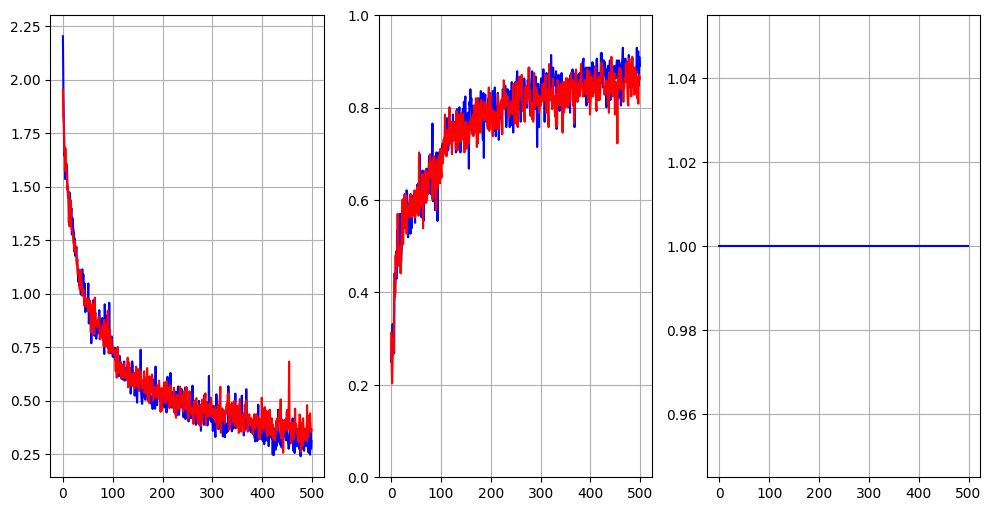

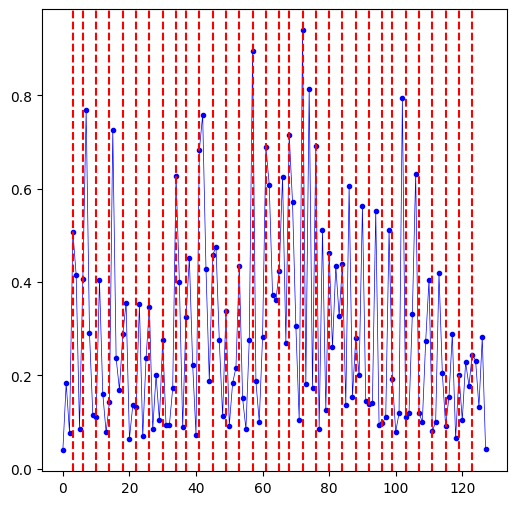

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


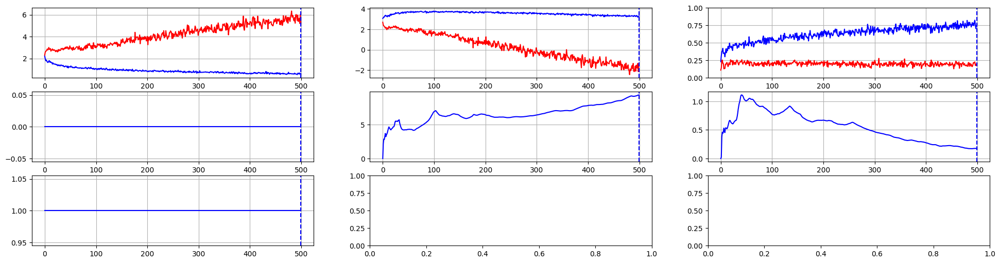

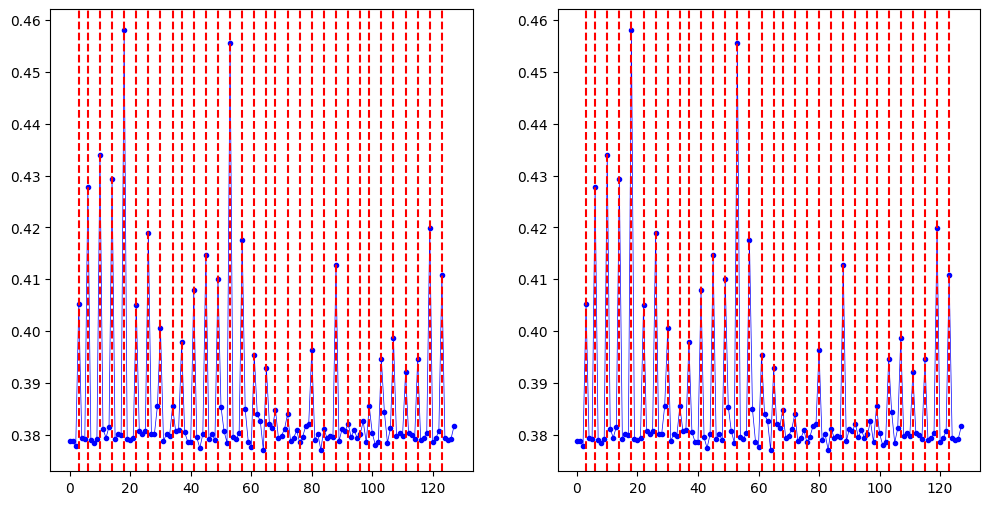



Number of leaking points: 64


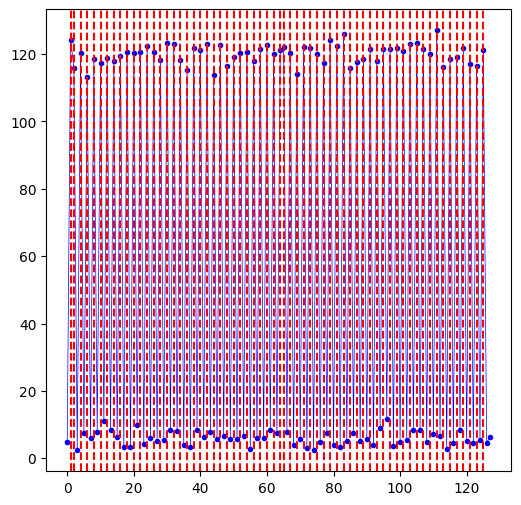

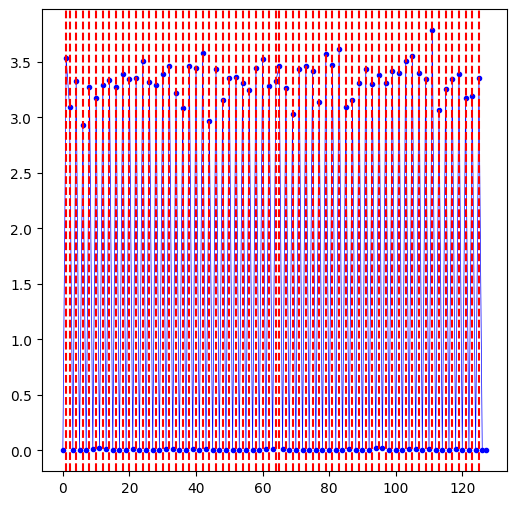

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.75it/s]


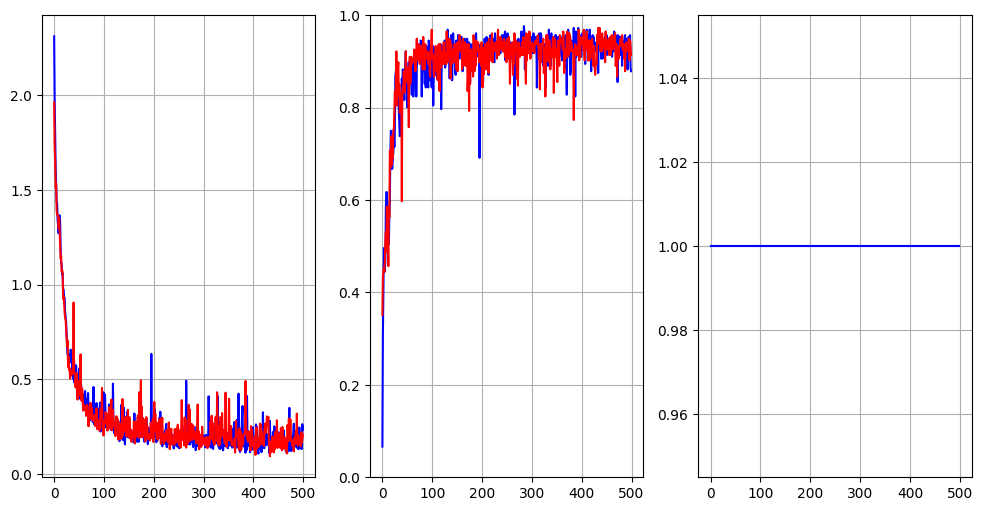

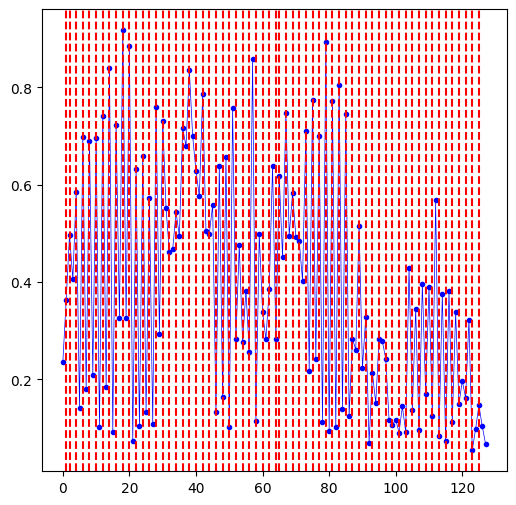

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


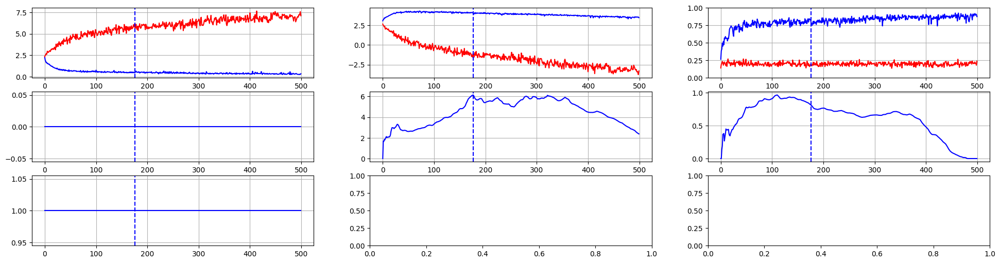

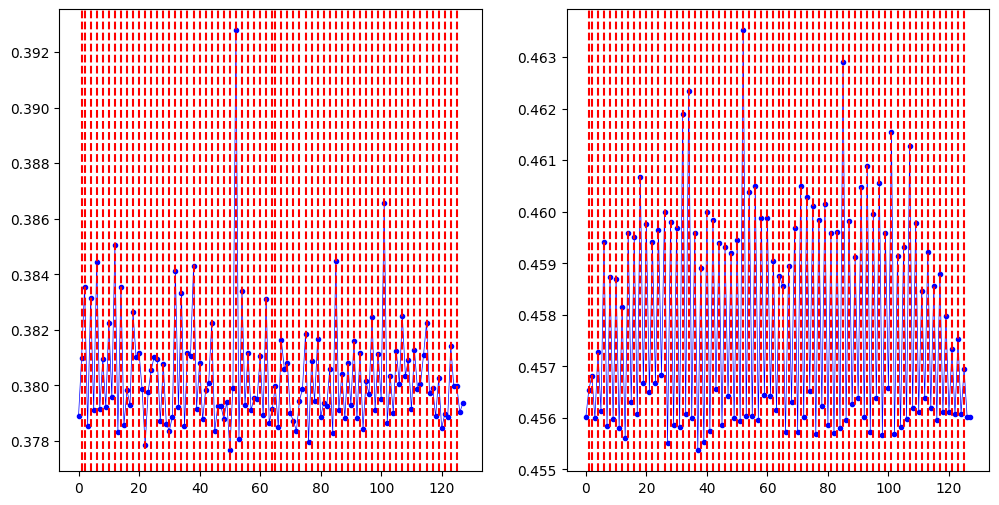

In [15]:
np_mean_ratios, np_max_ratios = [], []
leaking_point_counts = [1, 2, 4, 8, 16, 32, 64]
for leaking_point_count in leaking_point_counts:
    print('Number of leaking points:', leaking_point_count)
    dataset = SyntheticAES__Finite(
        dataset_size=10000, num_samples=128,
        points=np.array([128//(leaking_point_count+1) + x*128//(leaking_point_count+1) for x in range(leaking_point_count)]),
        varying_noise_stdev=1.0, hamming_weight_variance_prop=0.5,
        num_leaking_samples=leaking_point_count, num_xor_samples=0, target=target, delay_size=0
    )
    train_dataset, holdout_dataset = torch.utils.data.random_split(dataset, (len(dataset)//2, len(dataset)-len(dataset)//2))
    trace_means = get_trace_means(dataset)
    run_sod_trial(dataset)
    run_snr_trial(dataset)
    run_cnn_trial(train_dataset, holdout_dataset)
    mean_ratio, max_ratio = run_gan_trial(train_dataset, holdout_dataset)
    np_mean_ratios.append(mean_ratio)
    np_max_ratios.append(max_ratio)
    print()
    print()

Number of leaking points: 1


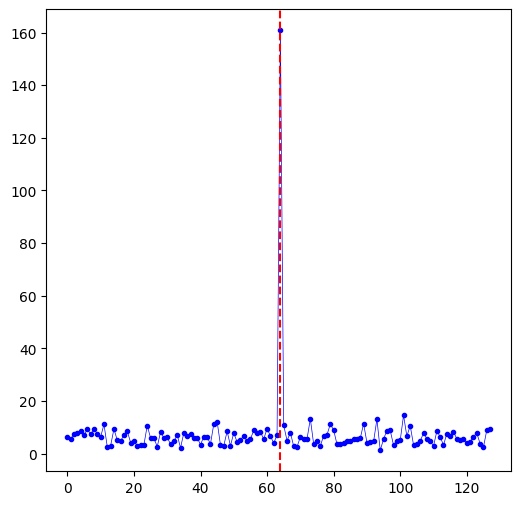

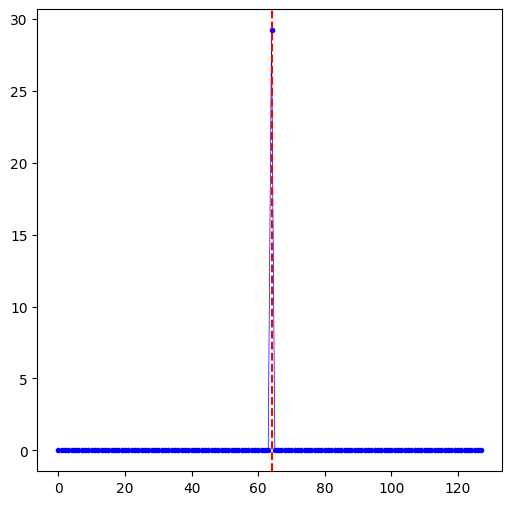

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.74it/s]


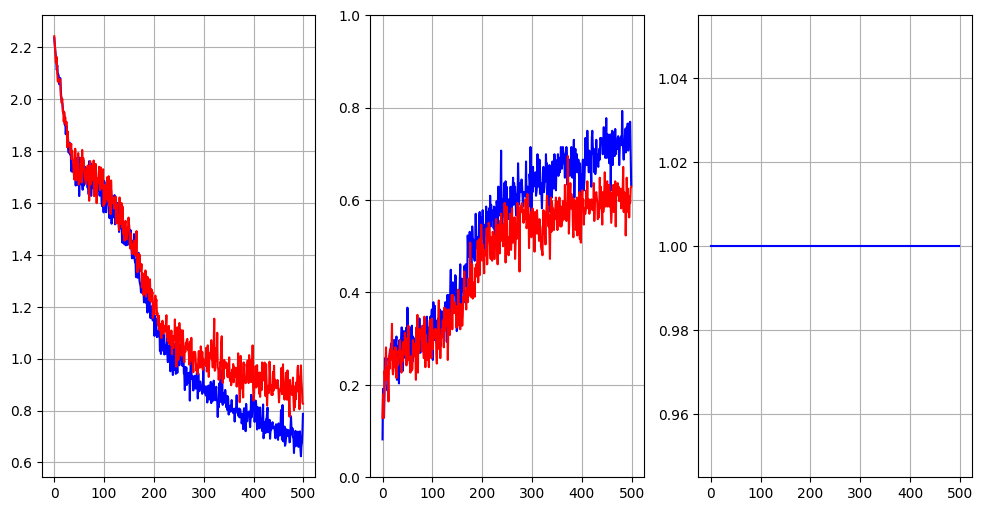

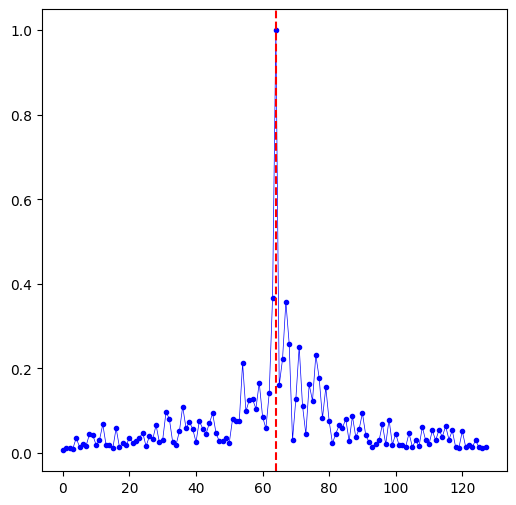

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.46it/s]


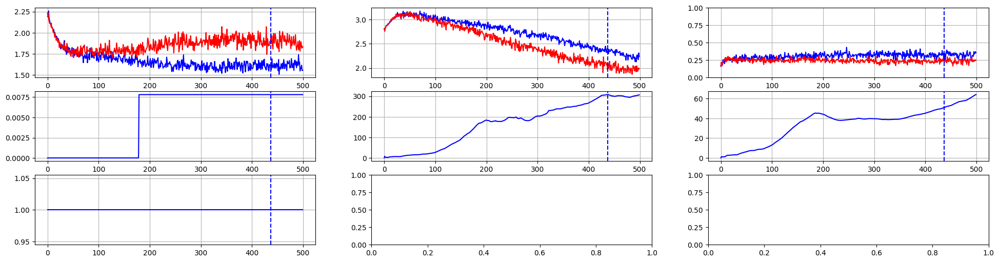

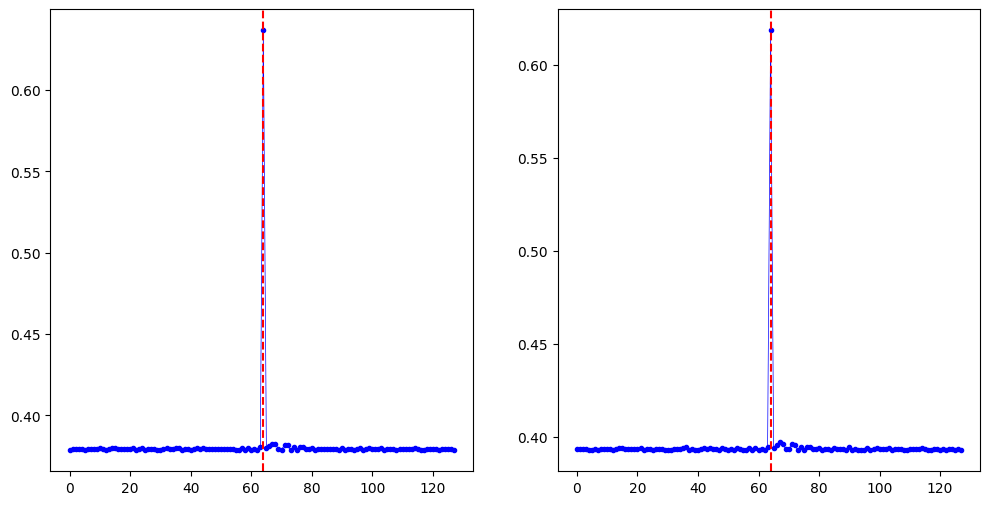



Number of leaking points: 2


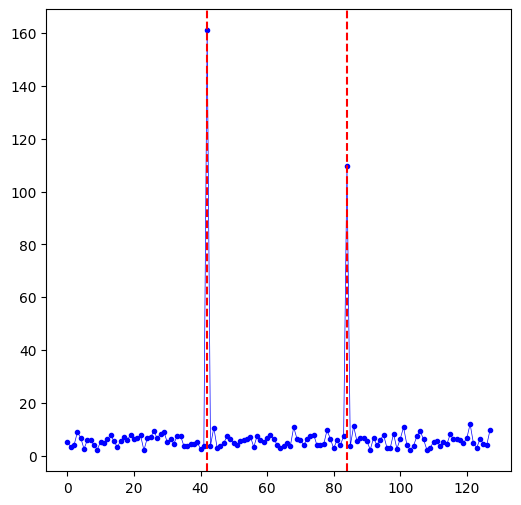

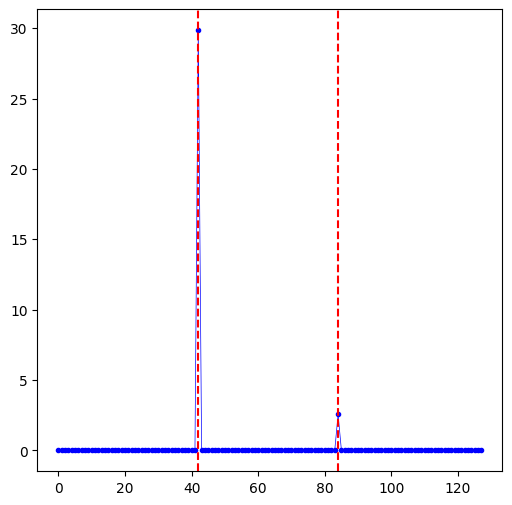

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [05:00<00:00,  1.67it/s]


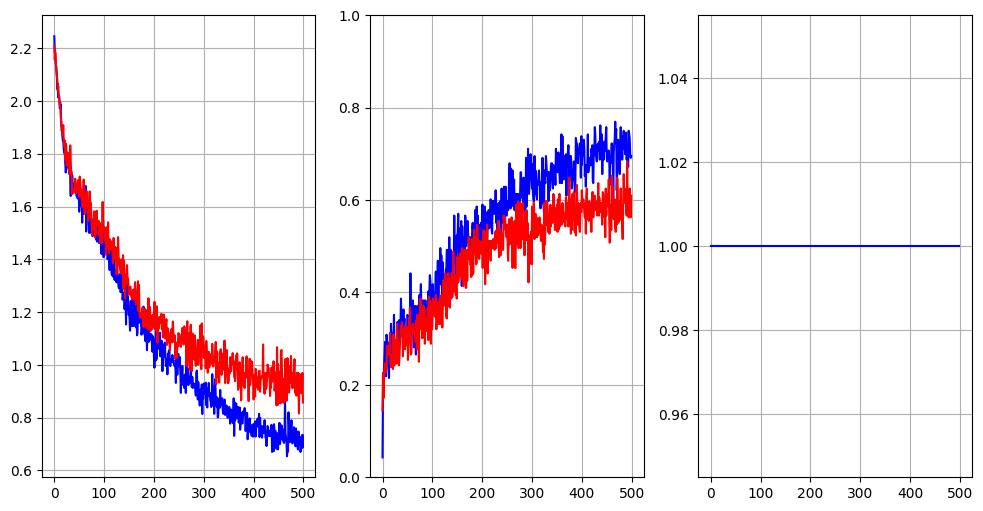

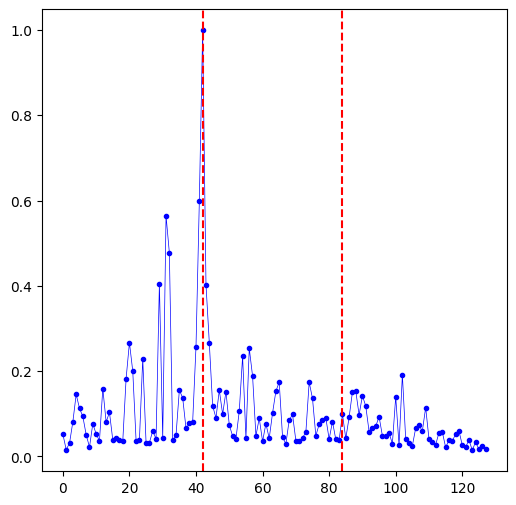

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:32<00:00,  5.43it/s]


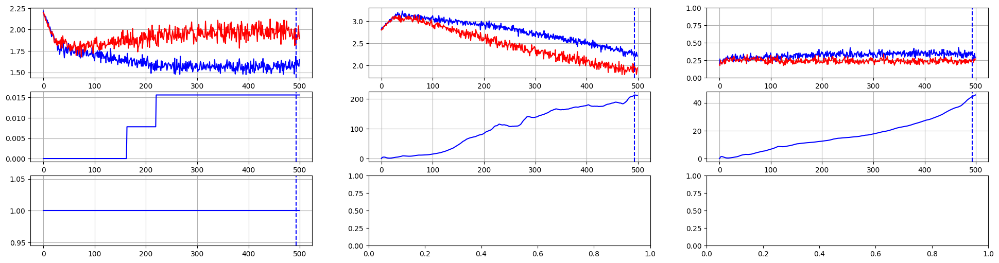

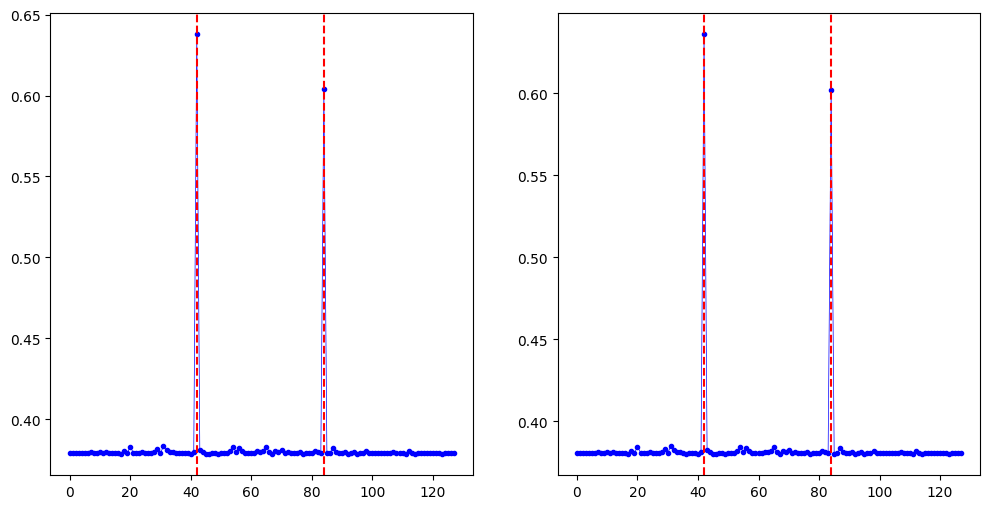



Number of leaking points: 4


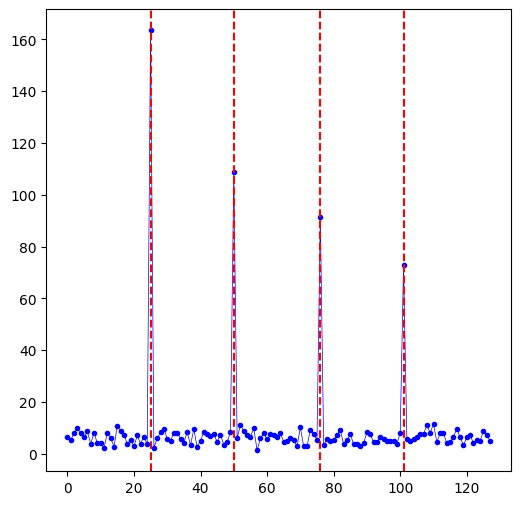

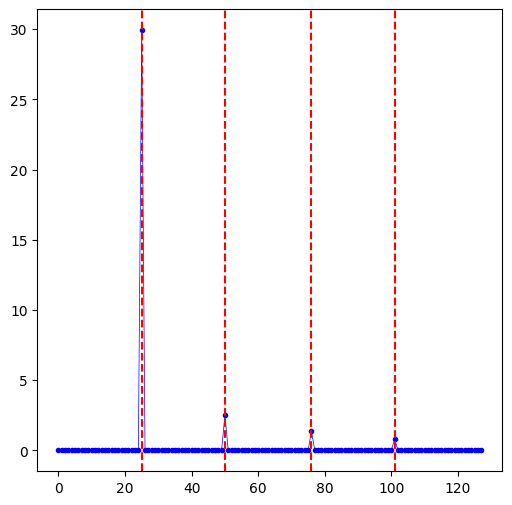

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:26<00:00,  5.76it/s]


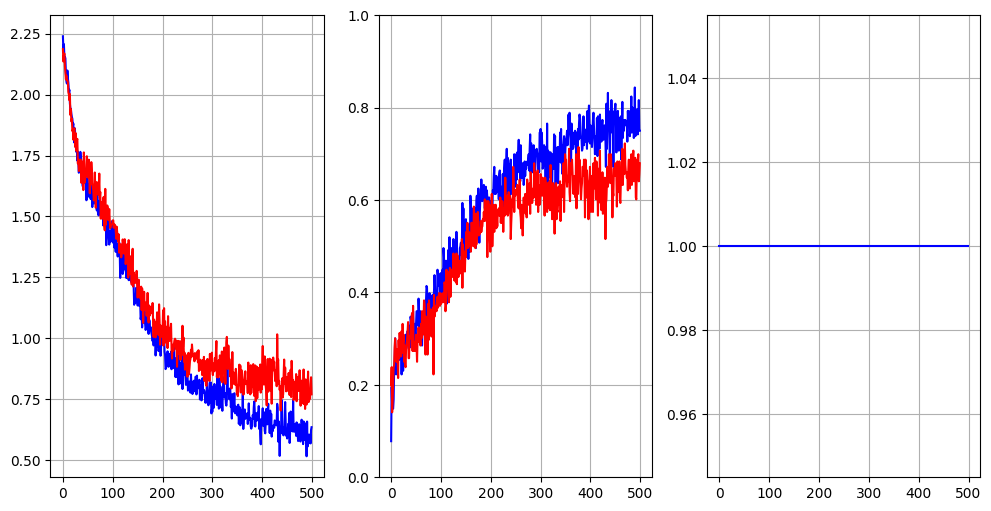

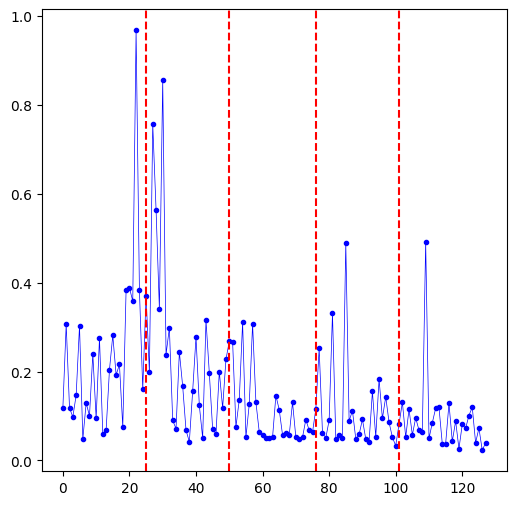

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.51it/s]


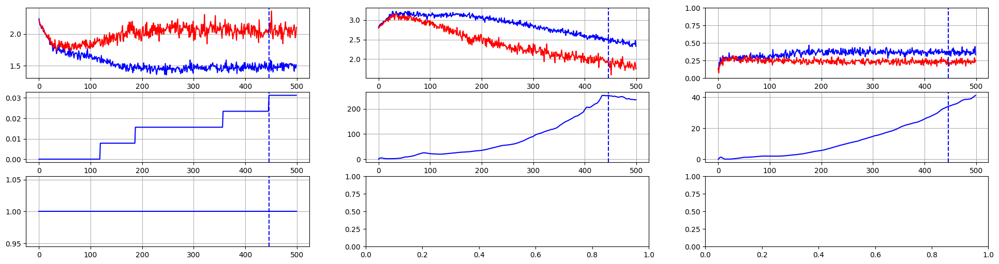

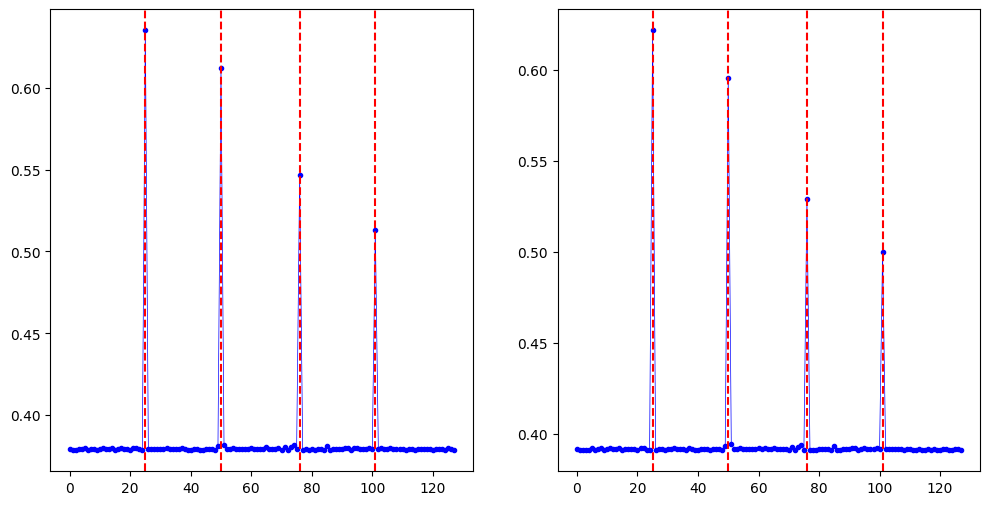



Number of leaking points: 8


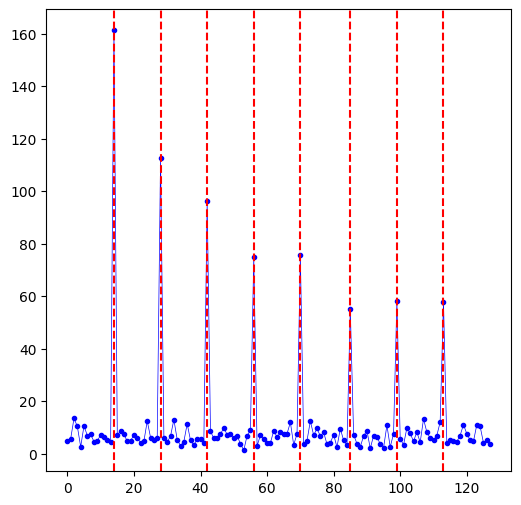

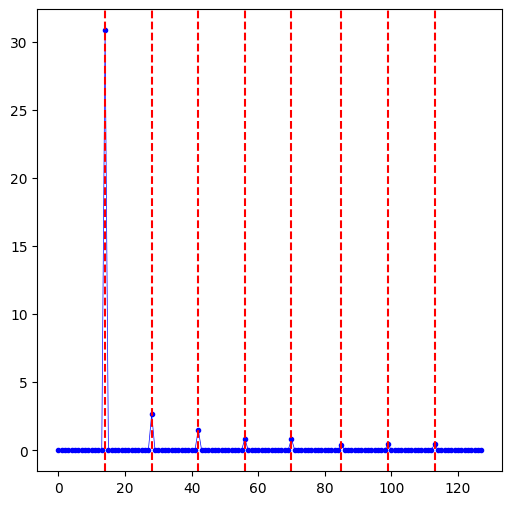

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.74it/s]


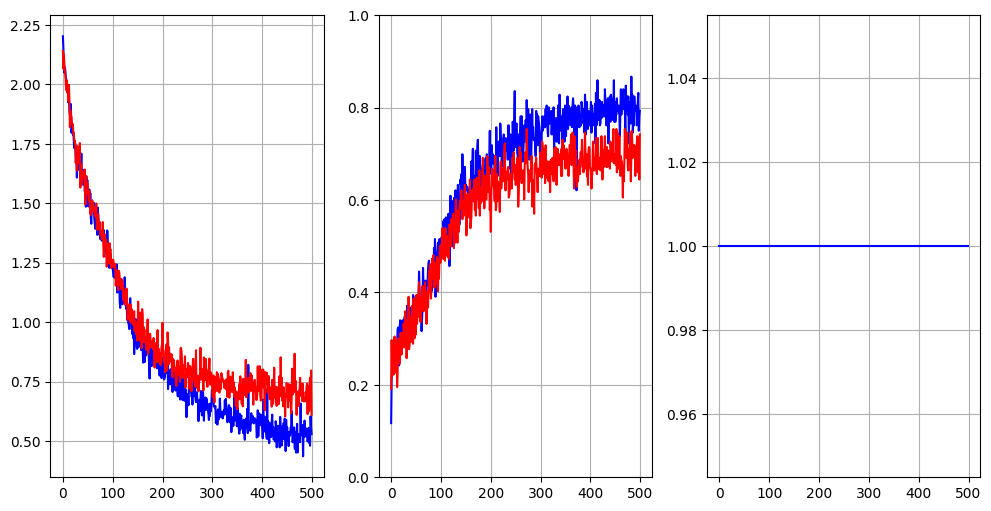

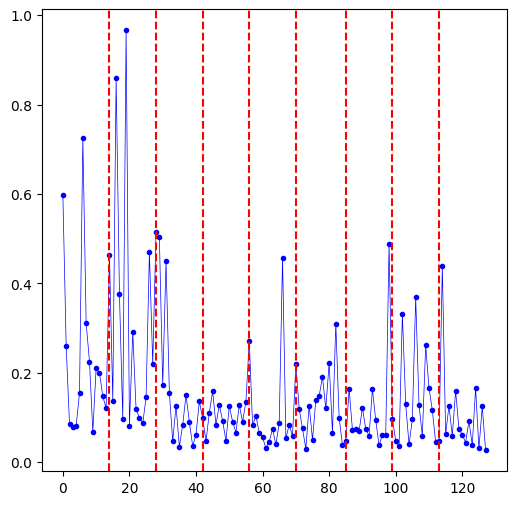

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.48it/s]


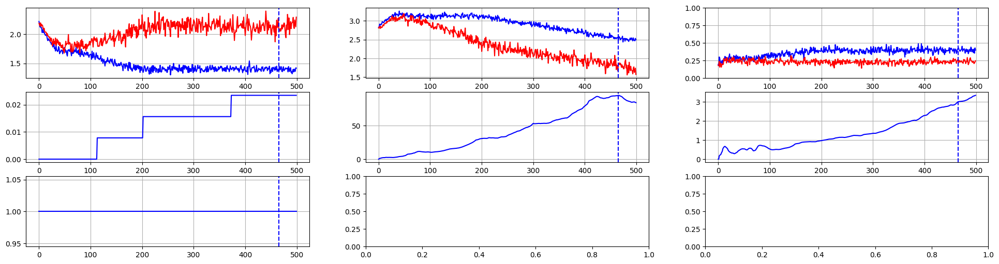

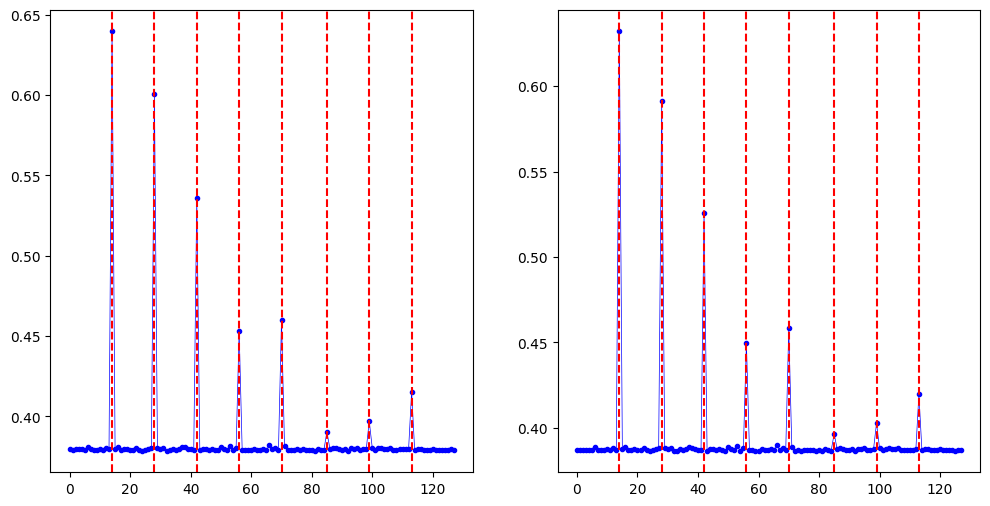



Number of leaking points: 16


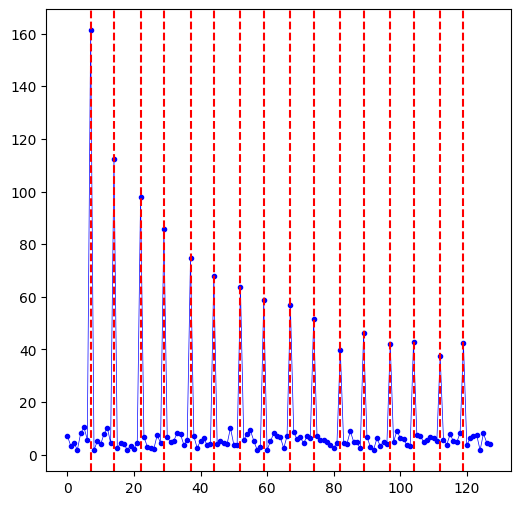

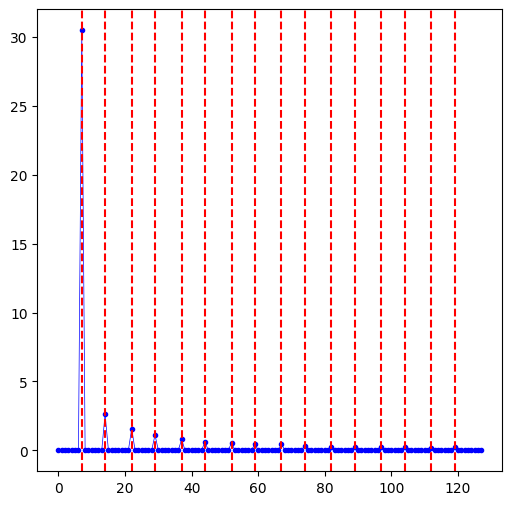

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.73it/s]


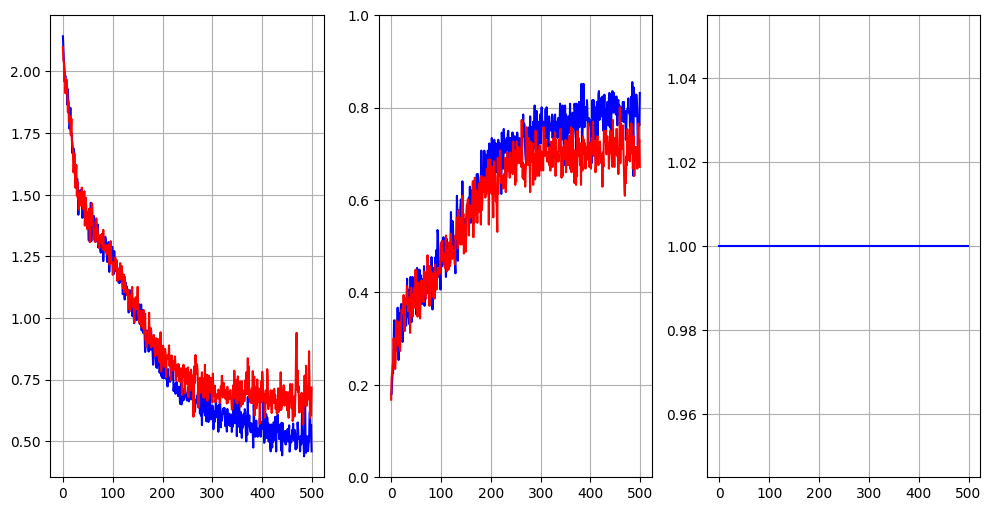

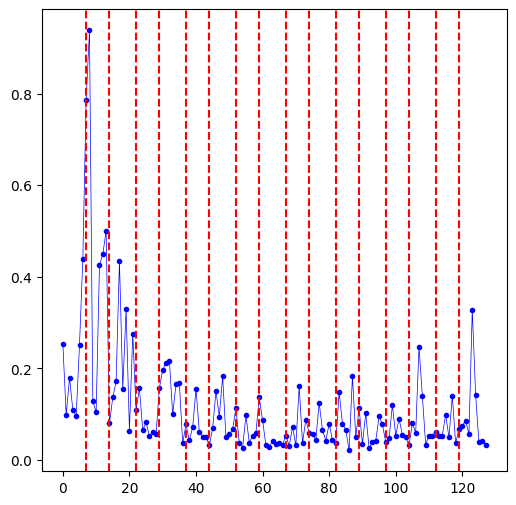

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.50it/s]


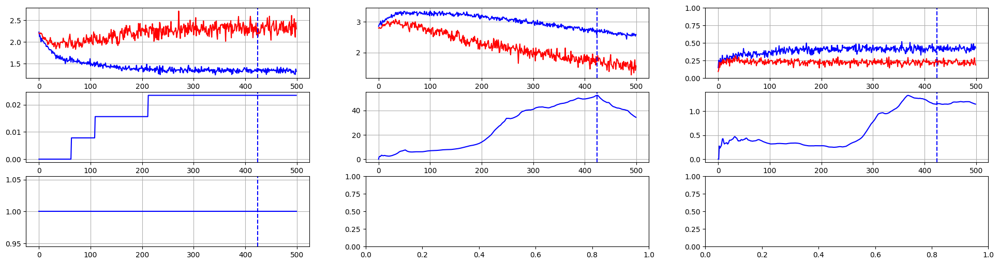

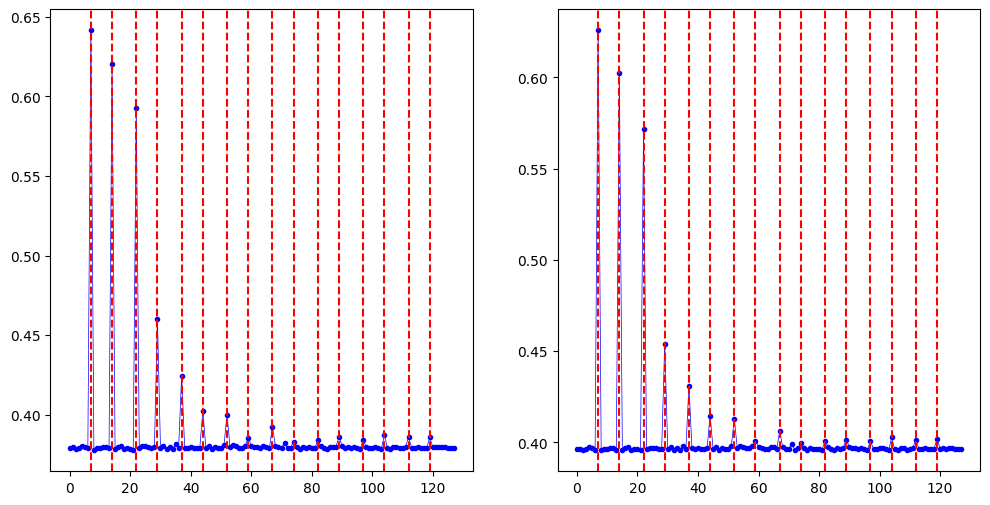



Number of leaking points: 32


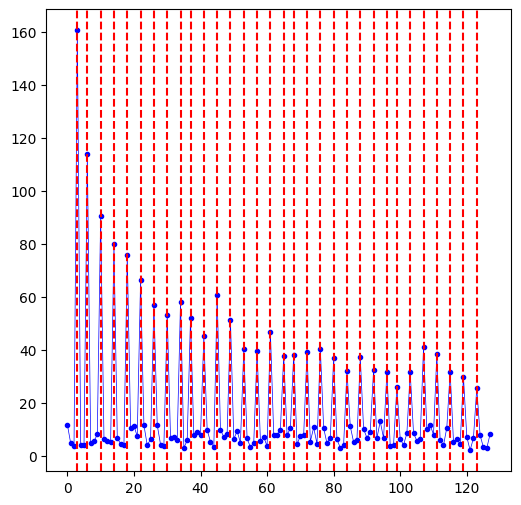

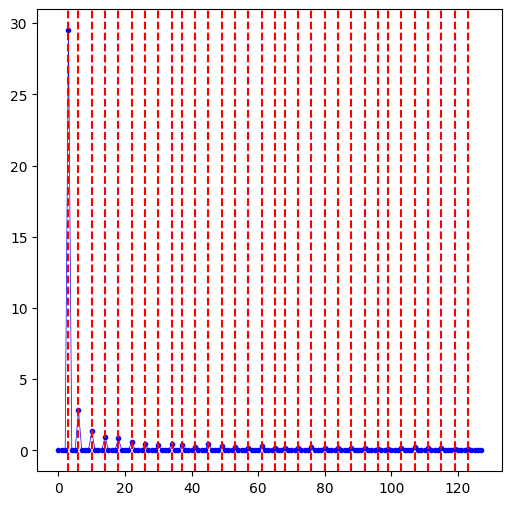

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:28<00:00,  5.66it/s]


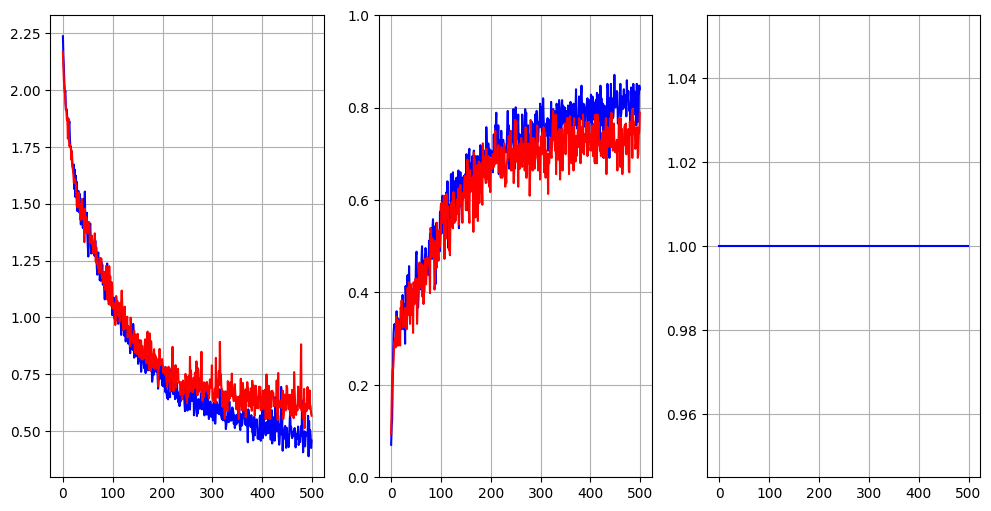

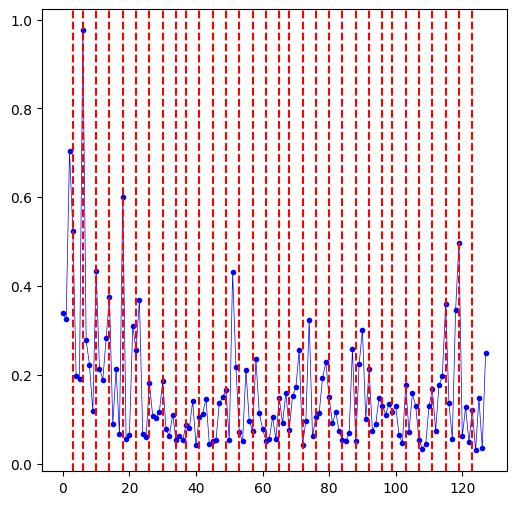

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:32<00:00,  5.38it/s]


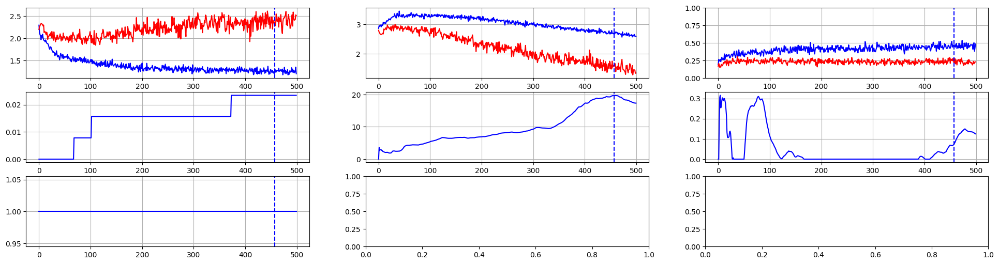

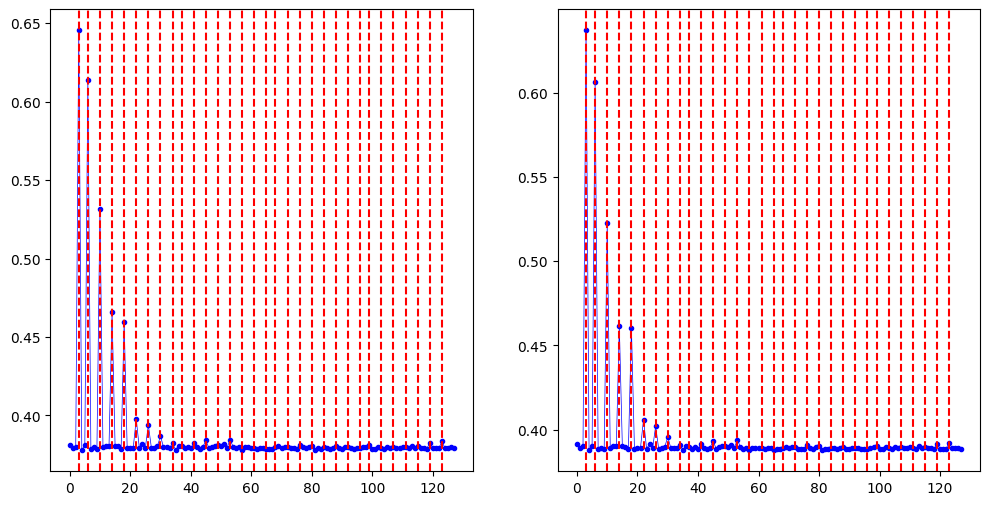



Number of leaking points: 64


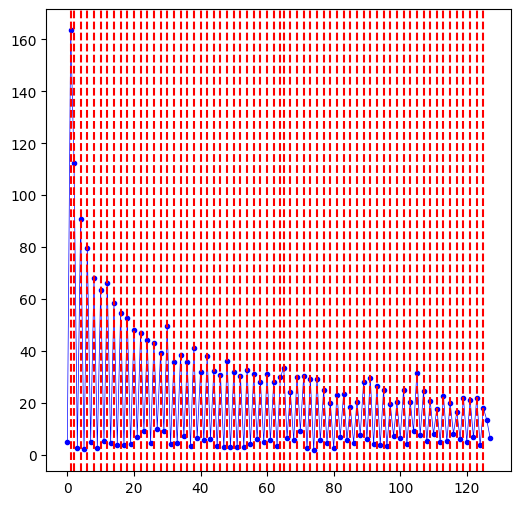

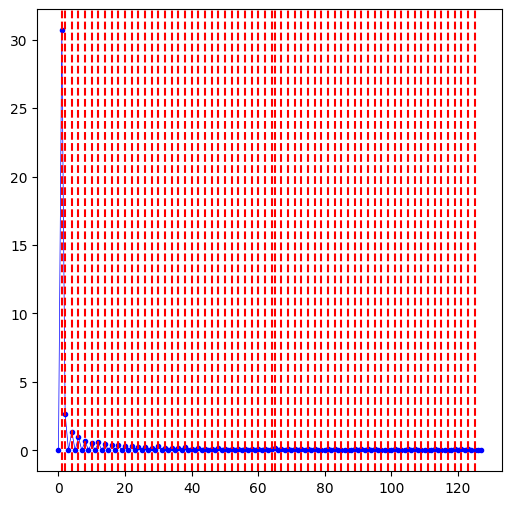

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:28<00:00,  5.66it/s]


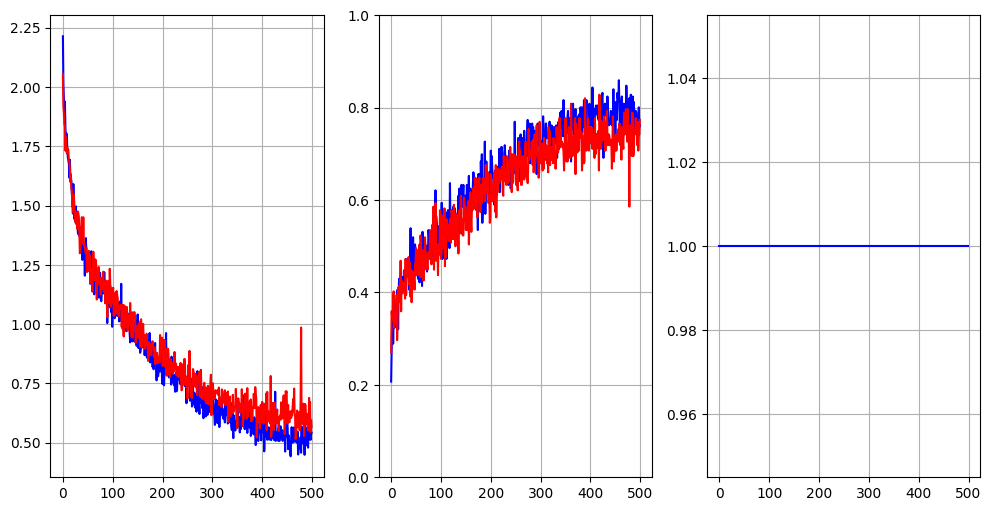

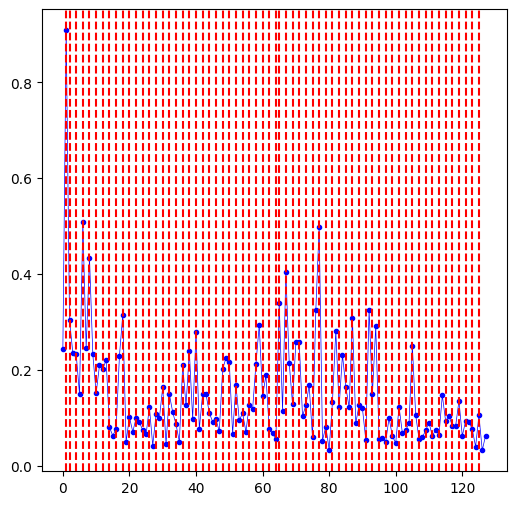

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.44it/s]


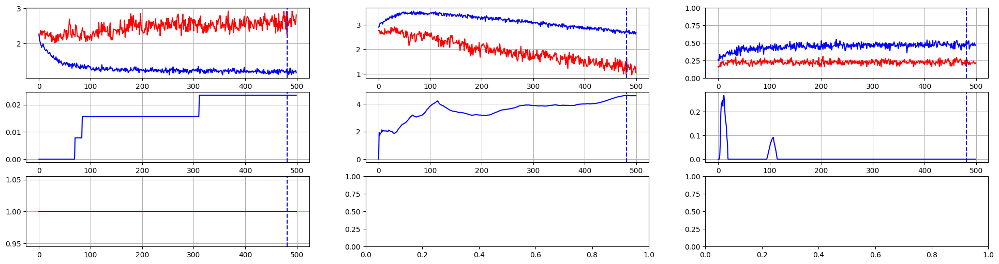

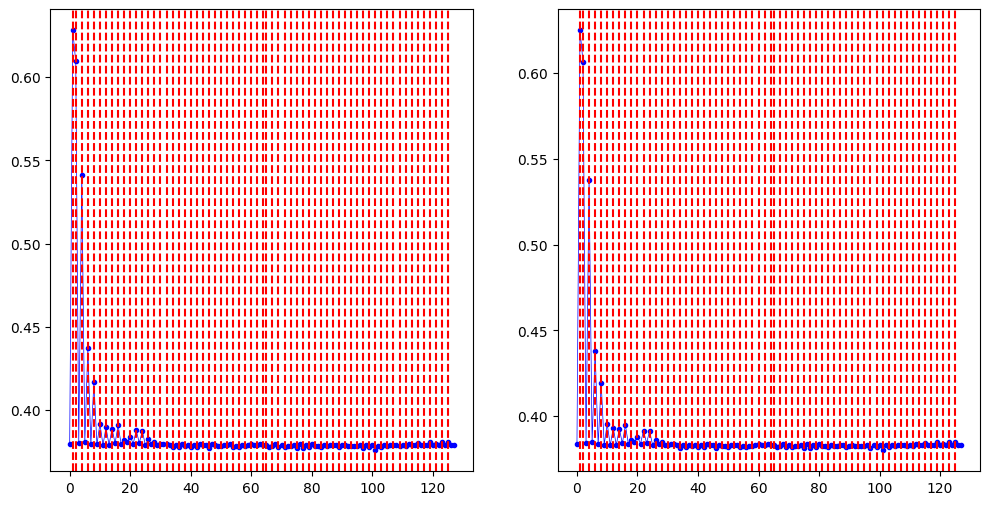

In [16]:
np_mean_ratios, np_max_ratios = [], []
leaking_point_counts = [1, 2, 4, 8, 16, 32, 64]
for leaking_point_count in leaking_point_counts:
    print('Number of leaking points:', leaking_point_count)
    hamming_weight_variance_prop = [0.9/(x+1) for x in range(leaking_point_count)]
    dataset = SyntheticAES__Finite(
        dataset_size=10000, num_samples=128,
        points=np.array([128//(leaking_point_count+1) + x*128//(leaking_point_count+1) for x in range(leaking_point_count)]),
        varying_noise_stdev=1.0, hamming_weight_variance_prop=hamming_weight_variance_prop,
        num_leaking_samples=leaking_point_count, num_xor_samples=0, target=target, delay_size=0
    )
    train_dataset, holdout_dataset = torch.utils.data.random_split(dataset, (len(dataset)//2, len(dataset)-len(dataset)//2))
    trace_means = get_trace_means(dataset)
    run_sod_trial(dataset)
    run_snr_trial(dataset)
    run_cnn_trial(train_dataset, holdout_dataset)
    mean_ratio, max_ratio = run_gan_trial(train_dataset, holdout_dataset)
    np_mean_ratios.append(mean_ratio)
    np_max_ratios.append(max_ratio)
    print()
    print()

Maximum delay: 0


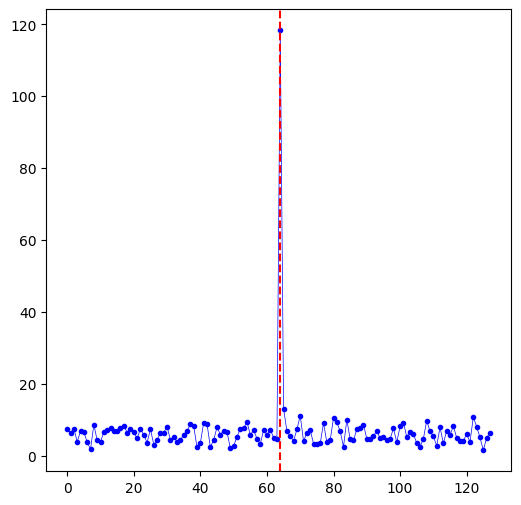

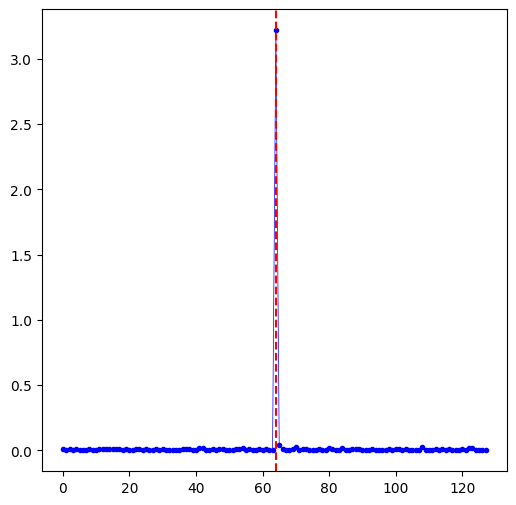

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:29<00:00,  5.60it/s]


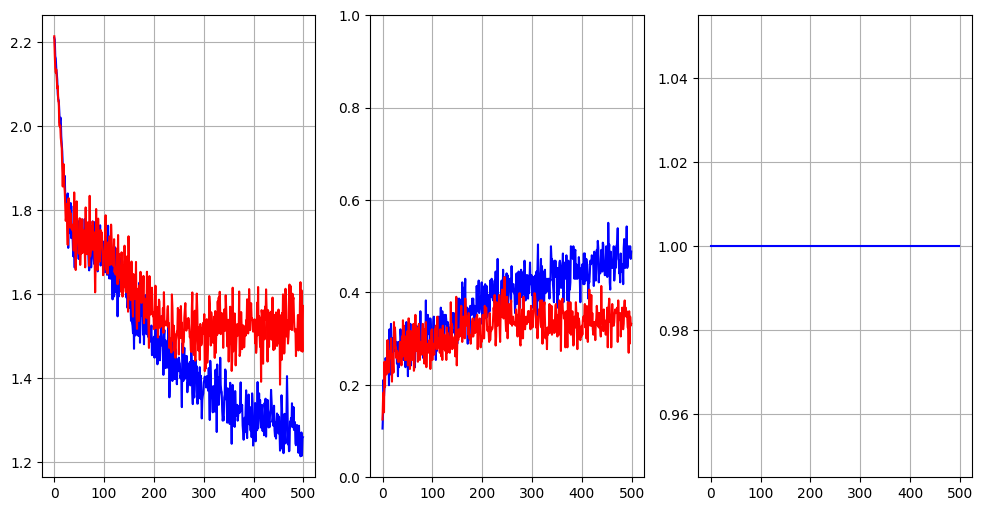

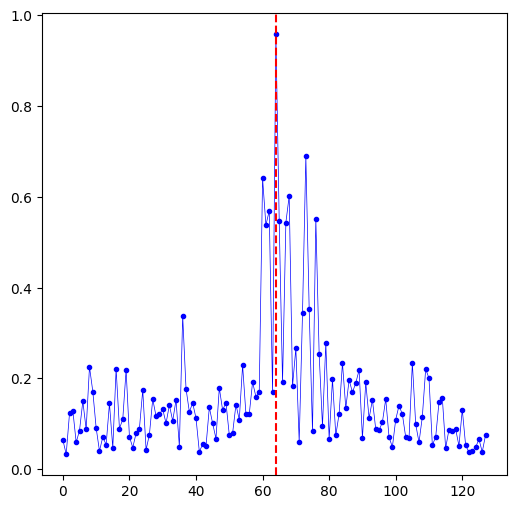

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.46it/s]


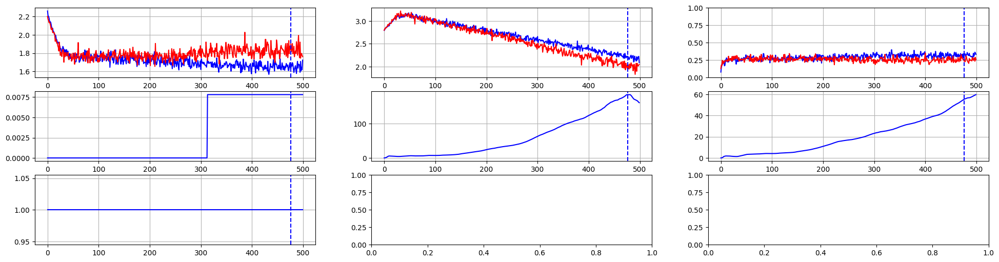

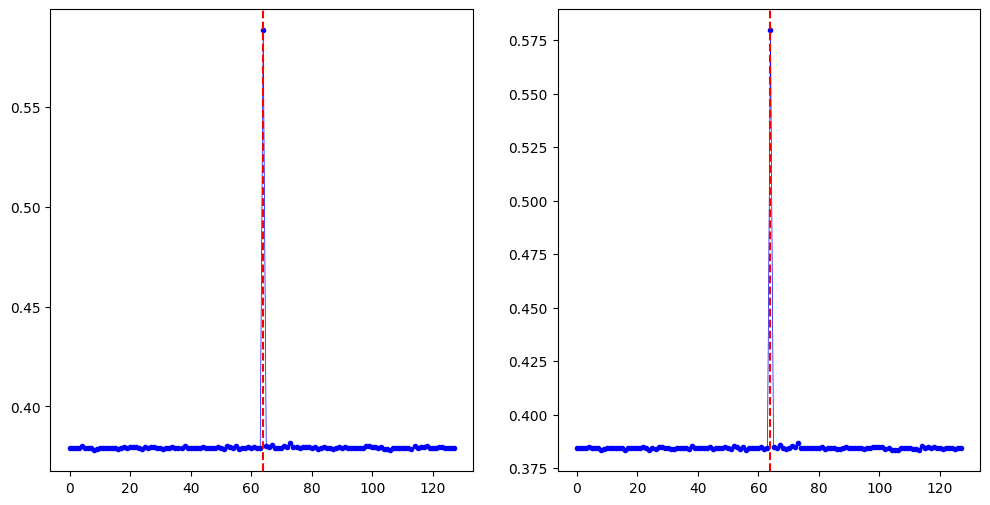



Maximum delay: 1


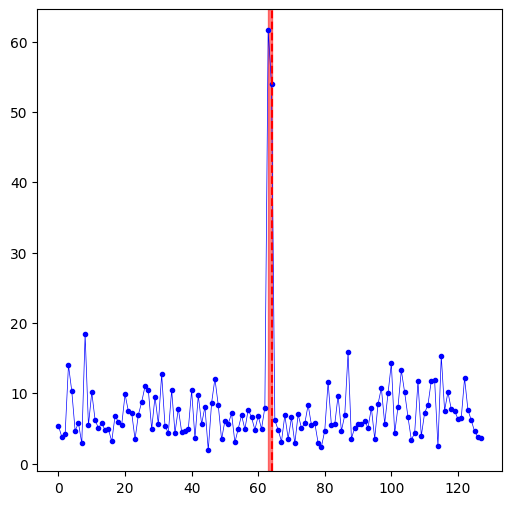

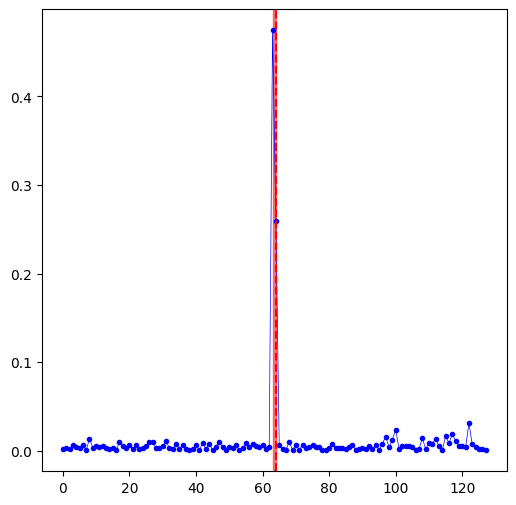

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.72it/s]


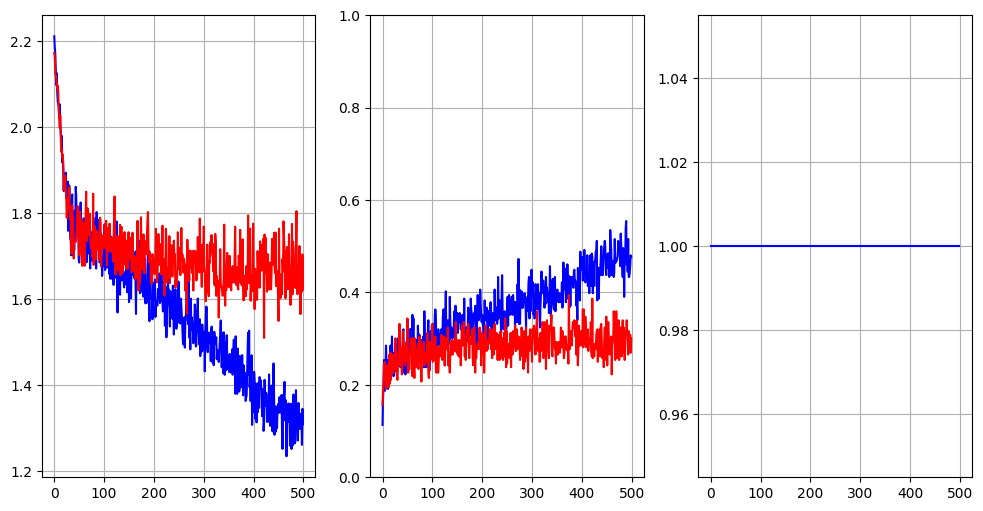

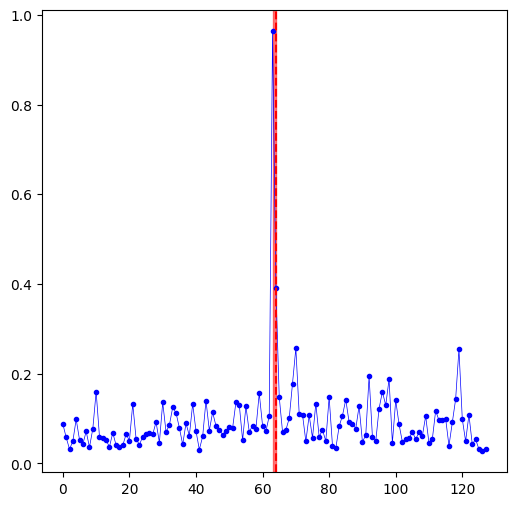

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [02:00<00:00,  4.16it/s]


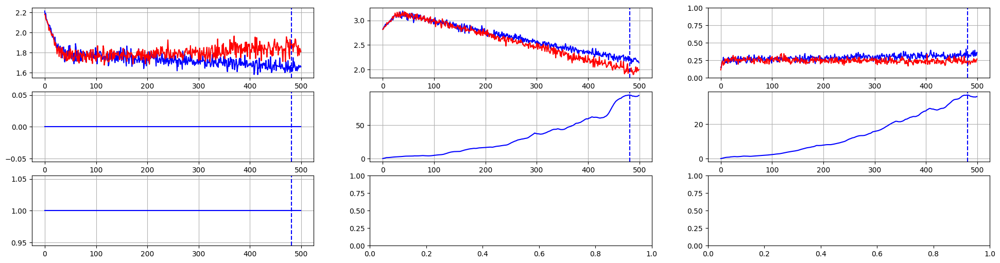

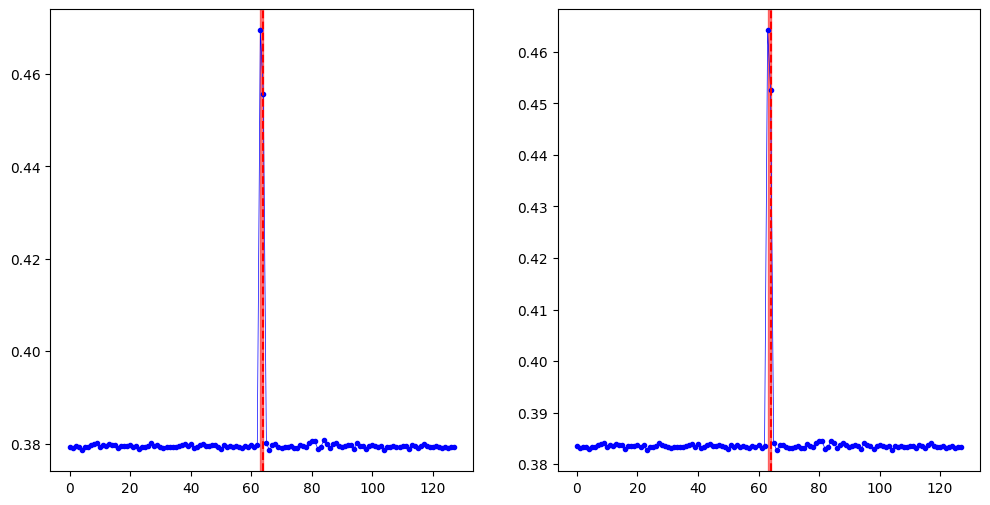



Maximum delay: 2


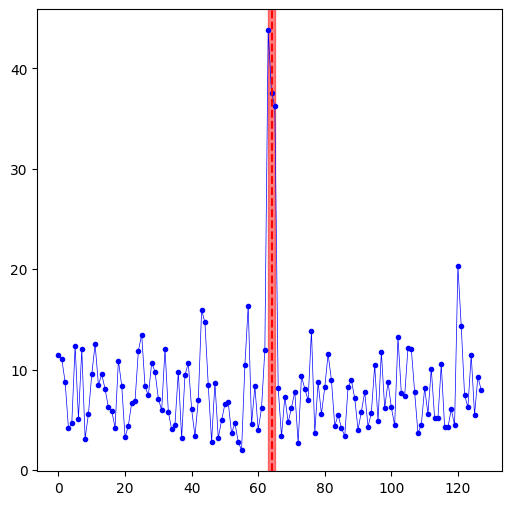

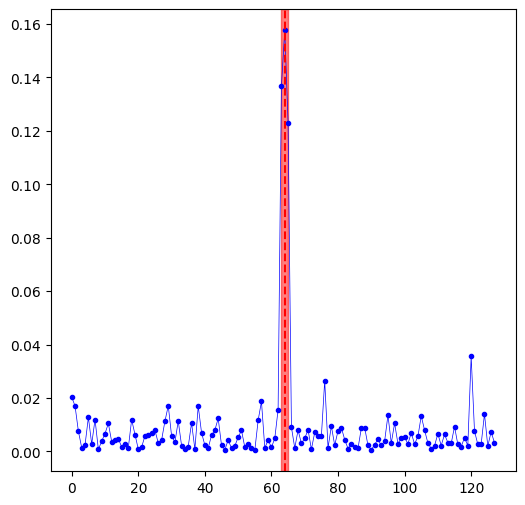

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.69it/s]


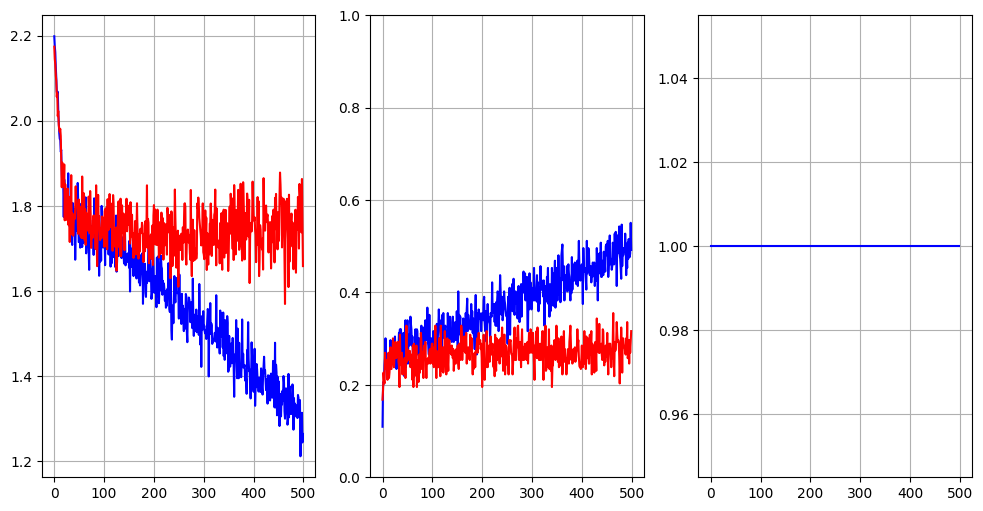

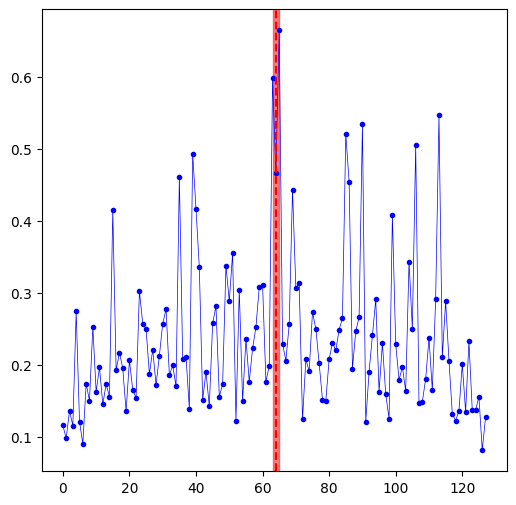

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.46it/s]


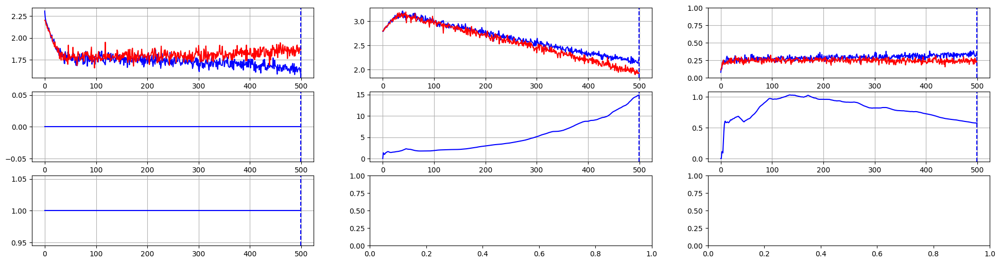

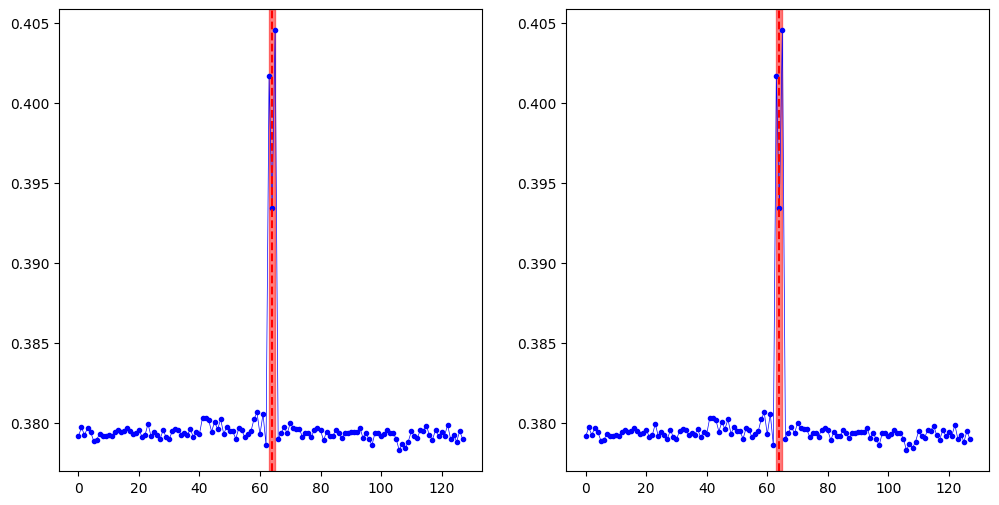



Maximum delay: 4


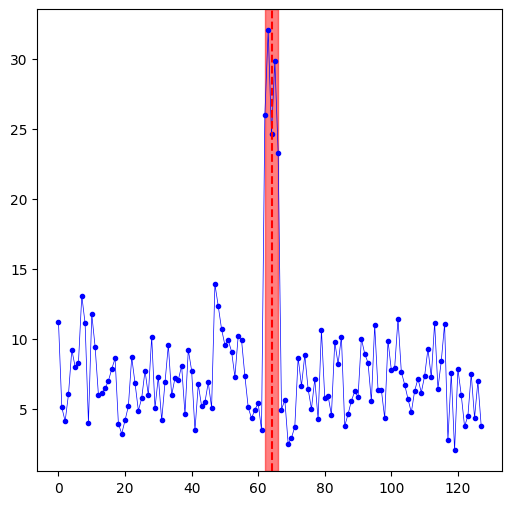

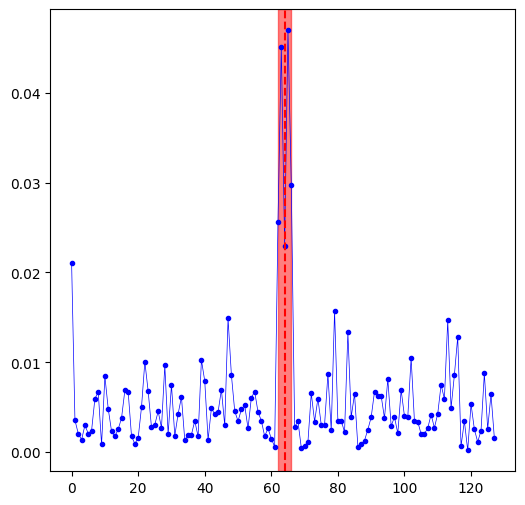

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:28<00:00,  5.68it/s]


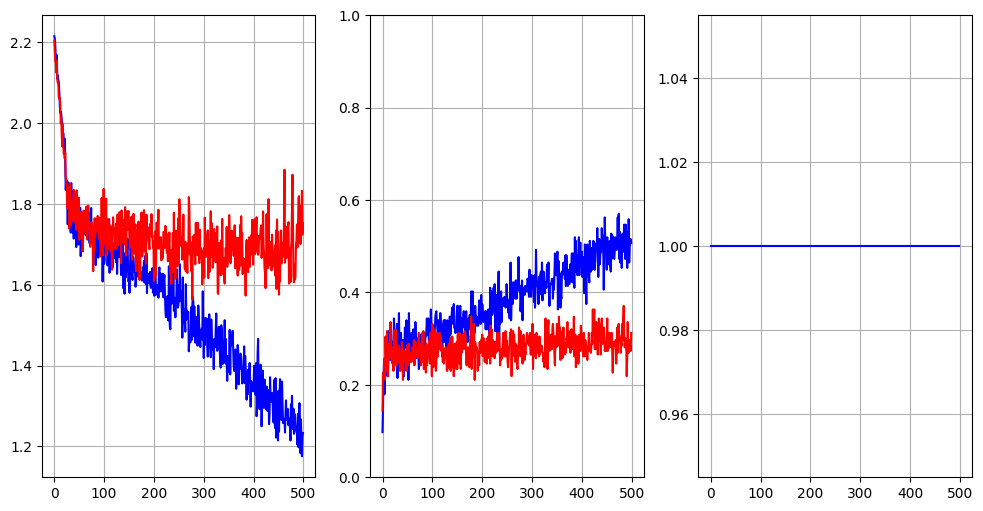

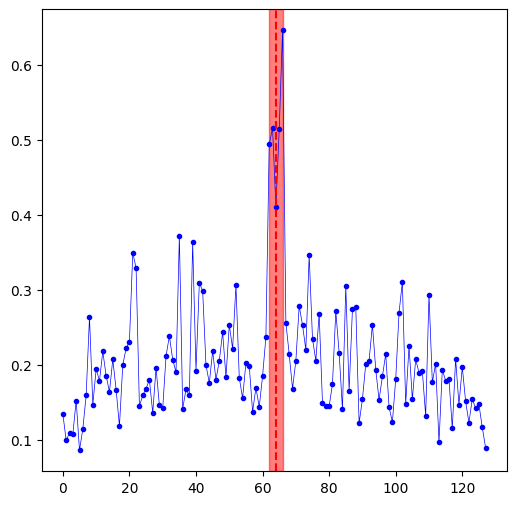

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:32<00:00,  5.42it/s]


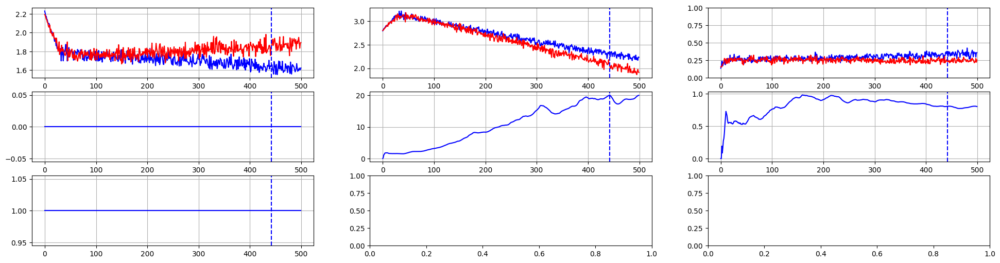

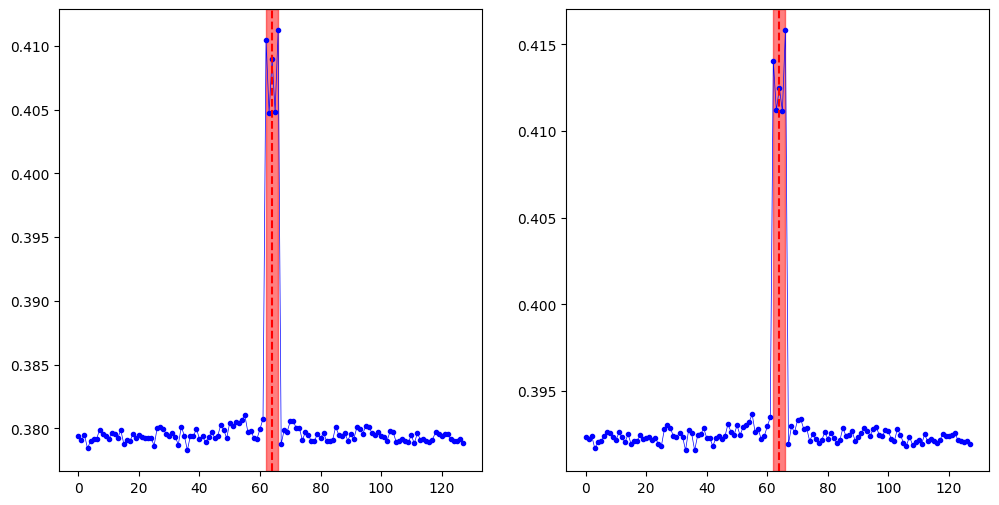



Maximum delay: 8


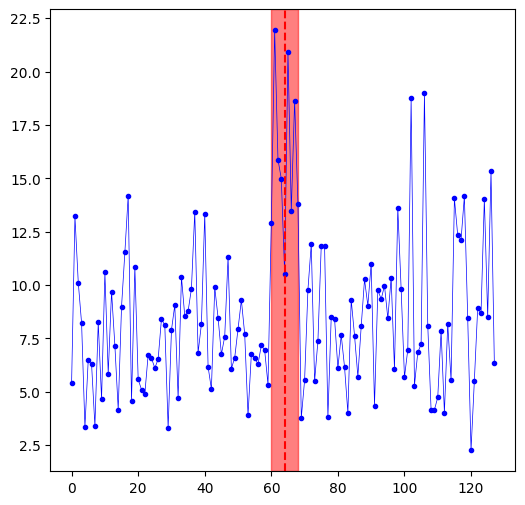

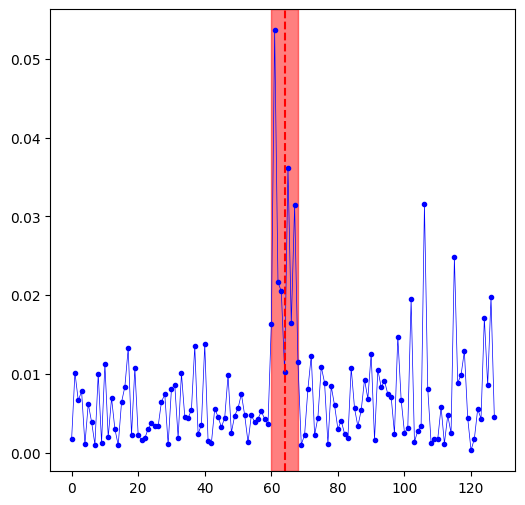

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:28<00:00,  5.66it/s]


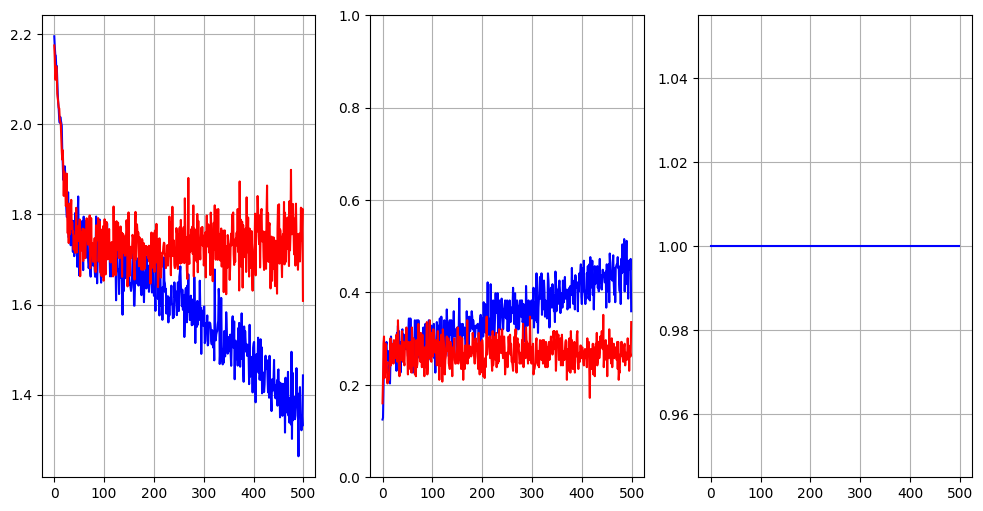

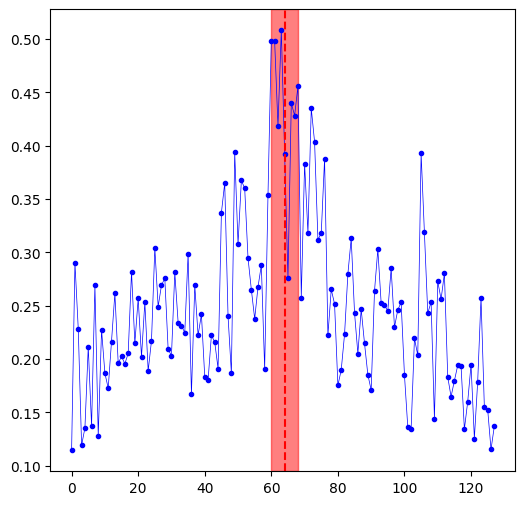

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.25it/s]


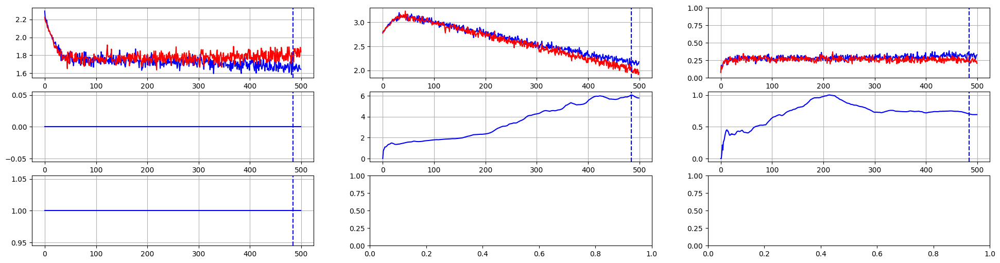

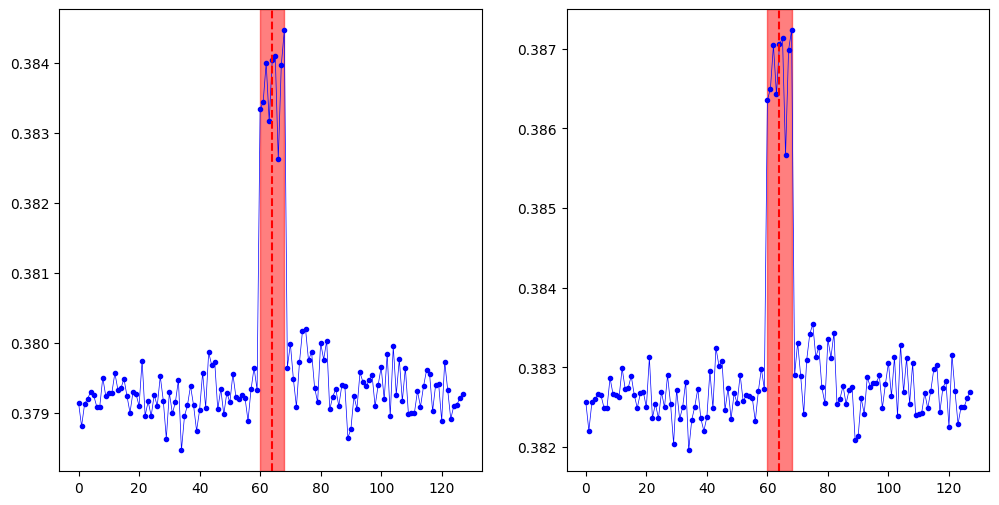



Maximum delay: 16


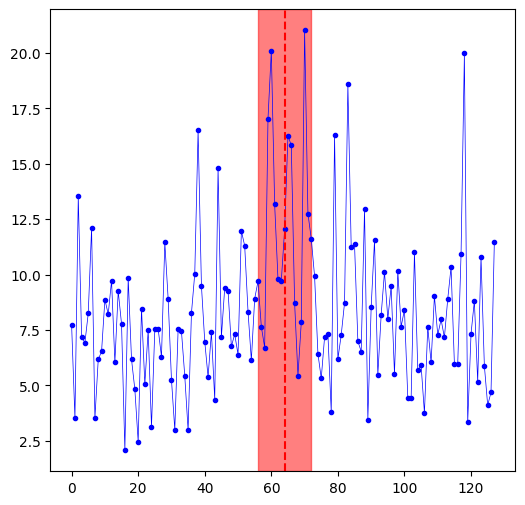

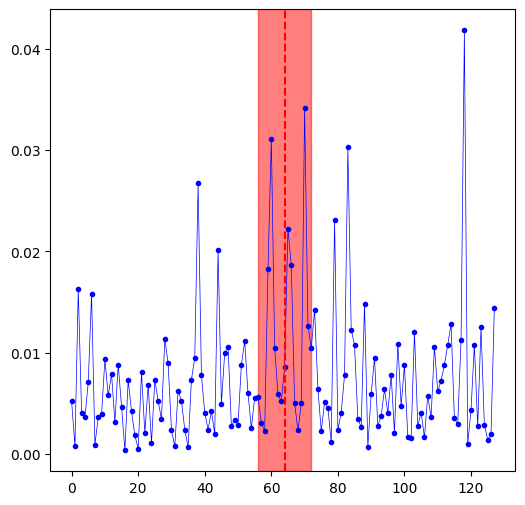

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.73it/s]


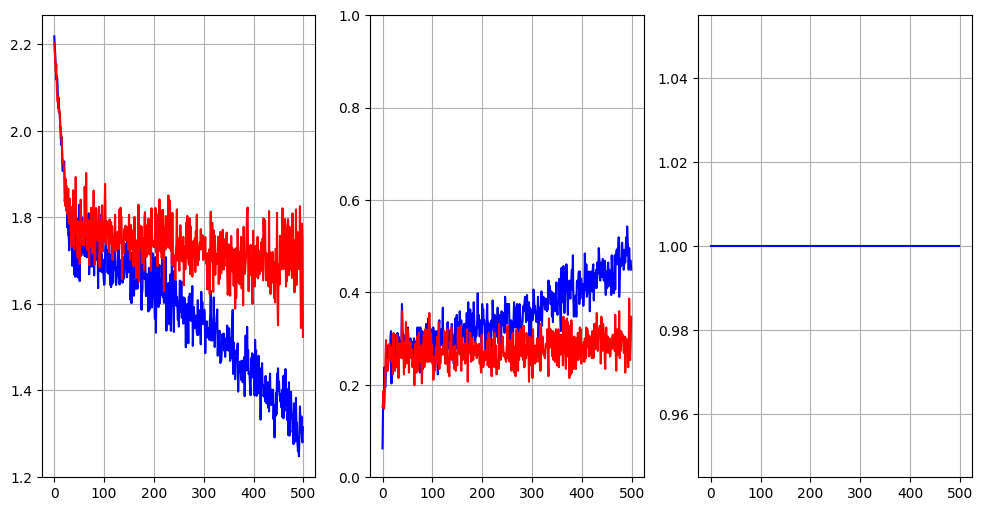

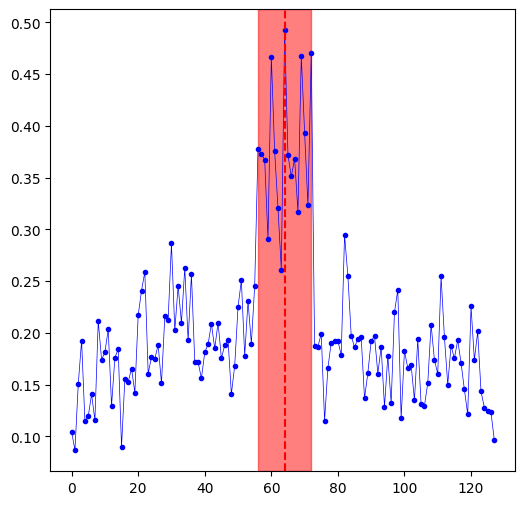

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.45it/s]


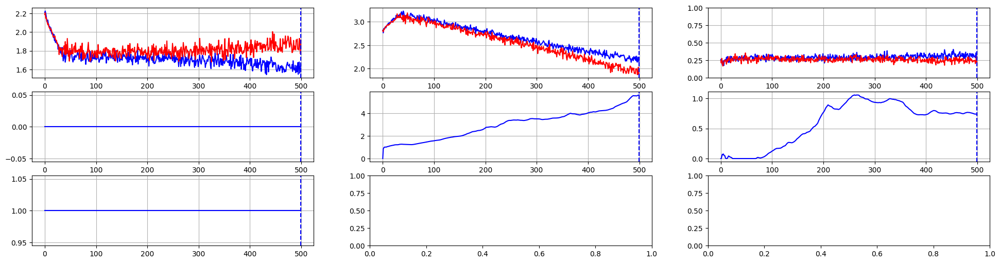

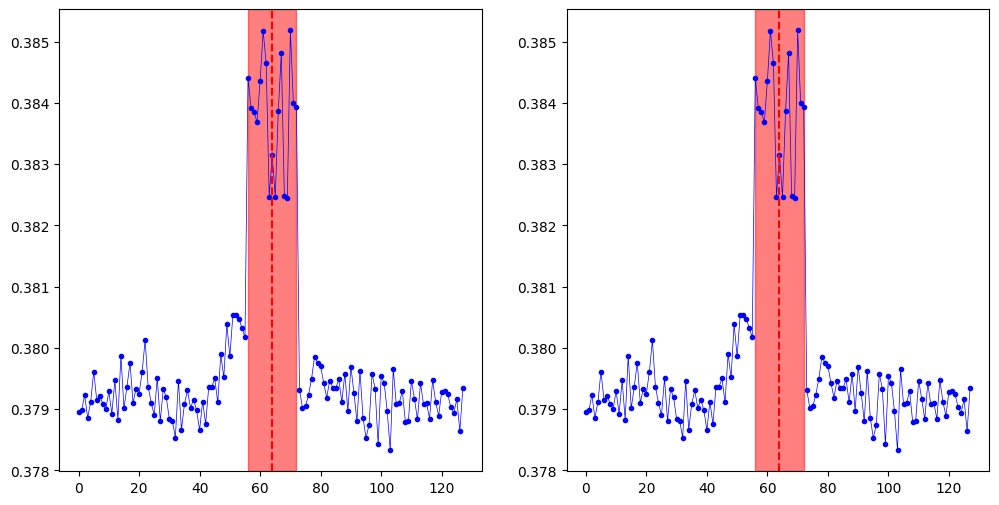



Maximum delay: 32


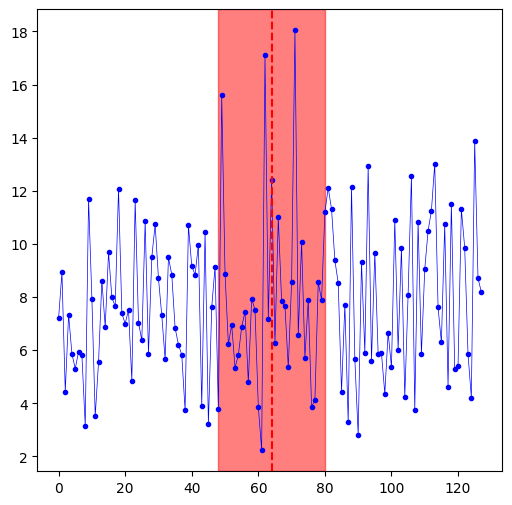

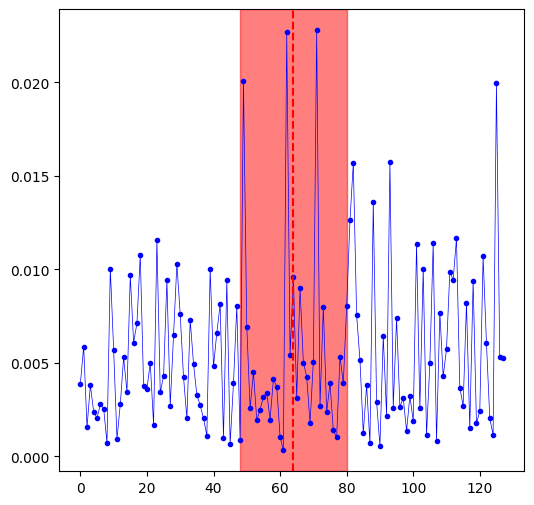

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:28<00:00,  5.65it/s]


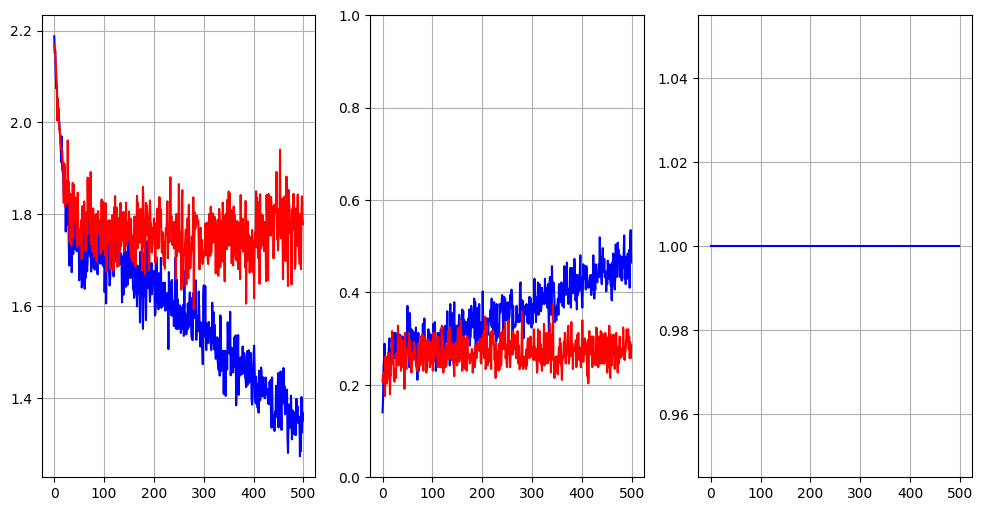

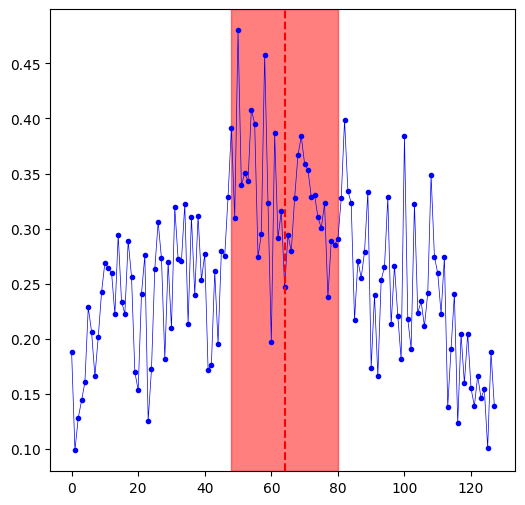

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.47it/s]


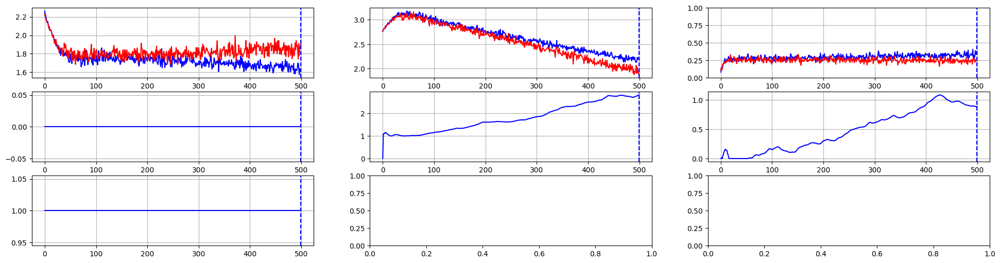

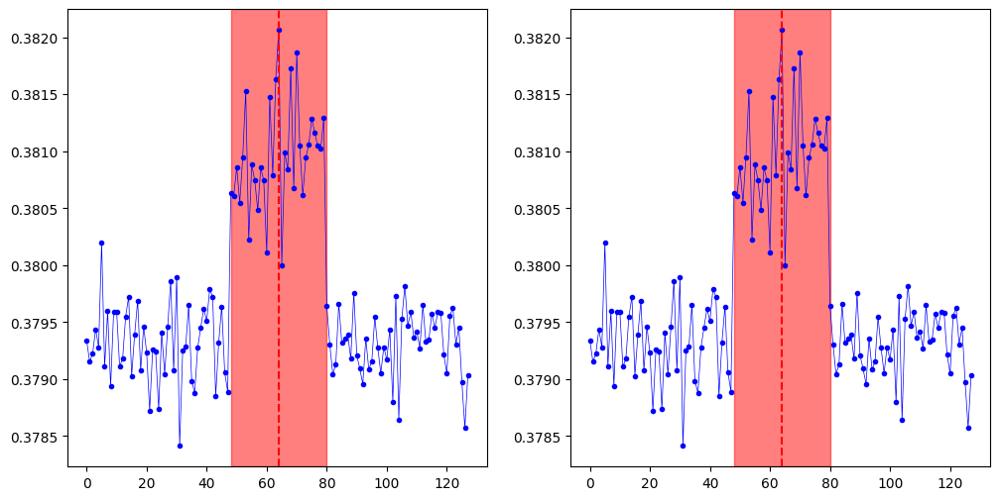



Maximum delay: 64


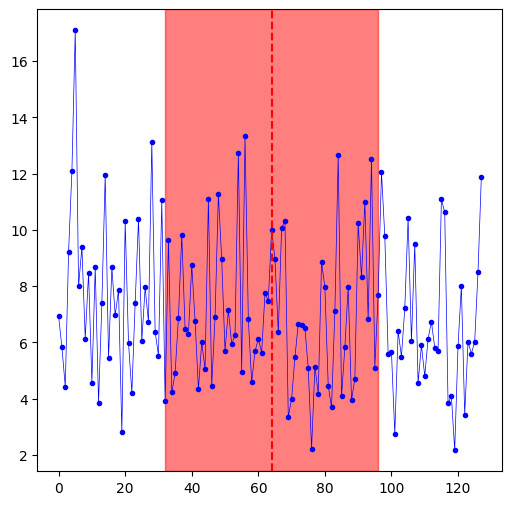

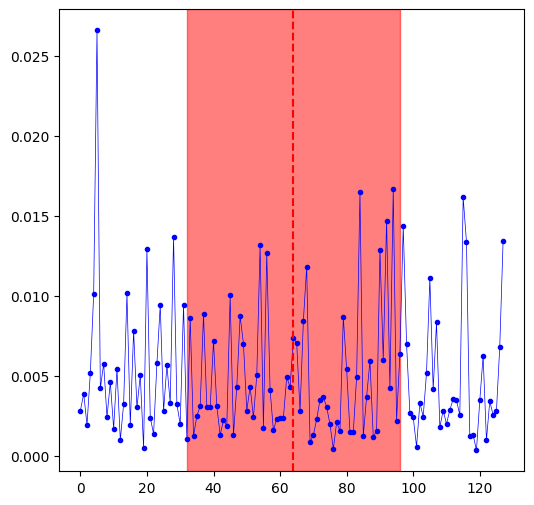

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:27<00:00,  5.71it/s]


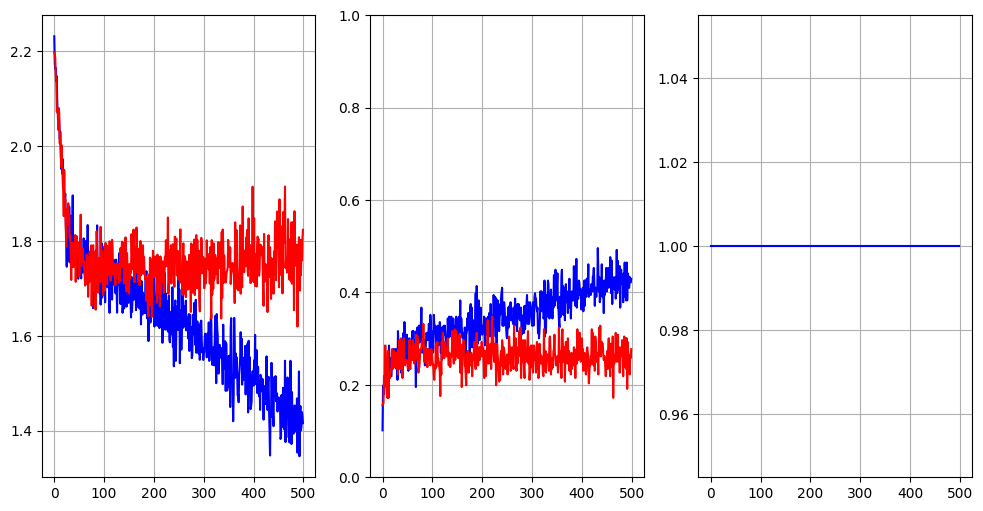

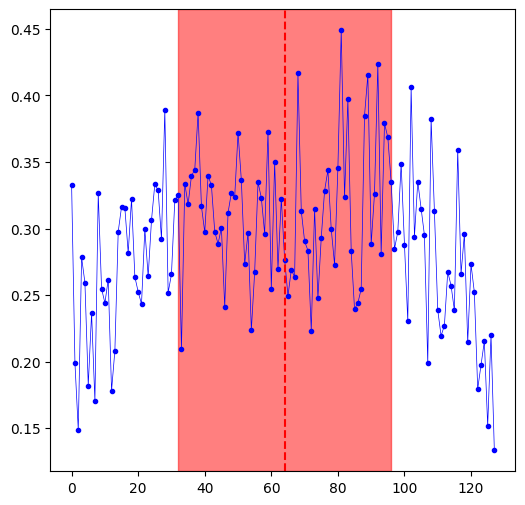

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:32<00:00,  5.40it/s]


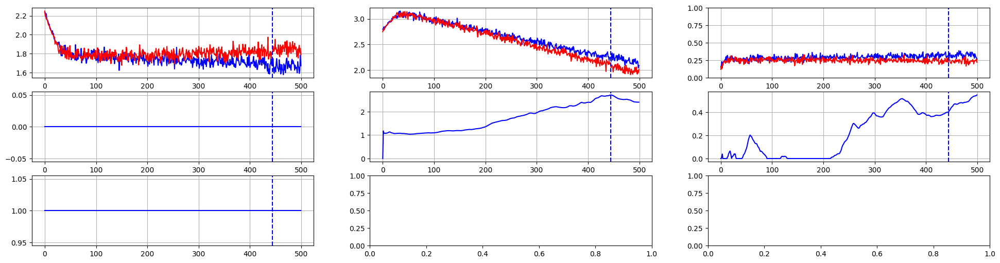

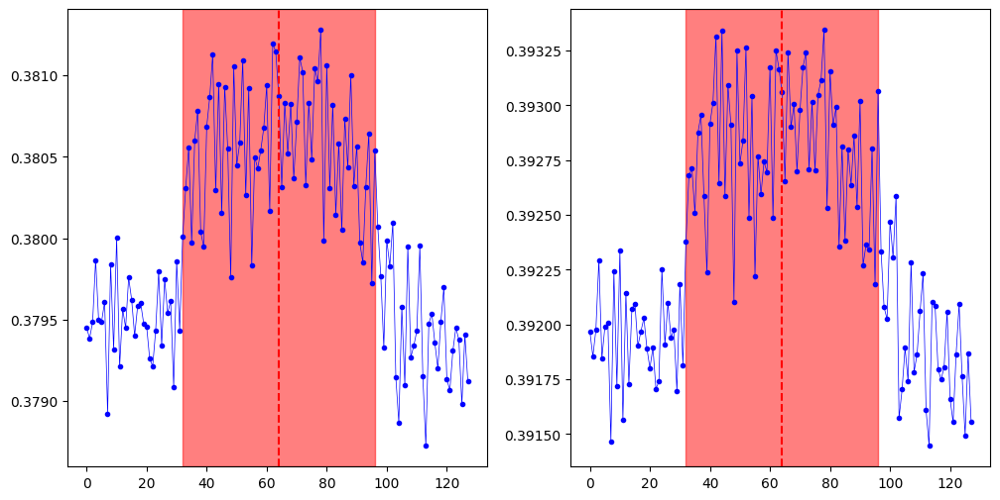



Maximum delay: 128


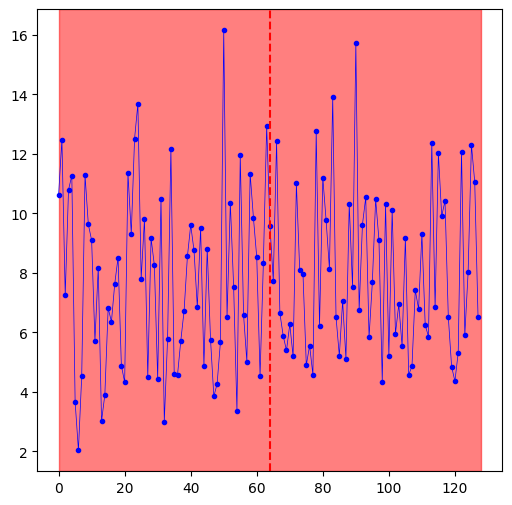

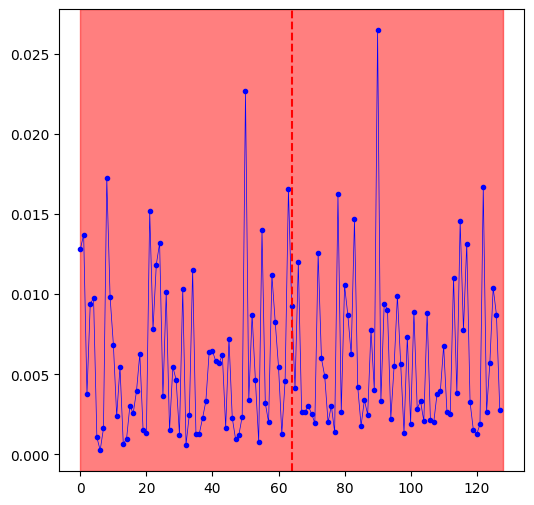

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.48it/s]


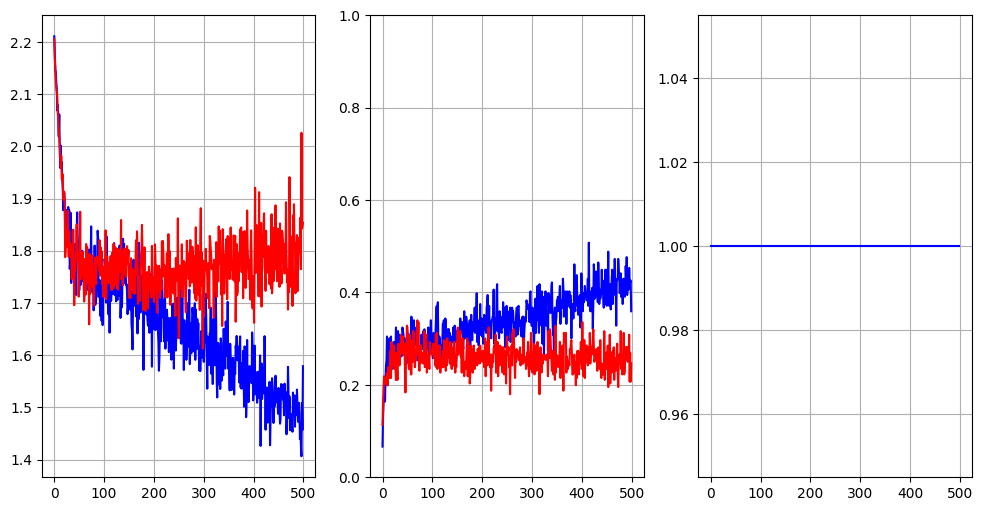

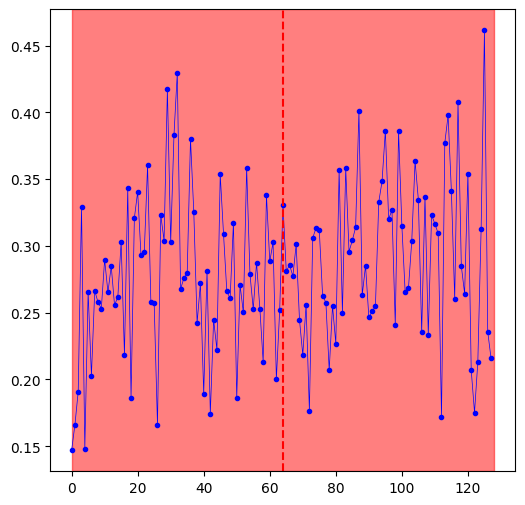

  0%|                                                                                                                                              | 0/500 [00:00<?, ?it/s]/home/min/a/jgammell/miniconda3/envs/sca-defense/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/min/a/jgammell/miniconda3/envs/sca-defense/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


ValueError: zero-size array to reduction operation maximum which has no identity

In [17]:
np_mean_ratios, np_max_ratios = [], []
delay_values = [0, 1, 2, 4, 8, 16, 32, 64]
for delay_value in delay_values:
    print('Maximum delay:', delay_value)
    dataset = SyntheticAES__Finite(
        dataset_size=10000, num_samples=128,
        points=np.array([leakage_point]),
        varying_noise_stdev=1.0, hamming_weight_variance_prop=0.5,
        num_leaking_samples=1, num_xor_samples=0, target=target, delay_size=delay_value
    )
    train_dataset, holdout_dataset = torch.utils.data.random_split(dataset, (len(dataset)//2, len(dataset)-len(dataset)//2))
    trace_means = get_trace_means(dataset)
    run_sod_trial(dataset)
    run_snr_trial(dataset)
    run_cnn_trial(train_dataset, holdout_dataset)
    mean_ratio, max_ratio = run_gan_trial(train_dataset, holdout_dataset)
    np_mean_ratios.append(mean_ratio)
    np_max_ratios.append(max_ratio)
    print()
    print()